# 8 ML-ENSO - GNNs

In [1]:
print("hello world")

hello world


## Imports 

In [2]:
# IPython extension to reload modules before executing user code.
%load_ext autoreload
%autoreload 2

In [3]:
import torch
import torch.optim as optim
torch.cuda.is_available()

True

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}\n')

# Additional Info when using cuda
if device.type == 'cuda':
    print(f"• Torch cuda current device: {torch.cuda.current_device()}")
    print(f"• Torch cuda device count: {torch.cuda.device_count()}")
    print(f"• Torch cuda device name: {torch.cuda.get_device_name(0)}")

Using device: cuda

• Torch cuda current device: 0
• Torch cuda device count: 1
• Torch cuda device name: NVIDIA A40


In [5]:
import os
import pandas as pd
import numpy as np
import xarray as xr
import utils as utils
import utilities.graph_utils as graph_utils
import scipy.stats
from sklearn.metrics import mean_squared_error
import pickle
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.ticker import MultipleLocator
import matplotlib.dates as mdates

from utilities.enso_dataset import ENSOGraphDataset
from utilities.gcn_model import GCN2LayerMeanPool, GCN2LayerConcat, GCN2LayerConcat2FCs, GCN3LayerConcat
import torch.nn as nn

from torch_geometric.utils.convert import from_networkx
from torch_geometric.loader import DataLoader

from sklearn.covariance import graphical_lasso
from sklearn.covariance import GraphicalLasso
from sklearn.covariance import GraphicalLassoCV

from tqdm import tqdm

import json
import time
import networkx as nx
from datetime import datetime

from PIL import Image

In [6]:
from torchinfo import summary

In [7]:
from IPython.display import Image as IPImage, display

# ============================================================

## Global variables

### Define folders

In [8]:
RESULTS_FOLDER = 'saved_results'
RESULTS_ONI_FOLDER = 'saved_results/oni'
RESULTS_NINO34_FOLDER = 'saved_results/nino34'
RESULTS_EC_FOLDER = 'saved_results/ec'

target_to_results_folder = {
    "oni": RESULTS_ONI_FOLDER,
    "nino34": RESULTS_NINO34_FOLDER,
    "E": RESULTS_EC_FOLDER,
    "C": RESULTS_EC_FOLDER
}
target_to_results_folder

{'oni': 'saved_results/oni',
 'nino34': 'saved_results/nino34',
 'E': 'saved_results/ec',
 'C': 'saved_results/ec'}

### Hyperparam Grid Search Results

In [9]:
# with open('gnn_cv_results_4.json', 'r') as file:
#     gnn_cv_results = json.load(file)

In [10]:
# sorted_gnn_cv_results = sorted(gnn_cv_results, key=lambda row: row["avg_val_loss"])

# print("\nSorted Top 5 GNN CV results: ")
# for result_dict in sorted_gnn_cv_results[:5]:
#     print(f"• params: {str(result_dict['params']):>120} \tavg_val_loss: {result_dict['avg_val_loss']:.5f}")

In [11]:
# print("\nBest combination of params: ")
# hparams = sorted_gnn_cv_results[0]['params']
# hparams

### General settings

In [12]:
GENERAL_MODE = "view_results_only" # or "training" , "view_results_only"
FINETUNE_ONLY = False
TARGETS = ["E", "C"] # or ["E", "C", "oni", "nino34"]
TARGETS_STR = ''.join(TARGETS)
INPUT_TIME_STEPS = 3
START_LEAD_TIME = 0
MAX_LEAD_TIME = 25
LEAD_TIME_STEP = 1

SAVE_PLOTS_TO_DISK = True

In [13]:
for target in TARGETS:
    parent_directory = target_to_results_folder[target]
    directory = os.path.join(parent_directory, "gnn")
    
    if os.path.isdir(directory):
        print(f"{directory} already exist")
    else:
        print(f"Create new directory for {directory}")
        os.makedirs(directory, exist_ok=True) 

saved_results/ec/gnn already exist
saved_results/ec/gnn already exist


### Training settings

In [14]:
BATCH_SIZE = 128
NUM_EPOCHS_TRAIN = 20
NUM_EPOCHS_FINETUNE = 20

### Graph settings

In [15]:
NODES_SEL_METHOD = "Correlation" # "GLasso", "Correlation" or "Proximity"
NODES_TRIM_METHOD = "MostEdgesCC" # "LargestCC", "MostEdgesCC" or "MinDegree"
REMOVE_CONTINENTAL_NODES = True
FILLNA = False
INVALID_NODES_HANDLING = "complete_case" # or "mask"
CARTOGRAPHIC_PROJECTIONS = ["Orthographic"] # ["Orthographic", "Mollweide", "Robinson", "AlbersEqualArea", "Miller"]

DIFFERENT_GRAPH_PER_LEAD = False

if NODES_SEL_METHOD == "Proximity":
    SUBTITLE = f"Edges Selected Based on Proximity (One-Hop Neighbors)"
    SUBTITLE_SHORT = f"Proximity (1-Hop)"
    IMG_FILENAME_TAG = "proximity"
    SHRINKAGE = 0
elif NODES_SEL_METHOD == "Correlation":
    CORR_COEF_THRESHOLD = 0.90
    CORR_COEF_STR = f"{CORR_COEF_THRESHOLD:.2f}".replace('.',"")
    SUBTITLE = f"Edges Selected Based on Correlation > {CORR_COEF_THRESHOLD}"
    SUBTITLE_SHORT = f"Corr > {CORR_COEF_THRESHOLD}"
    IMG_FILENAME_TAG = f"CorrThr{CORR_COEF_STR}"
    SHRINKAGE = 0
elif NODES_SEL_METHOD == "GLasso":
    # High alpha: sparser model (fewer edges). Might underfit data but simpler and more interpretable
    # Low alpha: denser model (more edges). Might overfit data but captures more conditional dependencies.
    GLASSO_ALPHA = 0.3
    GLASSO_ALPHA_STR = f"{GLASSO_ALPHA:.2f}".replace('.',"")
    # GLASSO_ALPHA_STR = "CV"
    SHRINKAGE = 0
    SUBTITLE = f"Edges Selected Using GLasso, alpha={GLASSO_ALPHA}, shrinkage={SHRINKAGE}"
    SHRINKAGE_STR = f"{SHRINKAGE:.2f}".replace('.',"")
    SUBTITLE_SHORT = f"GLasso (alpha={GLASSO_ALPHA}, shrinkage={SHRINKAGE})"
    SUBTITLE_SHORT = f"GLasso (alpha={GLASSO_ALPHA})"
    IMG_FILENAME_TAG = f"GLasso{GLASSO_ALPHA_STR}_Shrink{SHRINKAGE_STR}"
else:
    print(f"Invalid Nodes selection method")

SHRINKAGE_STR = f"{SHRINKAGE:.2f}".replace('.',"")

if NODES_TRIM_METHOD == "MinDegree":
    MIN_DEGREE = 0 # Set to 0 to keep all nodes, 1 to remove only isolated nodes
    NODES_TRIM_METHOD_STR = f"MinDegree{MIN_DEGREE}"
elif NODES_TRIM_METHOD == "LargestCC":
    NODES_TRIM_METHOD_STR = "LargestCC"
elif NODES_TRIM_METHOD == "MostEdgesCC":
    NODES_TRIM_METHOD_STR = "MostEdgesCC"
else:
    print(f"Invalid Nodes trim method")

print("SHRINKAGE_STR:  ", SHRINKAGE_STR)
print("NODES_SEL_METHOD:  ", NODES_SEL_METHOD)
print("NODES_TRIM_METHOD_STR: ", NODES_TRIM_METHOD_STR)
print("SUBTITLE: ", SUBTITLE)
print("SUBTITLE_SHORT: ", SUBTITLE_SHORT)
print("IMG_FILENAME_TAG: ", IMG_FILENAME_TAG)

SHRINKAGE_STR:   000
NODES_SEL_METHOD:   Correlation
NODES_TRIM_METHOD_STR:  MostEdgesCC
SUBTITLE:  Edges Selected Based on Correlation > 0.9
SUBTITLE_SHORT:  Corr > 0.9
IMG_FILENAME_TAG:  CorrThr090


### Model settings

In [16]:
MODEL_TYPE = "GCN2LayerConcat"  # or GCN2LayerMeanPool, "GCN2LayerConcat", "GCN3LayerConcat", "GCN2LayerConcat2FCs",
GCN_INPUT_FEATURES=INPUT_TIME_STEPS
GCN_HIDDEN_DIM_1=250
GCN_HIDDEN_DIM_2=250
# GCN_HIDDEN_DIM_1=100 # hparam tuning
# GCN_HIDDEN_DIM_2=200 # hparam tuning
GCN_HIDDEN_DIM_3=4
GCN_OUTPUT_DIM=1
ACTIVATION_FUNC = nn.Tanh() # nn.ReLU(), nn.LeakyReLU(), nn.Tanh(), nn.ELU()
ACTIVATION_FUNC_STR = str(ACTIVATION_FUNC).split("(")[0]
USE_BATCH_NORM=False
DROPOUT_RATE=0
# DROPOUT_RATE=0.3 # # hparam tuning
DROPOUT_RATE_STR = f"{DROPOUT_RATE:.2f}".replace('.',"")

DROPOUT_RATE_STR

MODEL_DETAILS = f"{MODEL_TYPE}_{GCN_HIDDEN_DIM_1}x{GCN_HIDDEN_DIM_2}_{ACTIVATION_FUNC_STR}_Bn{USE_BATCH_NORM}_p{DROPOUT_RATE_STR}"
MODEL_DETAILS_TITLE = f"{MODEL_TYPE} (EmbDims={GCN_HIDDEN_DIM_1}x{GCN_HIDDEN_DIM_2}, Act={ACTIVATION_FUNC_STR}, BatchNorm={USE_BATCH_NORM}, Dropout={DROPOUT_RATE})"

if MODEL_TYPE == "GCN3LayerConcat":
    MODEL_DETAILS = f"{MODEL_TYPE}_{GCN_HIDDEN_DIM_1}x{GCN_HIDDEN_DIM_2}x{GCN_HIDDEN_DIM_3}"


print("MODEL_DETAILS: ", MODEL_DETAILS)
print("MODEL_DETAILS_TITLE: ", MODEL_DETAILS_TITLE)

MODEL_DETAILS:  GCN2LayerConcat_250x250_Tanh_BnFalse_p000
MODEL_DETAILS_TITLE:  GCN2LayerConcat (EmbDims=250x250, Act=Tanh, BatchNorm=False, Dropout=0)


### Optimizer settings

In [17]:
OPTIMIZER_TYPE = "SGD" # "Adam" or "SGD"
if OPTIMIZER_TYPE == "Adam":
    LEARNING_RATE = 1e-4
    LEARNING_RATE_FINETUNING = 1e-5
    WEIGHT_DECAY = 0 # 1e-4
    OPTIMIZER_DETAILS = f"{OPTIMIZER_TYPE}_LR{LEARNING_RATE:.0e}_WD{WEIGHT_DECAY:.0e}"
    OPTIMIZER_DETAILS_TITLE = f"{OPTIMIZER_TYPE} (LR={str(LEARNING_RATE)}, WD={str(WEIGHT_DECAY)})"

elif OPTIMIZER_TYPE == "SGD":
    LEARNING_RATE = 1e-4
    LEARNING_RATE_FINETUNING = 1e-5
    # WEIGHT_DECAY = 1e-6
    WEIGHT_DECAY = 0 # we dont use it in SGD
    MOMENTUM = 0.8
    USE_NESTEROV = True
    OPTIMIZER_DETAILS = f"{OPTIMIZER_TYPE}_LR{LEARNING_RATE:.0e}_WD{WEIGHT_DECAY:.0e}_Mom{MOMENTUM:.0e}_Nest{USE_NESTEROV}"
    # OPTIMIZER_DETAILS_TITLE = f"{OPTIMIZER_TYPE} (LR={str(LEARNING_RATE)}/{str(LEARNING_RATE_FINETUNING)}, WD={str(WEIGHT_DECAY)}, Momentum={MOMENTUM:.2f}, Nesterov={USE_NESTEROV})"
    OPTIMIZER_DETAILS_TITLE = f"{OPTIMIZER_TYPE} (LR={str(LEARNING_RATE)}, WD={str(WEIGHT_DECAY)}, Momentum={MOMENTUM:.2f}, Nesterov={USE_NESTEROV})"


print("OPTIMIZER_TYPE:  ", OPTIMIZER_TYPE)
print("OPTIMIZER_DETAILS:  ", OPTIMIZER_DETAILS)
print("OPTIMIZER_DETAILS_TITLE:  ", OPTIMIZER_DETAILS_TITLE)

OPTIMIZER_TYPE:   SGD
OPTIMIZER_DETAILS:   SGD_LR1e-04_WD0e+00_Mom8e-01_NestTrue
OPTIMIZER_DETAILS_TITLE:   SGD (LR=0.0001, WD=0, Momentum=0.80, Nesterov=True)


In [18]:
IMG_FOLDER = f'img/gnn_Target_{TARGETS_STR}_{IMG_FILENAME_TAG}/'
IMG_FOLDER

'img/gnn_Target_EC_CorrThr090/'

In [19]:
if SAVE_PLOTS_TO_DISK == True:
    os.makedirs(IMG_FOLDER, exist_ok=True) 
    
IMG_FOLDER

'img/gnn_Target_EC_CorrThr090/'

In [20]:
# target_to_img_folder = {
#     "oni": f'img/gnn_ONI_{IMG_FILENAME_TAG}/',
#     "nino34": f'img/gnn_Nino34_{IMG_FILENAME_TAG}/',
#     "E": f'img/gnn_E_{IMG_FILENAME_TAG}/',
#     "C": f'img/gnn_C_{IMG_FILENAME_TAG}/',
# }
# target_to_img_folder

In [21]:
# if SAVE_PLOTS_TO_DISK == True:
#     for target in TARGETS:
#         directory = target_to_img_folder[target]
#         if os.path.isdir(directory):
#             print(f"{directory} already exist")
#         else:
#             print(f"Create new directory for {directory}")
#             os.makedirs(directory, exist_ok=True) 

### Select training region

In [22]:
RESOLUTION = 5 # 1, 4 or 5 (in degrees)
FULL_MAP = False

if FULL_MAP == True:
    # Full map
    MIN_LAT, MAX_LAT = -90, +90
    MIN_LON, MAX_LON = 0, 360
    LAT_SLICE = None
    LON_SLICE = None
else:
    # Ham et. al: 0°–360°E, 55°S–60°N for three consecutive months 
    MIN_LAT, MAX_LAT = -55, 60
    MIN_LON, MAX_LON = 0, 360

    # Nino 3.4 region
    # MIN_LAT, MAX_LAT = -5, 5
    # MIN_LON, MAX_LON = 190, 240

    
    LAT_SLICE = slice(MIN_LAT, MAX_LAT)
    LON_SLICE = slice(MIN_LON, MAX_LON) 

    # Tello et. al: 0°–360°E, 75°S–65°N for three consecutive months 
    # MIN_LAT, MAX_LAT = -75, 65
    # MIN_LON, MAX_LON = 0, 360
    
    # LAT_SLICE = slice(MIN_LAT, MAX_LAT)
    # LON_SLICE = slice(MIN_LON, MAX_LON) 


# Niño 3.4 (5N-5S, 170W-120W)
# nino34_min_lat, nino34_max_lat = -5, 5
# nino34_min_lon, nino34_max_lon = 190, 240


In [23]:
COORDINATES = utils.add_cardinals_title(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)
COORDINATES

'55S-60N, 180W-180E'

### Select dataset source 

#### All Sources

In [24]:
ALL_SOURCE_IDS = ["MRI-ESM2-0", "MIROC6", "BCC-ESM1", "FGOALS-f3-L", "GISS-E2-1-G", "HADISST"]
print(ALL_SOURCE_IDS)

ALL_SOURCE_IDS_STR = ', '.join(ALL_SOURCE_IDS)
print(ALL_SOURCE_IDS_STR)

ALL_SOURCE_IDS_FILENAME = '_'.join([source_id.split("-")[0] for source_id in ALL_SOURCE_IDS])
print(ALL_SOURCE_IDS_FILENAME)

['MRI-ESM2-0', 'MIROC6', 'BCC-ESM1', 'FGOALS-f3-L', 'GISS-E2-1-G', 'HADISST']
MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G, HADISST
MRI_MIROC6_BCC_FGOALS_GISS_HADISST


#### Train Sources

In [25]:
# TRAIN_SOURCE_IDS = ["MRI-ESM2-0", "MIROC6", "BCC-ESM1", "FGOALS-f3-L", "GISS-E2-1-G"] # use all for ONI and Nino 34 prediction
TRAIN_SOURCE_IDS = ["MIROC6", "GISS-E2-1-G"] # use this subset for E and C index prediction
print(TRAIN_SOURCE_IDS)

TRAIN_SOURCE_IDS_STR = ', '.join(TRAIN_SOURCE_IDS)
print(TRAIN_SOURCE_IDS_STR)

TRAIN_SOURCE_IDS_FILENAME = '_'.join([source_id.split("-")[0] for source_id in TRAIN_SOURCE_IDS])
print(TRAIN_SOURCE_IDS_FILENAME)

['MRI-ESM2-0', 'MIROC6', 'BCC-ESM1', 'FGOALS-f3-L', 'GISS-E2-1-G']
MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G
MRI_MIROC6_BCC_FGOALS_GISS


#### Test Sources

In [26]:
# TEST_SOURCE_ID = "HADISST"
TEST_SOURCE_ID = "GODAS"
print(TEST_SOURCE_ID)

TEST_SOURCE_ID_FILENAME = TEST_SOURCE_ID.split("-")[0]
print(TEST_SOURCE_ID_FILENAME)

GODAS
GODAS


#### Fine-tuning Sources

In [27]:
FINETUNE_SOURCE_IDS = ["HADISST"]
print(FINETUNE_SOURCE_IDS)

FINETUNE_SOURCE_IDS_STR = ', '.join(FINETUNE_SOURCE_IDS)
print(FINETUNE_SOURCE_IDS_STR)

['HADISST']
HADISST


### Select dates for Train-Val-Test split
Randomly splitting time series data into a train set and a test set is very risky. \
In many climate datasets, time series have a non-neglible auto-correlation (correlation of a time series and its lagged version over time). \
Think of it like this: the atmosphere usually has a "memory" of about 14 days, and the ocean roughly has a "memory" of about 2 years.

_(source: [CCAI Seasonal Forecasting tutorial](https://colab.research.google.com/drive/1eLEYFK3Mrae_nu1SzAjg7Sdf40bWnKTg#scrollTo=XrbMcDoscZM0&forceEdit=true&sandboxMode=true))_

Ham et al split (Extended Data Table 2)
- **Training dataset**:
    - CMIP5 historical run: 1861-2004  
    - Reanalysis (SODA): 1871-1973
- **Validation dataset**:
    - Reanalysis (GODAS): 1984-2017

In [28]:
# # train_start_date = '1851-01-01'
# train_start_date = '1871-01-01'
# train_end_date = '1970-12-31'

# val_start_date = '1976-01-01'
# val_end_date =   '1990-12-31'

# test_start_date = '1996-01-01'
# test_end_date =   '2010-12-31'

In [29]:



test_start_date_PRETRAIN = '1996-01-01'
test_end_date_PRETRAIN =   '2010-12-31'




# Following Ham et al split (Extended Data Table 2),
# and splitting the training dataset into train and val
# We include a 10 year gap betwen each set #

# train set: 83 years
train_start_date = '1871-01-01'
train_end_date = '1953-12-31'

# val set: 10 years
val_start_date = '1964-01-01'
val_end_date =   '1973-12-31'

# val set: 34 years
test_start_date = '1984-01-01'
test_end_date =   '2017-12-31'

print(f"Train start and end dates: {train_start_date} to {train_end_date}")
print(f"Val start and end dates: {val_start_date} to {val_end_date}")
print(f"Test start and end dates: {test_start_date} to {test_end_date}")

Train start and end dates: 1871-01-01 to 1953-12-31
Val start and end dates: 1964-01-01 to 1973-12-31
Test start and end dates: 1984-01-01 to 2017-12-31


In [30]:
train_years, train_months, train_days = graph_utils.compute_time_interval(train_start_date, train_end_date)
val_years, val_months, val_days = graph_utils.compute_time_interval(val_start_date, val_end_date)
test_years, test_months, test_days = graph_utils.compute_time_interval(test_start_date, test_end_date)
total_years = train_years + val_years + test_years
print(f"Total years (not including gaps between datsets): {train_years + val_years + test_years}")

print(f"The training period is   {train_years:>2} years, {train_months:>2} months, and {train_days:>2} days long ({train_years/total_years:.1%})")
print(f"The validation period is {val_years:>2} years, {val_months:>2} months, and {val_days:>2} days long ({val_years/total_years:.1%})")
print(f"The testing period is    {test_years:>2} years, {test_months:>2} months, and {test_days:>2} days long ({test_years/total_years:.1%})")
print()

years, months, days = graph_utils.compute_time_interval(train_end_date, val_start_date)
print(f"The interval between the training set and the validation set is:    {years:>2} years, {months:>2} months, and {days:>2} days long")

years, months, days = graph_utils.compute_time_interval(val_end_date, test_start_date)
print(f"The interval between the training set and the validation set is:    {years:>2} years, {months:>2} months, and {days:>2} days long")

Total years (not including gaps between datsets): 127
The training period is   83 years,  0 months, and  0 days long (65.4%)
The validation period is 10 years,  0 months, and  0 days long (7.9%)
The testing period is    34 years,  0 months, and  0 days long (26.8%)

The interval between the training set and the validation set is:    10 years,  0 months, and  0 days long
The interval between the training set and the validation set is:    10 years,  0 months, and  0 days long


In [31]:
# extract year part of the dates
train_start_year = train_start_date.split("-")[0]
train_end_year   = train_end_date.split("-")[0]

val_start_year = val_start_date.split("-")[0]
val_end_year   = val_end_date.split("-")[0]

test_start_year = test_start_date.split("-")[0]
test_end_year   = test_end_date.split("-")[0]

print(f"Train start and end years: {train_start_year}-{train_end_year}")
print(f"Train start and end years: {val_start_year}-{val_end_year}")
print(f"Train start and end years: {test_start_year}-{test_end_year}")

Train start and end years: 1871-1953
Train start and end years: 1964-1973
Train start and end years: 1984-2017


### Experiment General Name

In [32]:
EXPERIMENT_GENERAL_NAME = (
    f"{MODEL_DETAILS}_"
    f"Train_{TRAIN_SOURCE_IDS_FILENAME}_"
    f"Tune_{FINETUNE_SOURCE_IDS_STR}_"
    f"{train_start_year}-{train_end_year}_"
    f"Ep{NUM_EPOCHS_TRAIN:02d}-{NUM_EPOCHS_FINETUNE:02d}_"
    f"Test_{TEST_SOURCE_ID_FILENAME}_"
    f"{test_start_year}-{test_end_year}_"
    f"Win{INPUT_TIME_STEPS:02d}_"
    f"{utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}_"
    f"Res{RESOLUTION}_"
    # f"CovShrink{SHRINKAGE_STR}_"
    f"{'GLasso' + GLASSO_ALPHA_STR if NODES_SEL_METHOD == 'GLasso' else 'CorrThr' + CORR_COEF_STR if NODES_SEL_METHOD == 'Correlation' else 'Proxim'}_"
    f"{NODES_TRIM_METHOD_STR}_"
    f"{OPTIMIZER_TYPE}"
    # f"{OPTIMIZER_DETAILS}"
)


EXPERIMENT_GENERAL_NAME = EXPERIMENT_GENERAL_NAME.replace("MRI_MIROC6_BCC_FGOALS_GISS_HADISST", "ALL")
EXPERIMENT_GENERAL_NAME = EXPERIMENT_GENERAL_NAME.replace("MRI_MIROC6_BCC_FGOALS_GISS", "CMIP6")
print(EXPERIMENT_GENERAL_NAME)

GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD


In [33]:
# EXPERIMENT_GENERAL_NAME.replace("GLassoCV", f"GLasso{TEST}")

# ============================================================

## Construct Graph

### Construct Nodes

In [34]:
ALL_SOURCE_IDS

['MRI-ESM2-0', 'MIROC6', 'BCC-ESM1', 'FGOALS-f3-L', 'GISS-E2-1-G', 'HADISST']

In [35]:
TRAIN_SOURCE_IDS

['MRI-ESM2-0', 'MIROC6', 'BCC-ESM1', 'FGOALS-f3-L', 'GISS-E2-1-G']

In [36]:
FINETUNE_SOURCE_IDS

['HADISST']

In [37]:
TEST_SOURCE_ID

'GODAS'

In [38]:
TRAIN_SOURCE_IDS + FINETUNE_SOURCE_IDS + [TEST_SOURCE_ID]

['MRI-ESM2-0',
 'MIROC6',
 'BCC-ESM1',
 'FGOALS-f3-L',
 'GISS-E2-1-G',
 'HADISST',
 'GODAS']

#### Assemble data that will be used to generate the nodes (Train + FineTune + Test)

In [39]:

# Step 1: Initialize lists to collect data from multiple sources
X_list, y_list = [], []

# Iterate over each source_id and assemble the data 
# print(f"Assemble predictors and predictands from {ALL_SOURCE_IDS} + {TEST_SOURCE_ID} at lead time 1:")
print(f"Assemble predictors and predictands from {TRAIN_SOURCE_IDS} + {FINETUNE_SOURCE_IDS} + {TEST_SOURCE_ID} at lead time 1:")
for source_id in TRAIN_SOURCE_IDS + FINETUNE_SOURCE_IDS:
    
    X, y = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, TARGETS[0], train_start_date, train_end_date, 
                                                             lead_time=1, num_input_time_steps=INPUT_TIME_STEPS, 
                                                             lat_slice=LAT_SLICE, lon_slice=LON_SLICE, 
                                                             data_format="spatial", verbose=False)
    print(f"• {source_id:<12}: X.shape: {X.shape}, y.shape: {y.shape}")

    X_list.append(X)
    y_list.append(y)


# also append GODAS dataset to prevent nan values on graph (must be done separately as it has a different dates)
X_test, y_test = graph_utils.assemble_graph_predictors_predictands(TEST_SOURCE_ID, RESOLUTION, TARGETS[0], test_start_date, test_end_date, 
                                                         lead_time=1, num_input_time_steps=INPUT_TIME_STEPS, 
                                                         lat_slice=LAT_SLICE, lon_slice=LON_SLICE, 
                                                         data_format="spatial", verbose=False)
print(f"• {TEST_SOURCE_ID:<12}: X_test.shape:   {X_test.shape}, y_test.shape:   {y_test.shape}")

X_list.append(X_test)
y_list.append(y_test)

# Concatenate data from all sources
X_concat = xr.concat(X_list, dim='time')
y_concat = pd.concat(y_list)

print(f"\nConcatenate data from all source ids:")
print(f"• {'Concat':<12}: X_concat.shape: {X_concat.shape}, y_concat.shape: {y_concat.shape}")


Assemble predictors and predictands from ['MRI-ESM2-0', 'MIROC6', 'BCC-ESM1', 'FGOALS-f3-L', 'GISS-E2-1-G'] + ['HADISST'] + GODAS at lead time 1:
• MRI-ESM2-0  : X.shape: (994, 3, 23, 72), y.shape: (994,)
• MIROC6      : X.shape: (994, 3, 23, 72), y.shape: (994,)
• BCC-ESM1    : X.shape: (994, 3, 23, 72), y.shape: (994,)
• FGOALS-f3-L : X.shape: (994, 3, 23, 72), y.shape: (994,)
• GISS-E2-1-G : X.shape: (994, 3, 23, 72), y.shape: (994,)
• HADISST     : X.shape: (994, 3, 23, 72), y.shape: (994,)
• GODAS       : X_test.shape:   (406, 3, 23, 72), y_test.shape:   (406,)

Concatenate data from all source ids:
• Concat      : X_concat.shape: (6370, 3, 23, 72), y_concat.shape: (6370,)


In [40]:
nb_lon_gridpoints = X_concat.shape[-1]
nb_lat_gridpoints = X_concat.shape[-2]
nb_lon_gridpoints, nb_lat_gridpoints

(72, 23)

In [41]:
# Generate the graph's Nodes with ids, positions and labels attributes based on gridded Xarray dataset, 
G_nodes_only = graph_utils.construct_graph_nodes(X_concat)

node_id: 0, pos=(lon=2.5, lat=-52.5), node_label=(2.5, -52.5)
node_id: 23, pos=(lon=7.5, lat=-52.5), node_label=(7.5, -52.5)
node_id: 46, pos=(lon=12.5, lat=-52.5), node_label=(12.5, -52.5)
(...)
node_id: 1609, pos=(lon=347.5, lat=57.5), node_label=(347.5, 57.5)
node_id: 1632, pos=(lon=352.5, lat=57.5), node_label=(352.5, 57.5)
node_id: 1655, pos=(lon=357.5, lat=57.5), node_label=(357.5, 57.5)


In [42]:
central_lon, central_lat = 200, 0  # Center of Niño 1+2: (275, -5)

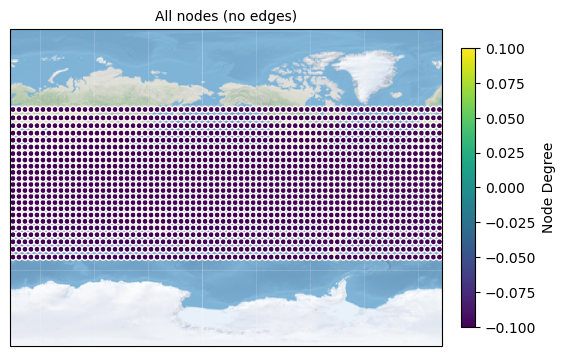

In [43]:
title = "All nodes (no edges)"
graph_utils.plot_nodes(G_nodes_only, central_lon=central_lon, central_lat=central_lat, figsize=(6, 6), 
                       projection="Miller", title=title, save_img=False, 
                       img_filename=None, img_folder=IMG_FOLDER)

In [44]:
# Create a positions dictionary of all nodes
full_pos_dict = graph_utils.get_pos_dict(G_nodes_only)
pos_array = torch.Tensor(list(full_pos_dict.values()))

# reverse pos dict before removing isolated nodes
full_reverse_pos_dict = graph_utils.get_reverse_pos_dict(G_nodes_only)

all_nodes = list(G_nodes_only.nodes)

### Construct Edges

#### Remove invalid / continents points

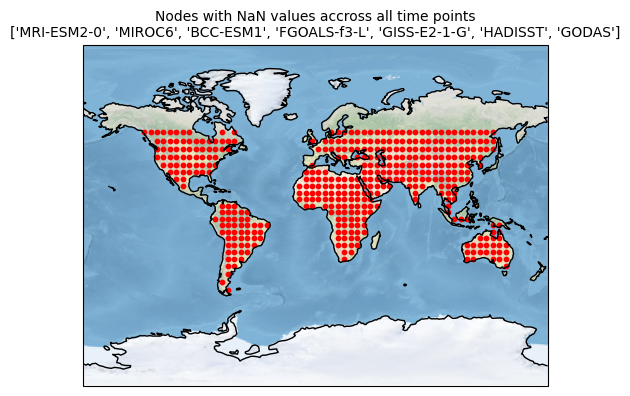

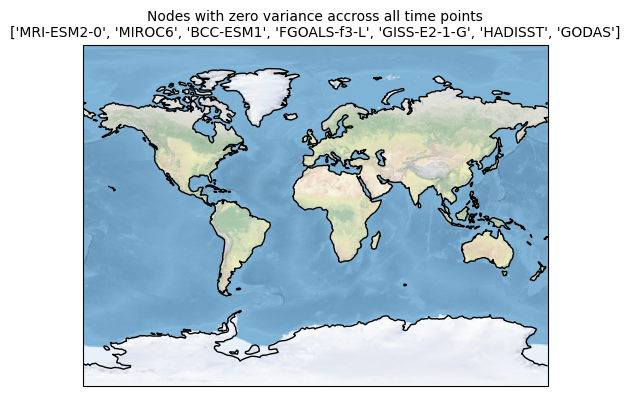

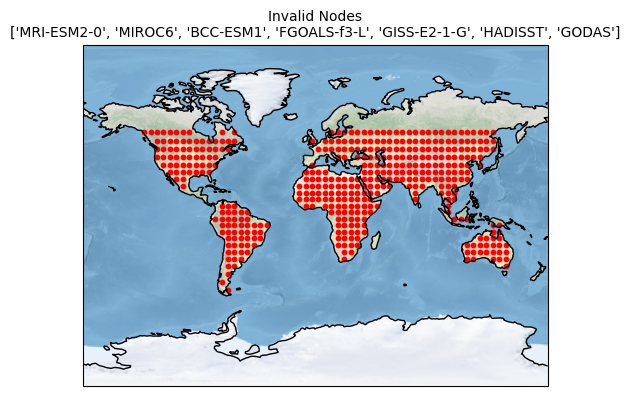

In [45]:
# Identify and plot invalid (NaN and Zero variance) points
nan_lonlat_indices, nan_lonlat_coords = graph_utils.get_nan_points(X_concat)
zero_var_lon_lat_indices, zero_var_lonlat_coords = graph_utils.get_zero_variance_points(X_concat)
invalid_lonlat_indices = np.concatenate((nan_lonlat_indices, zero_var_lon_lat_indices))
invalid_lonlat_coords = np.concatenate((nan_lonlat_coords, zero_var_lonlat_coords))

# Returns the indices that would sort an array
index_array = np.argsort(invalid_lonlat_indices)

# Sort merged NaN and Zero variance indices and coords
sorted_invalid_lonlat_indices = invalid_lonlat_indices[index_array]
sorted_invalid_lonlat_coords = invalid_lonlat_coords[index_array]


# # Plot nodes with NaN values
title = f"Nodes with NaN values accross all time points\n{TRAIN_SOURCE_IDS + FINETUNE_SOURCE_IDS + [TEST_SOURCE_ID]}"
graph_utils.plot_coords(nan_lonlat_coords, figsize=(6, 6), title=title)

# # Plot nodes with zero variance
title = f"Nodes with zero variance accross all time points\n{TRAIN_SOURCE_IDS + FINETUNE_SOURCE_IDS + [TEST_SOURCE_ID]}"
graph_utils.plot_coords(zero_var_lonlat_coords, figsize=(6, 6), title=title)

# Plot all invalid nodes (NaN values and zero variance)
title = f"Invalid Nodes\n{TRAIN_SOURCE_IDS + FINETUNE_SOURCE_IDS + [TEST_SOURCE_ID]}"
graph_utils.plot_coords(sorted_invalid_lonlat_coords, figsize=(6, 6), title=title)


#### Assemble data that will be used to generate the edges (Train only - ESM)

In [46]:
# Step 1: Initialize lists to collect data from multiple sources
X_train_list, y_train_list = [], []

# Iterate over each source_id and assemble the data
print(f"Assemble predictors and predictands from {TRAIN_SOURCE_IDS} at lead time 1:")
for source_id in TRAIN_SOURCE_IDS:
    X_train, y_train = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, TARGETS[0], train_start_date, train_end_date, 
                                                             lead_time=1, num_input_time_steps=INPUT_TIME_STEPS, 
                                                             lat_slice=LAT_SLICE, lon_slice=LON_SLICE, 
                                                             data_format="spatial", verbose=False)
    print(f"• {source_id:<12}: X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}")

    X_train_list.append(X_train)
    y_train_list.append(y_train)

# Concatenate data from all sources
X_train_all_source_ids = xr.concat(X_train_list, dim='time')
y_train_all_source_ids = pd.concat(y_train_list)

print(f"\nConcatenate data from all source ids:")
print(f"• {'Concat':<12}: X_train.shape: {X_train_all_source_ids.shape}, y_train.shape: {y_train_all_source_ids.shape}")


Assemble predictors and predictands from ['MRI-ESM2-0', 'MIROC6', 'BCC-ESM1', 'FGOALS-f3-L', 'GISS-E2-1-G'] at lead time 1:
• MRI-ESM2-0  : X_train.shape: (994, 3, 23, 72), y_train.shape: (994,)
• MIROC6      : X_train.shape: (994, 3, 23, 72), y_train.shape: (994,)
• BCC-ESM1    : X_train.shape: (994, 3, 23, 72), y_train.shape: (994,)
• FGOALS-f3-L : X_train.shape: (994, 3, 23, 72), y_train.shape: (994,)
• GISS-E2-1-G : X_train.shape: (994, 3, 23, 72), y_train.shape: (994,)

Concatenate data from all source ids:
• Concat      : X_train.shape: (4970, 3, 23, 72), y_train.shape: (4970,)


In [47]:
# Flatten longitude and latitudes
X_train_flat = graph_utils.flatten_lonlat(X_train_all_source_ids, verbose=True)

# Remove invalid values 
X_train_flat_cleaned = graph_utils.handle_invalid_values(X_train_flat, sorted_invalid_lonlat_indices, method=INVALID_NODES_HANDLING, verbose=True)

Flatten DataArray lat and lon dimensions:
• Original array's shape (time, window, lat, lon) (4970, 3, 23, 72)
• Flattend array's shape (time, window, lonlat) (4970, 3, 1656)
Handle invalid values:
• Original data's shape (time, lonlat) (4970, 3, 1656)
• Method='complete_case': Remove 416 invalid lonlat indices
• Processed data's shape: (4970, 3, 1240)


In [48]:
X_train_flat.shape

(4970, 3, 1656)

In [49]:
X_train_flat_cleaned.shape

(4970, 3, 1240)

#### Compute Edge List for each lag time

- For each lag time:
    - **If Correlation method:**
    
            # 1. Compute Correlation Matrix for valid nodes
            # 2. Insert Valid Correlation Matrix into Full Correlation matrix
            # 3. Compute Full Adjacency matrix: a value above the threshold in the Correlation Matrix indicates an edge
    
    - **If Graphical Lasso method:**
    
            # 1. Compute Covariance Matrix for valid nodes using sklearn function
            # 2. Compute the sparse inverse covariance (Precision) matrix for valid nodes
            # 3. Compute Adjacency Matrix for valid nodes: a non-zero value in the Precision matrix indicates an edge
            # 4. Insert Valid Adjacency Matrix into Full Adjacency matrix

    - **If Proximity (One-Hop Neighbors) method:**

            # 1. Generate Edges for valid nodes based on One Hop neighborhood
            # 2. Compute Adjacency Matrix for valid nodes
    

    - Derive Edge list for each lag time
    - Add Edges for each lag time to Graph


**Notes:**
- A sparse inverse covariance (precision) matrix can be interpreted as the adjacency matrix of a graph, where the **non-zero entries represent edges between nodes (variables) with conditional dependencies.** 
    - Choosing alpha: The regularization parameter alpha is critical. Cross-validation can be used to select the **optimal alpha that balances model fit and sparsity.**
        - **High alpha**: Leads to a **sparser model with fewer edges**, which might underfit the data but provides a simpler and more interpretable model.
        - **Low alpha**: Results in a **denser model with more edges**, which might overfit the data but captures more conditional dependencies.
    - Interpreting Results: Remember that the **edges in the graph represent conditional dependencies, not direct correlations.**
    (source: ChatGPT)

In [50]:
# valid_nodes = [node for node in all_nodes if node not in sorted_invalid_lonlat_indices]
# valid_nodes

#### Compute Edge List for lag 0

In [51]:
total_number_nodes = X_train_flat.shape[-1]
total_number_nodes

1656

##### Select nodes using Correlation, GLasso or Proximity



lead_time = 0


Valid correlation matrix's shape:  (1240, 1240)


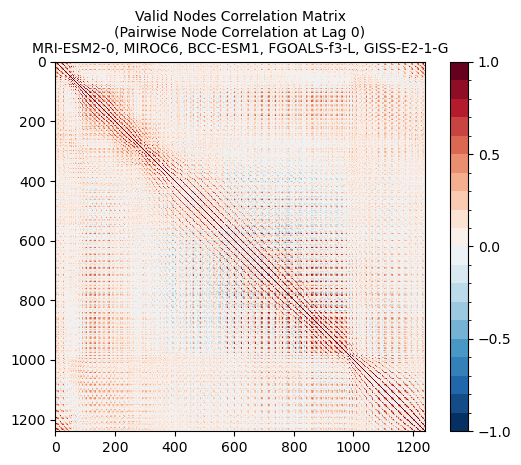

Saved corr_matrix_valid_MRI_MIROC6_BCC_FGOALS_GISS_Lag00.jpg to disk
Full correlation matrix's shape:  (1656, 1656)


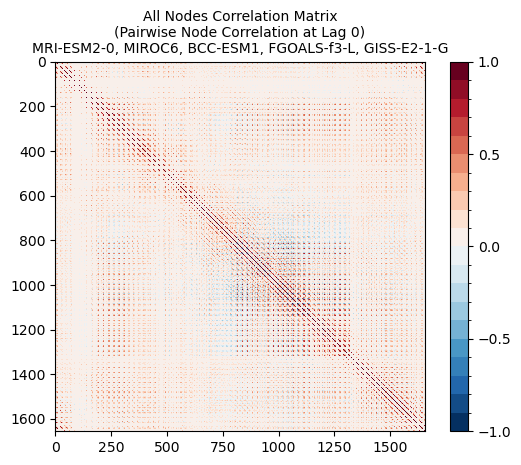

Saved corr_matrix_full_MRI_MIROC6_BCC_FGOALS_GISS_Lag00.jpg to disk


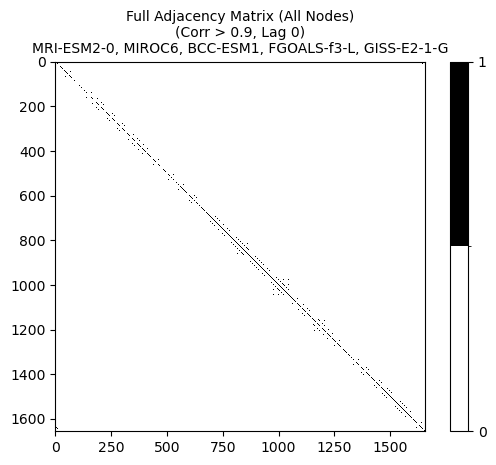

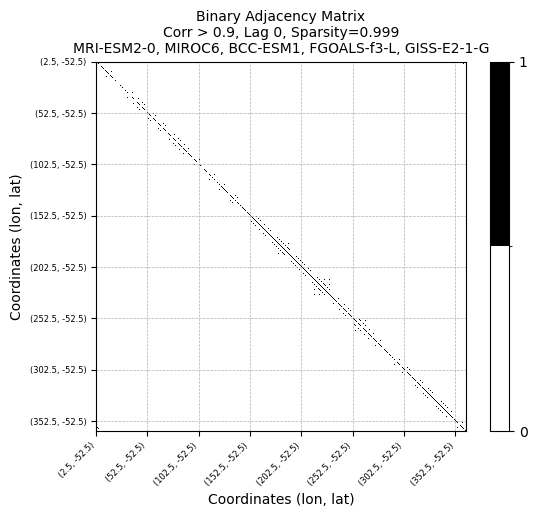

Saved bin_adj_matrix_CorrThr090_MRI_MIROC6_BCC_FGOALS_GISS_Lag0 to disk
Number of edges for Adjacency matrix (Corr > 0.9) for Lag 0: 1,156

Number of nodes: 1,656
Number of edges: 1,156


In [52]:

start_time_edges_compute = time.time()
lead_time = 0

# for lead_time in range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP):
print(f"\n=============================\n")
print(f"lead_time = {lead_time}\n")
    
# reset the graph with nodes only
G = G_nodes_only.copy()


if NODES_SEL_METHOD == "Correlation": 
    # 1. compute correlation matrix for valid nodes
    if INVALID_NODES_HANDLING == "mask":
        # sst_corr_matrix_valid = graph_utils.compute_corr_matrix(X_train_flat_cleaned, masked_data=True)
        raise Exception("'mask' method not implemented.")
    else:
        # sst_corr_matrix_valid = graph_utils.compute_corr_matrix_per_lead(X_train_flat_cleaned, lead_time)
        sst_corr_matrix_valid = graph_utils.compute_corr_matrix(X_train_flat_cleaned, masked_data=False)
    print("\nValid correlation matrix's shape: ", sst_corr_matrix_valid.shape)
    
    # Display Valid Correlation Matrix
    title = f"Valid Nodes Correlation Matrix\n(Pairwise Node Correlation at Lag {lead_time})\n{TRAIN_SOURCE_IDS_STR}"
    filename = f"corr_matrix_valid_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time:02d}.jpg"
    graph_utils.display_corr_matrix(sst_corr_matrix_valid, title=title, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    
    
    # 2. Insert the valid correlation matrix into the full one
    sst_corr_matrix_full = graph_utils.insert_valid_corr_into_full(sst_corr_matrix_valid, sorted_invalid_lonlat_indices, corr_matrix_full_order=total_number_nodes)
    print("Full correlation matrix's shape: ", sst_corr_matrix_full.shape)
    
    
    # Display Full Correlation Matrix
    title = f"All Nodes Correlation Matrix\n(Pairwise Node Correlation at Lag {lead_time})\n{TRAIN_SOURCE_IDS_STR}"
    filename = f"corr_matrix_full_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time:02d}.jpg"
    graph_utils.display_corr_matrix(sst_corr_matrix_full, title=title, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)

    # 3. Compute Full Ajacency matrix: a value above the threshold in the Correlation Matrix indicates an edge
    Adj_matrix = graph_utils.compute_adj_matrix(sst_corr_matrix_full, CORR_COEF_THRESHOLD)



elif NODES_SEL_METHOD == "GLasso":
    ####################################################################################################################################
    ############# 1. Compute Covariance Matrix of valid nodes using sklearn function #############
    sst_cov_matrix_valid_sklearn = graph_utils.compute_cov_matrix_sklearn(X_train_flat_cleaned, assume_centered=False)

    

    # Display Valid Covariance Matrix
    title = f"Valid Nodes Covariance Matrix\n(Pairwise Node Covariance at Lag {lead_time})\n{TRAIN_SOURCE_IDS_STR}"
    filename = f"cov_matrix_valid_sklearn_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time:02d}.jpg"
    graph_utils.display_cov_matrix(sst_cov_matrix_valid_sklearn, centered_cbar=False, 
                                   title=title, save_img=SAVE_PLOTS_TO_DISK, 
                                   img_filename=filename, img_folder=IMG_FOLDER)


    ####################################################################################################################################
    ############## 2. Compute the sparse inverse covariance (precision) matrix for valid nodes #############
    print(f"Compute the sparse inverse covariance (precision) matrix with alpha={GLASSO_ALPHA} for valid nodes")
    # _, prec_matrix_valid = graphical_lasso(sst_cov_matrix_valid_sklearn, alpha=GLASSO_ALPHA, mode='cd', tol=0.0001, enet_tol=0.0001, max_iter=100, verbose=True)
    _, prec_matrix_valid = graphical_lasso(sst_cov_matrix_valid_sklearn, alpha=GLASSO_ALPHA, mode='cd', tol=0.001, enet_tol=0.0001, max_iter=100, verbose=True)
    
    print("prec_matrix_valid.shape: ", prec_matrix_valid.shape)
    print("prec_matrix_valid\n", prec_matrix_valid)

    
    title = f"Valid Nodes Lagged Precision Matrix\n({SUBTITLE_SHORT}, Lag {lead_time})\n{TRAIN_SOURCE_IDS_STR}"
    filename = f"prec_matrix_valid_{IMG_FILENAME_TAG}_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time:02d}.jpg"
    graph_utils.display_cov_matrix(prec_matrix_valid, centered_cbar=False, title=title, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename,img_folder=IMG_FOLDER)

    ####################################################################################################################################
    ############## 3. Compute Adjacency Matrix for valid nodes: a non-zero value in the precision matrix indicates an edge #############
    lasso_adj_matrix_valid = (prec_matrix_valid != 0).astype(int)
    
    title = f"Lasso Lagged Adjacency Matrix (Valid Nodes)\n({SUBTITLE_SHORT}, Lag {lead_time})\n{TRAIN_SOURCE_IDS_STR}"
    filename = f"lasso_adj_matrix_valid_{IMG_FILENAME_TAG}_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time:02d}.jpg"
    graph_utils.display_adj_matrix(lasso_adj_matrix_valid, title)


    ########################################################################################
    ############## 4. Insert valid Adjacency Matrix into Full Adjacency matrix #############
    lasso_adj_matrix_full = graph_utils.insert_valid_corr_into_full(lasso_adj_matrix_valid, sorted_invalid_lonlat_indices, corr_matrix_full_order=total_number_nodes)
    Adj_matrix = lasso_adj_matrix_full.copy()



elif NODES_SEL_METHOD == "Proximity":
    # Generate Edges based on One Hop neighborhood
    # G = graph_utils.construct_onehop_edges(G, 5)
    G = graph_utils.construct_onehop_edges_with_lon_wrapping(G, 5)
    
    Adj_matrix = nx.adjacency_matrix(G)
    
    # convert the sparse matrix to a dense format
    Adj_matrix = Adj_matrix.todense()
    print(f"Proximity Adj_matrix.shape: {Adj_matrix.shape}")
    
    # Sparsity: for an undirected graph, the maximum possible number of edges is n*(n-1)/2
    sparsity = (2 * G.number_of_edges()) / (G.number_of_nodes() * (G.number_of_nodes() - 1))
    
else:
    print("Invalid Nodes Selection Method")




# Display Adjacency matrix
title = f"Full Adjacency Matrix (All Nodes)\n({SUBTITLE_SHORT}, Lag {lead_time})\n{TRAIN_SOURCE_IDS_STR}"
filename = f"Adj_matrix_full_{IMG_FILENAME_TAG}_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time:02d}.jpg"
graph_utils.display_adj_matrix(Adj_matrix, title)


# Display Adjacency Matrix with Coordinates on axes
sparsity = graph_utils.compute_sparsity(Adj_matrix)
title = f"Binary Adjacency Matrix\n{SUBTITLE_SHORT}, Lag {lead_time}, Sparsity={sparsity:.3f}\n{TRAIN_SOURCE_IDS_STR}"
filename = f"bin_adj_matrix_{IMG_FILENAME_TAG}_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time}"
graph_utils.display_adj_matrix_w_coords(G, Adj_matrix, full_pos_dict, title, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)


# Compute Edge List
edge_list = graph_utils.compute_edge_list(Adj_matrix)
print(f"Number of edges for Adjacency matrix ({SUBTITLE_SHORT}) for Lag {lead_time}: {len(edge_list):,}")

# Add Edges based on Adjacency Matrix
G.add_edges_from(edge_list)

print(f"\nNumber of nodes: {G.number_of_nodes():,}")
print(f"Number of edges: {G.number_of_edges():,}")

if G.number_of_edges() == 0:
    print(f"No Edges for this lead time {lead_time}. Skip")
    # continue

##### Trim Nodes and Edges

Remove Continentental nodes
Number of invalid (continental) nodes: 416 / 1656 (25.12%)
Removed 416 nodes from Graph
Remove Isolated nodes (not connected to any nodes)
Number of isolated nodes:   306 / 1240 (24.68%)
Number of connected nodes:  934 / 1240 (75.32%)
Removed 306 isolated nodes


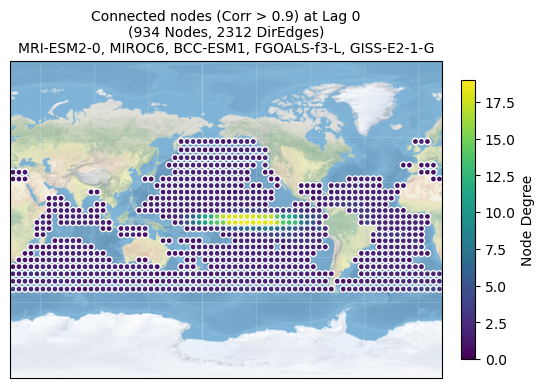

Saved cartopy_graph_CorrThr090_connected_nodes_MRI_MIROC6_BCC_FGOALS_GISS_Lag0.jpg to disk
Keep only Component with most edges


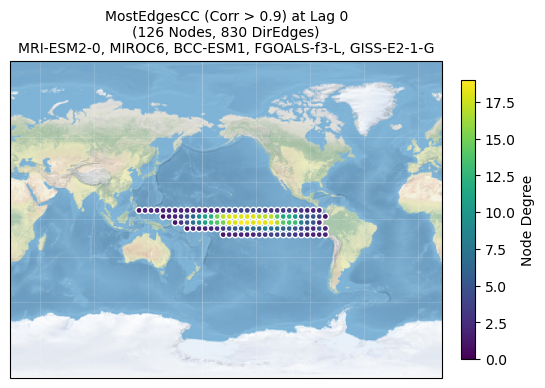

Saved cartopy_graph_CorrThr090_MostEdgesCC_MRI_MIROC6_BCC_FGOALS_GISS_Lag0.jpg to disk


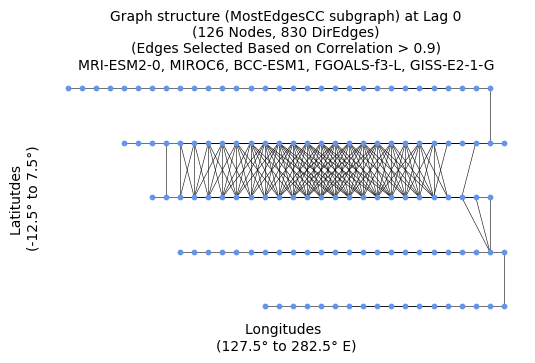

Saved graph_structure_CorrThr090_MostEdgesCC_MRI_MIROC6_BCC_FGOALS_GISS_Lag0.jpg to disk


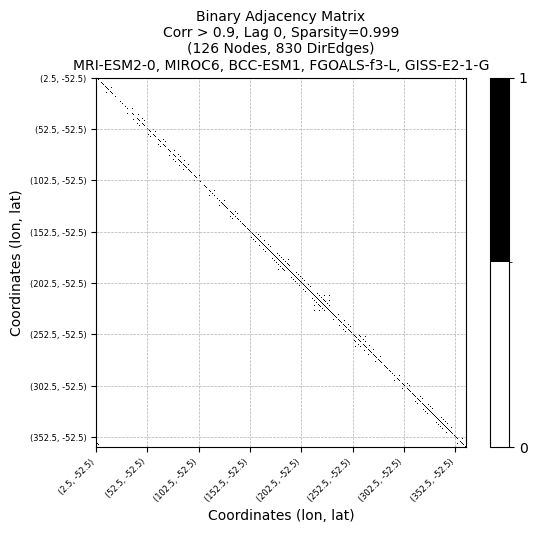

Saved bin_adj_matrix_CorrThr090_MRI_MIROC6_BCC_FGOALS_GISS_Lag0 to disk

Number of Nodes: 126 / 1240
Number of edges: 830

Elapsed time to compute edge list: 0.12 minutes (7.31 seconds)


In [53]:
########################################################################################
############################ Trim Nodes and Edges ######################################
if REMOVE_CONTINENTAL_NODES:
    print("Remove Continentental nodes")
    print(f"Number of invalid (continental) nodes: {len(invalid_lonlat_indices)} / {G.number_of_nodes()} ({len(invalid_lonlat_indices)/G.number_of_nodes():.2%})")
    nodes_to_keep = [node for node in all_nodes if node not in invalid_lonlat_indices]

    G_valid = graph_utils.remove_nodes_from(G, invalid_lonlat_indices)
    G1 = G_valid.copy()

    # title = f"{TRAIN_SOURCE_IDS_STR} Graph structure (valid nodes only) at Lag {lead_time}\n({SUBTITLE})"
    # img_filename = f"graph_structure_{IMG_FILENAME_TAG}_valid_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time}.jpg"
else: 
    print("Continentental nodes have NOT been removed")
    nodes_to_keep = all_nodes
    G1 = G.copy()
    # title = f"{TRAIN_SOURCE_IDS_STR} Graph structure (ALL nodes) at Lag {lead_time}\n({SUBTITLE})"
    # img_filename = f"graph_structure_{IMG_FILENAME_TAG}_all_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time}.jpg"

### Remove Isolated Nodes from Graph ####
print("Remove Isolated nodes (not connected to any nodes)")

# identify isolated nodes (not connected to any nodes)
isolated_nodes = graph_utils.get_isolated_nodes(G1)
graph_utils.print_isolated_vs_connected_stats(G1)

# remove isolated nodes from graph
G_connected = graph_utils.remove_isolated_nodes(G1)
data_connected = from_networkx(G_connected) 
nb_nodes_connected = G_connected.number_of_nodes()
nb_edges_connected = data_connected.edge_index.shape[1] # PyG counts undirected edges twice

# draw connected nodes using cartopy (not connected to any nodes)
title = f"Connected nodes ({SUBTITLE_SHORT}) at Lag {lead_time}\n({nb_nodes_connected} Nodes, {nb_edges_connected} DirEdges)\n{TRAIN_SOURCE_IDS_STR}"
img_filename = f"cartopy_graph_{IMG_FILENAME_TAG}_connected_nodes_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time}.jpg"
graph_utils.plot_nodes(G_connected, central_lon=central_lon, central_lat=central_lat, figsize=(6, 6), projection="Miller", title=title, save_img=SAVE_PLOTS_TO_DISK, img_filename=img_filename, img_folder=IMG_FOLDER)



if NODES_TRIM_METHOD == "MinDegree":
    print(f"Keep only nodes with a Minimum Degree of {MIN_DEGREE}")
    low_degree_nodes = graph_utils.get_low_degree_nodes(G_connected, MIN_DEGREE)
    G_min_degree = graph_utils.filter_nodes_by_min_degree(G_connected, MIN_DEGREE)
    nodes_to_keep = list(G_min_degree.nodes())
    print(f"Remaining nodes after filtering:  {G_min_degree.number_of_nodes():>4} / {G_connected.number_of_nodes():>4} ({G_min_degree.number_of_nodes()/G_connected.number_of_nodes():.2%})")

    G2 = G_min_degree.copy()
elif NODES_TRIM_METHOD=="LargestCC":
    print(f"Keep only Largest Connected component")

    largest_cc_nodes = graph_utils.get_largest_connected_component(G_connected)
    
    # Get largest connected components subgraph
    G_largest_cc = G_connected.subgraph(largest_cc_nodes).copy()
    nodes_to_keep = list(G_largest_cc.nodes())
    G2 = G_largest_cc.copy()

elif NODES_TRIM_METHOD=="MostEdgesCC":
    print(f"Keep only Component with most edges")
    most_edge_cc = graph_utils.get_component_with_most_edges(G_connected)

    # Get components with the most edges' subgraph
    G_most_edges = G_connected.subgraph(most_edge_cc).copy()
    nodes_to_keep = list(G_most_edges.nodes())
    G2 = G_most_edges.copy()
else: 
    print("Keep all nodes from previous step")
    nodes_to_keep = all_nodes
    G2 = G1.copy()

data = from_networkx(G2)
# print(data)

nb_nodes = len(nodes_to_keep)
nb_edges = data.edge_index.shape[1]


# Plot Largest Connected Component or MinDegree cartopy
central_lon, central_lat = 200, 0  # Center of Niño 1+2: (275, -5)        
title = f"{NODES_TRIM_METHOD_STR} ({SUBTITLE_SHORT}) at Lag {lead_time}\n({nb_nodes} Nodes, {nb_edges} DirEdges)\n{TRAIN_SOURCE_IDS_STR}"
img_filename = f"cartopy_graph_{IMG_FILENAME_TAG}_{NODES_TRIM_METHOD_STR}_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time}.jpg"
graph_utils.plot_nodes(G2, central_lon=central_lon, central_lat=central_lat, figsize=(6, 6), projection="Miller", title=title, save_img=SAVE_PLOTS_TO_DISK, img_filename=img_filename, img_folder=IMG_FOLDER)

# Plot Largest Connected Component or MinDegree Edges
title = f"Graph structure ({NODES_TRIM_METHOD_STR} subgraph) at Lag {lead_time}\n({nb_nodes} Nodes, {nb_edges} DirEdges)\n({SUBTITLE})\n{TRAIN_SOURCE_IDS_STR}"
img_filename = f"graph_structure_{IMG_FILENAME_TAG}_{NODES_TRIM_METHOD_STR}_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time}.jpg"
graph_utils.draw_graph_basic(G2, title, save_img=SAVE_PLOTS_TO_DISK, img_filename=img_filename, img_folder=IMG_FOLDER)


# Display Adjacency Matrix with Coordinates on axes
title = f"Binary Adjacency Matrix\n{SUBTITLE_SHORT}, Lag {lead_time}, Sparsity={sparsity:.3f}\n({nb_nodes} Nodes, {nb_edges} DirEdges)\n{TRAIN_SOURCE_IDS_STR}"
filename = f"bin_adj_matrix_{IMG_FILENAME_TAG}_{TRAIN_SOURCE_IDS_FILENAME}_Lag{lead_time}"
graph_utils.display_adj_matrix_w_coords(G2, Adj_matrix, full_pos_dict, title, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)


print()
print(f"Number of Nodes: {G2.number_of_nodes()} / {G1.number_of_nodes()}")
print(f"Number of edges: {data.edge_index.shape[1]}")
# print(f"data.edge_index:\n{data.edge_index}")
# print(len(nodes_to_keep))


elapsed_time_edges_compute_seconds = time.time() - start_time_edges_compute
elapsed_time_edges_compute_minutes = elapsed_time_edges_compute_seconds / 60
print(f"\nElapsed time to compute edge list: {elapsed_time_edges_compute_minutes:.2f} minutes ({elapsed_time_edges_compute_seconds:.2f} seconds)")  

In [54]:
# if NODES_SEL_METHOD == "Correlation":
#     central_lon, central_lat = 277.5, -7.5  # Center of Niño 1+2: (275, -5)
#     target_lon1, target_lat1 = 277.5, -7.5  # Center of Niño 1+2: (275, -5)
#     target_lon2, target_lat2 = 242.5, 2.5   # Center of Niño 3: (240, 0)
#     target_lon3, target_lat3 = 217.5, 2.5   # Center of Niño 3.4: (215, 0)
#     target_lon4, target_lat4 = 187.5, 2.5   # Center of Niño 4: (185, 0)
    
#     target_lon_list = [target_lon1, target_lon2, target_lon3, target_lon4]
#     target_lat_list = [target_lat1, target_lat2, target_lat3, target_lat4]
#     region_names = [f"Niño 1+2", f"Niño 3", f"Niño 3.4", f"Niño4"]
    
#     for projection in CARTOGRAPHIC_PROJECTIONS:
#         print(projection)
#         graph_utils.plot_neighbors_corr_4x4(G2, target_lon_list, target_lat_list, region_names, full_reverse_pos_dict, sst_corr_matrix_full, SUBTITLE_SHORT, IMG_FILENAME_TAG, 
#                                 TRAIN_SOURCE_IDS_STR, lead_time, projection=projection, central_lon=None, central_lat=None, save_img=SAVE_PLOTS_TO_DISK, img_folder=IMG_FOLDER)

In [55]:
!!!!!!!!!!! make it crash here !!!!!!!!!!!

['/bin/bash: !!!!!!!!!: command not found']

# ============================================================

## Training the GNN

In [56]:
# !nvidia-smi

In [57]:
print(f"• GPU: {torch.cuda.get_device_name(0)}")
print(f"• Targets: {TARGETS}")
print(f"• Lead Times: {START_LEAD_TIME} to {MAX_LEAD_TIME}")
print(f"• Window size: {INPUT_TIME_STEPS}")
print(f"• Nb Epochs: {NUM_EPOCHS_TRAIN}")
print(f"• Batch Size: {BATCH_SIZE}")
print(f"• Number of nodes: {G2.number_of_nodes()}")
print(f"• Number of edges: {data.edge_index.shape[1]}")

• GPU: NVIDIA A40
• Targets: ['E', 'C']
• Lead Times: 0 to 25
• Window size: 3
• Nb Epochs: 20
• Batch Size: 128
• Number of nodes: 126
• Number of edges: 830


### Pre-Training

    # For each target
        # For each lead time
            ##### TRAIN MODEL #####
            # Step 1: Assemble graph predictors predictands from multiple sources
            # Step 2: Convert predictors to a time series node feature tensors
            # Step 3: Create Train and Val ENSOGraphDatasets
            # Step 4: Create batches of graphs using DataLoaders
            # Step 5: Instantiate GCN model and set up an optimizer for it
            # Step 6: Train model and save best model
    
            ##### EVALUATE MODEL #####
            # Step 1: Assemble graph predictors predictands for Test set
            # Step 2: Convert predictors to a time series node feature tensors
            # Step 3: Create Test ENSOGraphDatasets
            # Step 4: Create batches of graphs using DataLoaders
            # Step 5: Load best saved model
            # Step 6: Infer predictions and evaluate performance (Corr and MSE)
            # Step 7: Store model performance metrics in a dictionary for the current lead time

In [58]:
start_time_training = time.time()
start_time_training_datetime = datetime.fromtimestamp(start_time_training)
print("Start training time: ", start_time_training_datetime.strftime('%Y-%m-%d %H:%M:%S'))
gnn_training_results = {}

Start training time:  2024-08-15 22:00:05


In [59]:
if GENERAL_MODE != "view_results_only":
    if FINETUNE_ONLY != True:

        for target in TARGETS:
            print(f"\n\n===========================================================================================")
            results_folder = target_to_results_folder.get(target)
            if results_folder is None:
                print(f"Unknown target {target}. Abort")
            save_results_folder = os.path.join(results_folder, "gnn")
        
            gnn_training_results[target] = []
            print(f"Target to predict:         {target}")
            print(f"• Training and validation sets: {TRAIN_SOURCE_IDS}")
            print(f"• Train start and end dates:  {train_start_date} to {train_end_date}")
            print(f"• Val start and end dates:    {val_start_date} to {val_end_date}")
            print(f"• Test start and end dates:   {test_start_date_PRETRAIN} to {test_end_date_PRETRAIN}")
            print()
            for lead_time in range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP):
                print(f"------------------------------------------------------------------------------------------------------")
                print(f"Lead Time: {lead_time}")
        
                ######################################################
                print("\n################ TRAIN MODEL ################")
                
                if DIFFERENT_GRAPH_PER_LEAD:
                    if lead_time not in graph_data_by_lead_time:
                        print(f"No available data for lead time {lead_time}. Skip")
                        continue
        
                    data = graph_data_by_lead_time[lead_time]
                    print(data)
                    nodes_to_keep = nodes_to_keep_by_lead_time[lead_time]
                    print(f"Number of nodes to keep: {len(nodes_to_keep)}")
        
                experiment_name = (
                    f"{EXPERIMENT_GENERAL_NAME}_"
                    f"{target.capitalize()}Idx_"
                    f"Lead{lead_time:02d}"
                )
                print(f"Experiment name: {experiment_name}")
        
                ##### Step 1: Assemble graph predictors predictands from multiple sources
                X_train_list, y_train_list, X_test_list = [], [], []
                X_val_list, y_val_list, y_test_list = [], [], []
        
                print(f"\nAssemble predictors and predictands from multiple sources:")
                for source_id in TRAIN_SOURCE_IDS:
                    X_train, y_train = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, train_start_date, train_end_date, lead_time, 
                                                                                         num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE, verbose=False)
                    X_val, y_val = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, val_start_date, val_end_date, lead_time, 
                                                                                     num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE, verbose=False)
                    X_test, y_test = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, test_start_date_PRETRAIN, test_end_date_PRETRAIN, lead_time, 
                                                                                       num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE, verbose=False)
        
                    print(f"• {source_id:<12}: X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}, X_val.shape: {X_val.shape}, y_val.shape: {y_val.shape}, X_test.shape: {X_test.shape}, y_test.shape: {y_test.shape}")
        
                    X_train_list.append(X_train)
                    y_train_list.append(y_train)
                    X_val_list.append(X_val)
                    y_val_list.append(y_val)
                    X_test_list.append(X_test)
                    y_test_list.append(y_test)
        
                # Concatenate data from all sources
                X_train = xr.concat(X_train_list, dim='time')
                y_train = pd.concat(y_train_list)
                X_val = xr.concat(X_val_list, dim='time')
                y_val = pd.concat(y_val_list)
                X_test = xr.concat(X_test_list, dim='time')
                y_test = pd.concat(y_test_list)
        
        
                # print(f"\nConcatenate data from all sources:")
                print(f"• {'Concat':<12}: X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}, X_val.shape: {X_val.shape}, y_val.shape: {y_val.shape}, X_test.shape: {X_test.shape}, y_test.shape: {y_test.shape}")
        
        
                ##### Step 2: Convert predictors xarray.DataArrays to a time series node feature tensors ([1438, 3, total_number_nodes])
                train_node_features_ts = graph_utils.get_node_features_ts(X_train, fillna=FILLNA) 
                val_node_features_ts = graph_utils.get_node_features_ts(X_val, fillna=FILLNA)
        
        
                ##### Step 3: Create Train and Val ENSOGraphDatasets
                print(f"\n{'Train Dataset:':<15}", end="")
                train_dataset = ENSOGraphDataset(train_node_features_ts[:, :, nodes_to_keep], y_train, data.edge_index, pos_array[nodes_to_keep])
        
                print(f"{'Val Dataset:':<15}", end="")
                val_dataset = ENSOGraphDataset(val_node_features_ts[:, :, nodes_to_keep], y_val, data.edge_index, pos_array[nodes_to_keep])
        
        
                ##### Step 4: Create batches of graphs using DataLoaders
                train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE)
                val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
        
        
                ##### Step 5: Instantiate GCN model and set up an optimizer for it
                # nb_nodes_per_graph = data.x.shape[1]
                nb_nodes_per_graph = len(nodes_to_keep)
                if MODEL_TYPE == "GCN2LayerConcat":
                    model = GCN2LayerConcat(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM, ACTIVATION_FUNC, dropout_rate=DROPOUT_RATE, use_batch_norm=USE_BATCH_NORM)
                elif MODEL_TYPE == "GCN3LayerConcat":
                    model = GCN3LayerConcat(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_HIDDEN_DIM_3, GCN_OUTPUT_DIM)
                elif MODEL_TYPE == "GCN2LayerConcat2FCs":
                    model = GCN2LayerConcat2FCs(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM)
                elif MODEL_TYPE == "GCN2LayerMeanPool":
                    model = GCN2LayerMeanPool(GCN_INPUT_FEATURES, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM, dropout_rate=DROPOUT_RATE, use_batch_norm=USE_BATCH_NORM)
                else:
                    raise ValueError("Invalid model name. Use 'GCN2LayerConcat', 'GCN3LayerConcat', 'GCN2LayerConcat2FCs', or 'GCN2LayerMeanPool'.")
    
                if lead_time == 0:
                    print(f"\nModel Architecture: \n{model}")
        
        
                if OPTIMIZER_TYPE == "Adam":
                    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
                elif OPTIMIZER_TYPE == "SGD":
                    optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, nesterov=USE_NESTEROV)
                else: 
                    raise ValueError("Invalid optimizer name. Use 'Adam' or 'SGD'")
    
                if lead_time == 0:
                    print(f"\nOptimizer: \n{optimizer}")
        
                
                ##### Step 6: train model and save best model
                train_losses, train_loss_history, val_losses, best_epoch = graph_utils.train_network(model, nn.MSELoss(), optimizer, train_dataloader, val_dataloader, 
                                                                                    "train_"+experiment_name, target=target, num_epochs=NUM_EPOCHS_TRAIN, verbose=False)
                print("• Epoch of best saved model (best validation loss): ", best_epoch)
        
        
        
                ##########################################################
                print("\n################ EVALUATE TRAINED MODEL ################")
                print(f"Evaluate best saved model for lead time {lead_time} on {TRAIN_SOURCE_IDS} test set ({test_start_date_PRETRAIN} to {test_end_date_PRETRAIN}):")
        
                # ##### Step 1: Assemble graph predictors predictands for Test set
                # X_test, y_test = graph_utils.assemble_graph_predictors_predictands(TEST_SOURCE_ID, RESOLUTION, target, test_start_date, test_end_date, lead_time, num_input_time_steps=INPUT_TIME_STEPS, 
                #                                                  lat_slice=LAT_SLICE, lon_slice=LON_SLICE, verbose=False)
        
                ##### Step 2: Convert predictors xarray.DataArrays to a time series node feature tensors
                test_node_features_ts = graph_utils.get_node_features_ts(X_test, fillna=FILLNA)
        
                ##### Step 3: Create Test ENSOGraphDatasets
                print(f"{'Test Dataset:':<15}", end="")
                test_dataset = ENSOGraphDataset(test_node_features_ts[:, :, nodes_to_keep], y_test, data.edge_index, pos_array[nodes_to_keep])
        
                ##### Step 4: Create batches of graphs using DataLoaders
                test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE)
        
                ##### Step 5: Load best saved model
                graph_utils.load_model(model, optimizer, "train_"+experiment_name, target, device, verbose=True)
                display(summary(model))

                ##### Step 6: Infer predictions and evaluate performance (Corr and MSE)
                predictions = graph_utils.infer(model, test_dataloader, verbose=False)
        
                # Check for inf or NaN in predictions
                if np.any(np.isnan(predictions)) or np.any(np.isinf(predictions)):
                    print("NaN or inf found in predictions")
                    # Optionally, print the indices of these values
                    print("Indices of NaN in predictions:", np.where(np.isnan(predictions)))
                    print("Indices of inf in predictions:", np.where(np.isinf(predictions)))
        
                corr, _ = scipy.stats.pearsonr(predictions, y_test)
                mse = mean_squared_error(y_test, predictions)
                print(f"• Evaluation results on Test set using best saved model: corr: {corr:.3f}, mse: {mse:.3f}")
        
                ##### Step 7: Store model performance metrics in a dictionary for the current lead time
                gnn_dict = {
                    'experiment_name': "train_"+experiment_name,
                    'train_source_ids': TRAIN_SOURCE_IDS,
                    'test_source_id': TEST_SOURCE_ID,
                    'nb_train_samples': X_train.shape[0],
                    'nb_test_samples': X_test.shape[0],
                    'target': target, 
                    'train_start_date': train_start_date,
                    'train_end_date': train_end_date,
                    'val_start_date': val_start_date,
                    'val_end_date': val_end_date,
                    'test_start_date': test_start_date_PRETRAIN,
                    'test_end_date': test_end_date_PRETRAIN,
                    'lead_time': lead_time,
                    'num_input_time_steps': INPUT_TIME_STEPS,
                    'y_test': y_test,
                    'predictions': predictions,
                    'corr': corr, 
                    'mse': mse,
                    'train_losses': train_losses,
                    'val_losses': val_losses,
                    'train_loss_history': train_loss_history,
                    'best_epoch': best_epoch,
                    'num_epochs': NUM_EPOCHS_TRAIN
                }
        
                gnn_training_results[target].append(gnn_dict)
                print()
        
            gnn_results_filename = "results_train_" + experiment_name.split("_Lead")[0] + ".pkl"
        
            # Saved GCN model results for each target to disk as a pickle file
            filepath = os.path.join(save_results_folder, gnn_results_filename)
            with open(filepath, "wb") as file:
                pickle.dump(gnn_training_results[target], file)
                print(f"Saved GCN trained model results for target {target} to \n• {filepath}")



    

In [60]:
if GENERAL_MODE != "view_results_only":
    if FINETUNE_ONLY != True:
        elapsed_time_training_seconds = time.time() - start_time_training
        hours_train, remainder_train = divmod(elapsed_time_training_seconds, 3600)
        minutes_train, seconds_train = divmod(remainder_train, 60)
        hhmmss_elapsed_train_time = f'{int(hours_train):02}:{int(minutes_train):02}:{int(seconds_train):02}'
        print(f"\nElapsed time to train the GNN: {hhmmss_elapsed_train_time}")  
        print(f"• GPU: {torch.cuda.get_device_name(0)}")
        print(f"• Targets: {TARGETS}")
        print(f"• Lead Times: {START_LEAD_TIME} to {MAX_LEAD_TIME}")
        print(f"• Window size: {INPUT_TIME_STEPS}")
        print(f"• Nb Epochs: {NUM_EPOCHS_TRAIN}")
        print(f"• Batch Size: {BATCH_SIZE}")
        print(f"• Number of nodes: {G2.number_of_nodes()}")
        print(f"• Number of edges: {data.edge_index.shape[1]}")
        num_params = sum(p.numel() for p in model.parameters())
        print(f"• Total number of parameters: {num_params:,}")
        print(f"• Parameter details:")
        for p in model.parameters():
            print(f"    • {p.numel():,}")

In [61]:
if GENERAL_MODE != "view_results_only":
    if FINETUNE_ONLY != True:
        # Print the model architecture to a text file in the image folder
        with open(f'{IMG_FOLDER}/{MODEL_DETAILS}_architecture.txt', 'w') as f:
            f.write(str(model))

#### Load GNN pre-training results

In [62]:
gnn_training_results = {}

for target in TARGETS:
    print(f"\n\n===========================================================================================")
    print(f"Target:         {target}")

    results_folder = target_to_results_folder.get(target)
    if results_folder is None:
        print(f"Unknown target {target}. Abort")
    
    print(f"\nLoad training model results for target {target} from {results_folder}")

    gnn_results_filename = (
        f"results_train_"
        f"{EXPERIMENT_GENERAL_NAME}_"
        f"{target.capitalize()}Idx"
        f".pkl"
    )
    # gnn_results_filename = "results_" + experiment_name.split("_Lead")[0] + ".pkl"
    print("gnn_results_filename: ", gnn_results_filename)

    # Load GNN results as pickle file
    folder = os.path.join(results_folder, "gnn")
    # print(folder)
    filename, filepath = graph_utils.find_file(folder, gnn_results_filename)
    with open(filepath, "rb") as file:
        gnn_training_results[target] = pickle.load(file)
        print(f"• GNN training results: {filepath}")



Target:         E

Load training model results for target E from saved_results/ec
gnn_results_filename:  results_train_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx.pkl
• GNN training results: saved_results/ec/gnn/results_train_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx.pkl


Target:         C

Load training model results for target C from saved_results/ec
gnn_results_filename:  results_train_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx.pkl
• GNN training results: saved_results/ec/gnn/results_train_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-18

### Fine-Tuning

In [63]:
if GENERAL_MODE != "view_results_only":
    start_time_finetuning = time.time()
    start_time_finetuning_datetime = datetime.fromtimestamp(start_time_finetuning)
    print("Start finetuning time: ", start_time_finetuning_datetime.strftime('%Y-%m-%d %H:%M:%S'))

In [64]:
if GENERAL_MODE != "view_results_only":

    gnn_finetuning_results = {}
    
    for target in TARGETS:
        print(f"\n\n===========================================================================================")
        results_folder = target_to_results_folder.get(target)
        if results_folder is None:
            print(f"Unknown target {target}. Abort")
        save_results_folder = os.path.join(results_folder, "gnn")
    
        gnn_finetuning_results[target] = []
        print(f"Target to predict:         {target}")
        print(f"• Training and validation sets: {FINETUNE_SOURCE_IDS} (fine-tuning)")
        print(f"• Train start and end dates:  {train_start_date} to {train_end_date}")
        print(f"• Val start and end dates:    {val_start_date} to {val_end_date}")
        print(f"• Test start and end dates:   {test_start_date} to {test_end_date}")
        print()
        for lead_time in range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP):
            print(f"------------------------------------------------------------------------------------------------------")
            print(f"Lead Time: {lead_time}")
    
            ######################################################
            print("\n################ FINETUNE MODEL ################")
            
            if DIFFERENT_GRAPH_PER_LEAD:
                if lead_time not in graph_data_by_lead_time:
                    print(f"No available data for lead time {lead_time}. Skip")
                    continue
    
                data = graph_data_by_lead_time[lead_time]
                print(data)
                nodes_to_keep = nodes_to_keep_by_lead_time[lead_time]
                print(f"Number of nodes to keep: {len(nodes_to_keep)}")
    
            experiment_name = (
                f"{EXPERIMENT_GENERAL_NAME}_"
                f"{target.capitalize()}Idx_"
                f"Lead{lead_time:02d}"
            )
            print(f"Experiment name: {experiment_name}")
    
            ##### Step 1: Assemble graph predictors predictands from multiple sources
            X_train_list, y_train_list = [], []
            X_val_list, y_val_list = [], []
    
            print(f"\nAssemble predictors and predictands from multiple sources:")
            for source_id in FINETUNE_SOURCE_IDS:
                X_train, y_train = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, train_start_date, train_end_date, lead_time, 
                                                                    num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE, verbose=False)
                X_val, y_val = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, val_start_date, val_end_date, lead_time, 
                                                                num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE, verbose=False)
    
                print(f"• {source_id:<12}: X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}, X_val.shape: {X_val.shape}, y_val.shape: {y_val.shape}")
    
                X_train_list.append(X_train)
                y_train_list.append(y_train)
                X_val_list.append(X_val)
                y_val_list.append(y_val)
    
            # Concatenate data from all sources
            X_train = xr.concat(X_train_list, dim='time')
            y_train = pd.concat(y_train_list)
            X_val = xr.concat(X_val_list, dim='time')
            y_val = pd.concat(y_val_list)
    
    
            # print(f"\nConcatenate data from all sources:")
            print(f"• {'Concat':<12}: X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}, X_val.shape: {X_val.shape}, y_val.shape: {y_val.shape}")
    
    
            ##### Step 2: Convert predictors xarray.DataArrays to a time series node feature tensors ([1438, 3, total_number_nodes])
            train_node_features_ts = graph_utils.get_node_features_ts(X_train, fillna=FILLNA) 
            val_node_features_ts = graph_utils.get_node_features_ts(X_val, fillna=FILLNA)
    
    
            ##### Step 3: Create Train and Val ENSOGraphDatasets
            print(f"\n{'Train Dataset:':<15}", end="")
            train_dataset = ENSOGraphDataset(train_node_features_ts[:, :, nodes_to_keep], y_train, data.edge_index, pos_array[nodes_to_keep])
    
            print(f"{'Val Dataset:':<15}", end="")
            val_dataset = ENSOGraphDataset(val_node_features_ts[:, :, nodes_to_keep], y_val, data.edge_index, pos_array[nodes_to_keep])
    
    
            ##### Step 4: Create batches of graphs using DataLoaders
            train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE)
            val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
    
    
            # ##### Step 5: Instantiate GCN model and set up an optimizer for it
            # nb_nodes_per_graph = data.x.shape[1]
            nb_nodes_per_graph = len(nodes_to_keep)
            if MODEL_TYPE == "GCN2LayerConcat":
                model = GCN2LayerConcat(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM, ACTIVATION_FUNC, dropout_rate=DROPOUT_RATE, use_batch_norm=USE_BATCH_NORM)
            elif MODEL_TYPE == "GCN3LayerConcat":
                model = GCN3LayerConcat(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_HIDDEN_DIM_3, GCN_OUTPUT_DIM)
            elif MODEL_TYPE == "GCN2LayerConcat2FCs":
                model = GCN2LayerConcat2FCs(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM)
            elif MODEL_TYPE == "GCN2LayerMeanPool":
                model = GCN2LayerMeanPool(GCN_INPUT_FEATURES, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM, dropout_rate=DROPOUT_RATE, use_batch_norm=USE_BATCH_NORM)
            else:
                raise ValueError("Invalid model name. Use 'GCN2LayerConcat', 'GCN3LayerConcat', 'GCN2LayerConcat2FCs', or 'GCN2LayerMeanPool'.")

            if lead_time == 0:
                print(f"\nModel Architecture: \n{model}")
    
            if OPTIMIZER_TYPE == "Adam":
                optimizer_finetune = optim.Adam(model.parameters(), lr=LEARNING_RATE_FINETUNING, weight_decay=WEIGHT_DECAY)
            elif OPTIMIZER_TYPE == "SGD":
                optimizer_finetune = optim.SGD(model.parameters(), lr=LEARNING_RATE_FINETUNING, momentum=MOMENTUM, nesterov=USE_NESTEROV)
            else: 
                raise ValueError("Invalid optimizer name. Use 'Adam' or 'SGD'")
            
            if lead_time == 0:
                print(f"\nOptimizer: \n{optimizer_finetune}")

            
            graph_utils.load_model(model, optimizer_finetune, "train_"+experiment_name, target, device, verbose=True)
            display(summary(model))
            num_params = sum(p.numel() for p in model.parameters())
            print(f"• Total number of parameters: {num_params:,}")
            print(f"• Parameter details:")
            for name, p in model.named_parameters():
                print(f"    • {name}: {p.numel():,}")


            ##### Step 6: train model and save best model
            train_losses, train_loss_history, val_losses, best_epoch = graph_utils.train_network(model, nn.MSELoss(), optimizer_finetune, train_dataloader, val_dataloader, 
                                                                                "tune_"+experiment_name, target=target, num_epochs=NUM_EPOCHS_FINETUNE, verbose=False)
            print("• Epoch of best saved model (best validation loss): ", best_epoch)
    
    
    
            ##########################################################
            print("\n################ EVALUATE FINETUNED MODEL ################")
            print(f"Evaluate best saved model for lead time {lead_time} on {TEST_SOURCE_ID} test set ({test_start_date} to {test_end_date}):")
    
            ##### Step 1: Assemble graph predictors predictands for Test set
            X_test, y_test = graph_utils.assemble_graph_predictors_predictands(TEST_SOURCE_ID, RESOLUTION, target, test_start_date, test_end_date, lead_time, num_input_time_steps=INPUT_TIME_STEPS, 
                                                             lat_slice=LAT_SLICE, lon_slice=LON_SLICE, verbose=False)

            print(f"• {'Assemble':<12}: X_test.shape: {X_test.shape}, y_test.shape: {y_test.shape}")

    
            ##### Step 2: Convert predictors xarray.DataArrays to a time series node feature tensors
            test_node_features_ts = graph_utils.get_node_features_ts(X_test, fillna=FILLNA)
    
            ##### Step 3: Create Test ENSOGraphDatasets
            print(f"{'Test Dataset:':<15}", end="")
            test_dataset = ENSOGraphDataset(test_node_features_ts[:, :, nodes_to_keep], y_test, data.edge_index, pos_array[nodes_to_keep])
    
            ##### Step 4: Create batches of graphs using DataLoaders
            test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE)
    
            ##### Step 5: Load best saved model
            graph_utils.load_model(model, optimizer_finetune, "tune_"+experiment_name, target, device, verbose=True)
    
            ##### Step 6: Infer predictions and evaluate performance (Corr and MSE)
            predictions = graph_utils.infer(model, test_dataloader, verbose=True)
    
            # Check for inf or NaN in predictions
            if np.any(np.isnan(predictions)) or np.any(np.isinf(predictions)):
                print("NaN or inf found in predictions")
                # Optionally, print the indices of these values
                print("Indices of NaN in predictions:", np.where(np.isnan(predictions)))
                print("Indices of inf in predictions:", np.where(np.isinf(predictions)))
    
            corr, _ = scipy.stats.pearsonr(predictions, y_test)
            mse = mean_squared_error(y_test, predictions)
            print(f"• Evaluation results on Test set using best saved model: corr: {corr:.3f}, mse: {mse:.3f}")
    
            ##### Step 7: Store model performance metrics in a dictionary for the current lead time
            gnn_dict = {
                'experiment_name': "tune_"+experiment_name,
                'train_source_ids': TRAIN_SOURCE_IDS,
                'finetuning_source_ids': FINETUNE_SOURCE_IDS,
                'test_source_id': TEST_SOURCE_ID,
                'nb_train_samples': X_train.shape[0],
                'nb_test_samples': X_test.shape[0],
                'target': target, 
                'train_start_date': train_start_date,
                'train_end_date': train_end_date,
                'val_start_date': val_start_date,
                'val_end_date': val_end_date,
                'test_start_date': test_start_date,
                'test_end_date': test_end_date,
                'lead_time': lead_time,
                'num_input_time_steps': INPUT_TIME_STEPS,
                'y_test': y_test,
                'predictions': predictions,
                'corr': corr, 
                'mse': mse,
                'train_losses': train_losses,
                'val_losses': val_losses,
                'train_loss_history': train_loss_history,
                'best_epoch': best_epoch,
                'num_epochs': NUM_EPOCHS_FINETUNE
            }
    
            gnn_finetuning_results[target].append(gnn_dict)
            print()
    
        gnn_results_filename = "results_tune_" + experiment_name.split("_Lead")[0] + ".pkl"
    
        # Saved GCN model results for each target to disk as a pickle file
        filepath = os.path.join(save_results_folder, gnn_results_filename)
        with open(filepath, "wb") as file:
            pickle.dump(gnn_finetuning_results[target], file)
            print(f"Saved GCN fine-tuned model results for target {target} to \n• {filepath}")


In [65]:
if GENERAL_MODE != "view_results_only":
    
    elapsed_time_finetuning_seconds = time.time() - start_time_finetuning
    hours_tune, remainder_tune = divmod(elapsed_time_finetuning_seconds, 3600)
    minutes_tune, seconds_tune = divmod(remainder_tune, 60)
    hhmmss_elapsed_tune_time = f'{int(hours_tune):02}:{int(minutes_tune):02}:{int(seconds_tune):02}'
    print(f"\nElapsed time to finetune the GNN: {hhmmss_elapsed_tune_time}")  
    print(f"• GPU: {torch.cuda.get_device_name(0)}")
    print(f"• Targets: {TARGETS}")
    print(f"• Lead Times: {START_LEAD_TIME} to {MAX_LEAD_TIME}")
    print(f"• Window size: {INPUT_TIME_STEPS}")
    print(f"• Nb Epochs: {NUM_EPOCHS_FINETUNE}")
    print(f"• Batch Size: {BATCH_SIZE}")
    print(f"• Number of nodes: {G2.number_of_nodes()}")
    print(f"• Number of edges: {data.edge_index.shape[1]}")
    num_params = sum(p.numel() for p in model.parameters())
    print(f"• Total number of parameters: {num_params:,}")
    print(f"• Parameter details:")
    for p in model.parameters():
        print(f"    • {p.numel():,}")

In [66]:
if GENERAL_MODE != "view_results_only":    
    for target in TARGETS:
        print(f"\n\n===========================================================================================")
        print(f"Target:         {target}")

        results_folder = target_to_results_folder.get(target)
        if results_folder is None:
            print(f"Unknown target {target}. Abort")
        save_results_folder = os.path.join(results_folder, "gnn")
        print(save_results_folder)

        gnn_training_dict_save = gnn_training_results[target]
        gnn_finetuning_dict_save = gnn_finetuning_results[target]
        
        # Access the last entry in the dictionary
        train_experiment_data = gnn_training_dict_save[-1]
        
        # Open the file and write the results
        file_exp_name = train_experiment_data['experiment_name'][6:]
        with open(f'{save_results_folder}/results_sum_{file_exp_name}.txt', 'w') as f:
            f.write(f"Experiment Name: {train_experiment_data['experiment_name']}\n")
            f.write(f"Train Source IDs: {train_experiment_data['train_source_ids']}\n")
            f.write(f"Test Source ID: {train_experiment_data['test_source_id']}\n")
            f.write(f"Number of Training Samples: {train_experiment_data['nb_train_samples']}\n")
            f.write(f"Number of Test Samples: {train_experiment_data['nb_test_samples']}\n")
            f.write(f"Target: {train_experiment_data['target']}\n")
            f.write(f"Training Start Date: {train_experiment_data['train_start_date']}\n")
            f.write(f"Training End Date: {train_experiment_data['train_end_date']}\n")
            f.write(f"Validation Start Date: {train_experiment_data['val_start_date']}\n")
            f.write(f"Validation End Date: {train_experiment_data['val_end_date']}\n")
            f.write(f"Test Start Date: {train_experiment_data['test_start_date']}\n")
            f.write(f"Test End Date: {train_experiment_data['test_end_date']}\n")
            f.write(f"Number of Input Time Steps: {train_experiment_data['num_input_time_steps']}\n")
            f.write("\n")
            f.write(f"GPU: {torch.cuda.get_device_name(0)}\n")
            f.write(f"Targets: {TARGETS}\n")
            f.write(f"Lead Times: {START_LEAD_TIME} to {MAX_LEAD_TIME}\n")
            f.write(f"Window size: {INPUT_TIME_STEPS}\n")
            f.write(f"Number of nodes: {G2.number_of_nodes()}\n")
            f.write(f"Number of edges: {data.edge_index.shape[1]}\n")
            f.write(f"\nModel Architecture:\n{str(model)}\n")
            f.write(f"Total number of parameters: {num_params:,}\n")
            f.write(f"Parameter details:\n")
            for p in model.parameters():
                f.write(f"    {p.numel():,}\n")


            f.write(f"\n\n\n\n------------------------------------------------------------------------\n")
            f.write(f"Pre-Training:\n")
            if FINETUNE_ONLY != True:
                f.write(f"\nElapsed time to train the GNN: {hhmmss_elapsed_train_time}\n")  
                f.write(f"Nb Epochs: {NUM_EPOCHS_TRAIN}\n")
                f.write(f"\nOptimizer:\n{str(optimizer)}\n")
                
                for lead_time in range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP):
                    print(lead_time)
                    gnn_train_dict_lead = gnn_training_dict_save[lead_time]
                    f.write(f"• Lead time: {lead_time:>2},   Corr: {gnn_train_dict_lead['corr']:.4f},   MSE: {gnn_train_dict_lead['mse']:.4f},   Best Epoch: MSE: {gnn_train_dict_lead['best_epoch']:>2}\n")
            else:
                f.write(f"None. Fine-Tuning only\n")  

                

            
            f.write(f"\n\n\n\n------------------------------------------------------------------------\n")
            f.write(f"Fine-Tuning:\n")
            f.write(f"\nElapsed time to finetune the GNN: {hhmmss_elapsed_tune_time}\n")  
            f.write(f"Nb Epochs: {NUM_EPOCHS_FINETUNE}\n")
            f.write(f"\nOptimizer:\n{str(optimizer_finetune)}\n")
                
                
            for lead_time in range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP):
                gnn_tune_dict_lead = gnn_finetuning_dict_save[lead_time]
                f.write(f"• Lead time: {lead_time:>2},   Corr: {gnn_tune_dict_lead['corr']:.4f},   MSE: {gnn_tune_dict_lead['mse']:.4f},   Best Epoch: MSE: {gnn_tune_dict_lead['best_epoch']:>2}\n")
                      

#### Load GNN fine-tuning results

In [67]:
gnn_finetuning_results = {}

for target in TARGETS:
    print(f"\n\n===========================================================================================")
    print(f"Target:         {target}")

    results_folder = target_to_results_folder.get(target)
    if results_folder is None:
        print(f"Unknown target {target}. Abort")

    print(f"\nLoad finetuning model results for target {target} from {results_folder}")

    gnn_results_filename = (
        f"results_tune_"
        f"{EXPERIMENT_GENERAL_NAME}_"
        f"{target.capitalize()}Idx"
        f".pkl"
    )
    print("gnn_results_filename: ", gnn_results_filename)

    # Load GNN results as pickle file
    folder = os.path.join(results_folder, "gnn")
    # print(folder)
    filename, filepath = graph_utils.find_file(folder, gnn_results_filename)
    with open(filepath, "rb") as file:
        gnn_finetuning_results[target] = pickle.load(file)
        print(f"• GNN fintuting results: {filepath}")



Target:         E

Load finetuning model results for target E from saved_results/ec
gnn_results_filename:  results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx.pkl
• GNN fintuting results: saved_results/ec/gnn/results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx.pkl


Target:         C

Load finetuning model results for target C from saved_results/ec
gnn_results_filename:  results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx.pkl
• GNN fintuting results: saved_results/ec/gnn/results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-

### [Is the cell below needed?]

In [68]:
# if GENERAL_MODE != "view_results_only":    
#     for target in TARGETS:
#         print(f"\n\n===========================================================================================")
#         print(f"Target:         {target}")
    
#         results_folder = target_to_results_folder.get(target)
#         if results_folder is None:
#             print(f"Unknown target {target}. Abort")
#         save_results_folder = os.path.join(results_folder, "gnn")
#         print(save_results_folder)
    
#         gnn_training_dict_save = gnn_training_results[target]
#         gnn_finetuning_dict_save = gnn_finetuning_results[target]
        
#         # Access the last entry in the dictionary
#         train_experiment_data = gnn_training_dict_save[-1]
        
#         # Open the file and write the results
#         file_exp_name = train_experiment_data['experiment_name'][6:]
#         with open(f'{save_results_folder}/results_sum_{file_exp_name}.txt', 'w') as f:
#             f.write(f"Experiment Name: {train_experiment_data['experiment_name']}\n")
#             f.write(f"Train Source IDs: {train_experiment_data['train_source_ids']}\n")
#             f.write(f"Test Source ID: {train_experiment_data['test_source_id']}\n")
#             f.write(f"Number of Training Samples: {train_experiment_data['nb_train_samples']}\n")
#             f.write(f"Number of Test Samples: {train_experiment_data['nb_test_samples']}\n")
#             f.write(f"Target: {train_experiment_data['target']}\n")
#             f.write(f"Training Start Date: {train_experiment_data['train_start_date']}\n")
#             f.write(f"Training End Date: {train_experiment_data['train_end_date']}\n")
#             f.write(f"Validation Start Date: {train_experiment_data['val_start_date']}\n")
#             f.write(f"Validation End Date: {train_experiment_data['val_end_date']}\n")
#             f.write(f"Test Start Date: {train_experiment_data['test_start_date']}\n")
#             f.write(f"Test End Date: {train_experiment_data['test_end_date']}\n")
#             f.write(f"Number of Input Time Steps: {train_experiment_data['num_input_time_steps']}\n")
#             f.write("\n")
#             f.write(f"GPU: {torch.cuda.get_device_name(0)}\n")
#             f.write(f"Targets: {TARGETS}\n")
#             f.write(f"Lead Times: {START_LEAD_TIME} to {MAX_LEAD_TIME}\n")
#             f.write(f"Window size: {INPUT_TIME_STEPS}\n")
#             f.write(f"Number of nodes: {G2.number_of_nodes()}\n")
#             f.write(f"Number of edges: {data.edge_index.shape[1]}\n")
#             # f.write(f"\nModel Architecture:\n{str(model)}\n")
#             # f.write(f"Total number of parameters: {num_params:,}\n")
#             # f.write(f"Parameter details:\n")
#             # for p in model.parameters():
#             #     f.write(f"    {p.numel():,}\n")
    
    
#             f.write(f"\n\n\n\n------------------------------------------------------------------------\n")
#             f.write(f"Pre-Training:\n")
#             if FINETUNE_ONLY != True:
#                 # f.write(f"\nElapsed time to train the GNN: {hhmmss_elapsed_train_time}\n")  
#                 f.write(f"Nb Epochs: {NUM_EPOCHS_TRAIN}\n")
#                 # f.write(f"\nOptimizer:\n{str(optimizer)}\n")
                
#                 for lead_time in range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP):
#                     print(lead_time)
#                     gnn_train_dict_lead = gnn_training_dict_save[lead_time]
#                     f.write(f"• Lead time: {lead_time:>2},   Corr: {gnn_train_dict_lead['corr']:.4f},   MSE: {gnn_train_dict_lead['mse']:.4f},   Best Epoch: MSE: {gnn_train_dict_lead['best_epoch']:>2}\n")
#             else:
#                 f.write(f"None. Fine-Tuning only\n")  
    
                
    
            
#             f.write(f"\n\n\n\n------------------------------------------------------------------------\n")
#             f.write(f"Fine-Tuning:\n")
#             # f.write(f"\nElapsed time to finetune the GNN: {hhmmss_elapsed_tune_time}\n")  
#             f.write(f"Nb Epochs: {NUM_EPOCHS_FINETUNE}\n")
#             # f.write(f"\nOptimizer:\n{str(optimizer_finetune)}\n")
                
                
#             for lead_time in range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP):
#                 gnn_tune_dict_lead = gnn_finetuning_dict_save[lead_time]
#                 f.write(f"• Lead time: {lead_time:>2},   Corr: {gnn_tune_dict_lead['corr']:.4f},   MSE: {gnn_tune_dict_lead['mse']:.4f},   Best Epoch: MSE: {gnn_tune_dict_lead['best_epoch']:>2}\n")
                      

### Combine Pre-Training and Fine-Tuning results

In [69]:
np.arange(10, 20)

array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19])

In [70]:
gnn_results = {}
for target in TARGETS:
    gnn_results[target] = []
    
    for lead_time in tqdm(range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP), desc="Lead times"):
        results_folder = target_to_results_folder.get(target)
        if results_folder is None:
            print(f"Unknown target {target}. Abort")
        save_results_folder = os.path.join(results_folder, "gnn")
        
        experiment_name = (
            f"{EXPERIMENT_GENERAL_NAME}_"
            f"{target.capitalize()}Idx_"
            f"Lead{lead_time:02d}"
        )
        
        combined_train_losses = []
        combined_val_losses = []
        combined_train_loss_history = []
        
        gnn_training_dict = gnn_training_results[target][lead_time]
        gnn_finetuning_dict = gnn_finetuning_results[target][lead_time]
        
        lead_time = gnn_training_dict['lead_time']
        # print("lead_time: ", lead_time)
        
        transition_point = len(gnn_training_dict['train_losses'])
        
        
        combined_train_losses.extend(gnn_training_dict['train_losses'])
        combined_train_losses.extend(gnn_finetuning_dict['train_losses'])
    
        combined_val_losses.extend(gnn_training_dict['val_losses'])
        combined_val_losses.extend(gnn_finetuning_dict['val_losses'])


        # print(f"gnn_training_dict['train_loss_history']: ", len(gnn_training_dict['train_loss_history']))
        # print(f"gnn_finetuning_dict['train_loss_history']: ", len(gnn_finetuning_dict['train_loss_history']))
        
        combined_train_loss_history.extend(gnn_training_dict['train_loss_history'])
        combined_train_loss_history.extend(gnn_finetuning_dict['train_loss_history'])

        gnn_dict = {
            'experiment_name': "combined_"+experiment_name,
            'lead_time': lead_time,
            'combined_train_losses': combined_train_losses,
            'combined_val_losses': combined_val_losses,

            'combined_loss_history': combined_train_loss_history,
            'transition_point': transition_point,
            'train_loss_history': gnn_training_dict['train_loss_history'],
            'tune_loss_history': gnn_finetuning_dict['train_loss_history'],
            'train_num_epochs': gnn_training_dict['num_epochs'],
            'tune_num_epochs': gnn_finetuning_dict['num_epochs'],
            'train_best_epoch': gnn_training_dict['best_epoch'],
            'tune_best_epoch': gnn_finetuning_dict['best_epoch'],
        }

        gnn_results[target].append(gnn_dict)
        # print(f"Append gnn_dict to gnn_results for combined_{experiment_name}")

    print(f"Successfully 'combined gnn_training_results' and 'gnn_finetuning_results' into 'gnn_results' for target {target}")      

Lead times: 100%|██████████| 25/25 [00:00<00:00, 89468.94it/s]


Successfully 'combined gnn_training_results' and 'gnn_finetuning_results' into 'gnn_results' for target E


Lead times: 100%|██████████| 25/25 [00:00<00:00, 48410.71it/s]

Successfully 'combined gnn_training_results' and 'gnn_finetuning_results' into 'gnn_results' for target C


### Identify Influential Nodes using Gradient-Based Attribution

    # For each target
        # For each lead time
            ##### Identify Influential Nodes #####
            # Step 1: Assemble graph predictors predictands for Train set from fine-tuning source(s)
            # Step 2: Convert predictors to a time series node feature tensors
            # Step 3: Create Test ENSOGraphDatasets
            # Step 4: Create batches of graphs using DataLoaders
            # Step 5: Load best saved model
            # Step 6: Obtain gradients of the graphs for 1 epoch
            # Step 7: Extract gradients of the last graph of the batch 
            # Step 8: Compute average Gradients of all graphs of the batch 
            # Step 9: Store gradients in a dictionary for the current lead time

In [71]:
if GENERAL_MODE != "view_results_only":
    
    verbose = False
    print(f"Identify Influential Nodes using Gradient-Based Attribution")
    gnn_gradients_results = {}
    
    for target in TARGETS:
        print(f"\n\n===========================================================================================")
        results_folder = target_to_results_folder.get(target)
    
        gnn_gradients_results[target] = []
        print(f"Target to predict:         {target}")
        print(f"• Training and validation sets: {FINETUNE_SOURCE_IDS} (fine-tuning)")
        print(f"• Train start and end dates:  {train_start_date} to {train_end_date}")
        print()
        for lead_time in range(START_LEAD_TIME, MAX_LEAD_TIME, LEAD_TIME_STEP):
            print(f"----------------------------------------------------------------------------------------")
            print(f"Lead Time: {lead_time}")
    
    
            experiment_name = (
                f"{EXPERIMENT_GENERAL_NAME}_"
                f"{target.capitalize()}Idx_"
                f"Lead{lead_time:02d}"
            )
            print(f"Experiment name: {experiment_name}")
    
            
            ######################################################
            ################ Identify Influential Nodes ################"        
            ##### Step 1: Assemble graph predictors predictands for Finetuning set
            X_train_list, y_train_list = [], []
            X_val_list, y_val_list = [], []
            if verbose:
                print(f"\nStep 1: Assemble predictors for {FINETUNE_SOURCE_IDS} for lead time of {lead_time} month(s) with {INPUT_TIME_STEPS} input time step(s):")
            for source_id in FINETUNE_SOURCE_IDS:
                X_train, y_train = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, train_start_date, train_end_date, lead_time, 
                                                                    num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE, verbose=False)
    
                if verbose:
                    print(f"• {source_id:<12}: X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}")
    
                X_train_list.append(X_train)
                y_train_list.append(y_train)
    
    
            # Concatenate data from all sources
            X_train = xr.concat(X_train_list, dim='time')
            y_train = pd.concat(y_train_list)
    
            if verbose:
                print("• X_train.shape: ", X_train.shape)
            
            # get the number of lat and lon points for the train data
            nb_lon_gridpoints = X_train.shape[-1]
            nb_lat_gridpoints = X_train.shape[-2]
            if verbose:
                print(f"• nb_lon_gridpoints, nb_lat_gridpoints: ({nb_lon_gridpoints}, {nb_lat_gridpoints})")
            
            ##### Step 2: Convert predictors xarray.DataArrays to a time series node feature tensors
            if verbose:
                print(f"\nStep 2: Select nodes to keep and convert predictors xarray.DataArrays to a time series node feature tensor")
            train_node_features_ts = graph_utils.get_node_features_ts(X_train, fillna=FILLNA)
    
            if verbose:
                print("• Features data shape: ", train_node_features_ts[:, :, nodes_to_keep].shape)
                print(f"• Number of Features per Node: {train_node_features_ts.shape[1]}")
                print(f"• Number of Nodes per Graph:   {len(nodes_to_keep)}")
                
            ##### Step 3: Create Train ENSOGraphDatasets
            if verbose:
                print(f"\nStep 3: Create Train ENSOGraphDatasets")
            train_dataset = ENSOGraphDataset(train_node_features_ts[:, :, nodes_to_keep], y_train, data.edge_index, pos_array[nodes_to_keep])
    
            if verbose:
                print("• train_dataset ", train_dataset)
    
            ##### Step 4: Create batches of graphs using DataLoaders
            if verbose:
                print(f"\nStep 4: Create batches of graphs using DataLoaders")
            train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE)
            
            if verbose:
                print(f"• Number of batches in train_dataloader: ", len(train_dataloader))
                print(f"• Number of Graphs for all batches in train_dataloader: {len(train_dataloader.dataset)}")
                # print(f"• Details of train_dataloader batches:")
                # for i, batch in enumerate(train_dataloader):
                #     print(f"    • Batch {i} (nb graphs: {len(batch):>3}): {batch}")
                #     print(f"    • Total Nodes in Batch {i}: {len(nodes_to_keep)} nodes/graph * {len(batch):>3} graphs = {len(nodes_to_keep) * len(batch):,} nodes")
                # print(f"• One Data item (aka graph) of a batch: {batch[0]}")
    
    
            ############### Step 5: Load relevant model ###############
            if verbose:
                print(f"\nStep 5: Load best saved fine-tuned model for {target} ")
                
            nb_nodes_per_graph = len(nodes_to_keep)
            if MODEL_TYPE == "GCN2LayerConcat":
                model = GCN2LayerConcat(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM, ACTIVATION_FUNC, dropout_rate=DROPOUT_RATE, use_batch_norm=USE_BATCH_NORM)
            elif MODEL_TYPE == "GCN3LayerConcat":
                model = GCN3LayerConcat(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_HIDDEN_DIM_3, GCN_OUTPUT_DIM)
            elif MODEL_TYPE == "GCN2LayerConcat2FCs":
                model = GCN2LayerConcat2FCs(GCN_INPUT_FEATURES, nb_nodes_per_graph, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM)
            elif MODEL_TYPE == "GCN2LayerMeanPool":
                model = GCN2LayerMeanPool(GCN_INPUT_FEATURES, GCN_HIDDEN_DIM_1, GCN_HIDDEN_DIM_2, GCN_OUTPUT_DIM, dropout_rate=DROPOUT_RATE, use_batch_norm=USE_BATCH_NORM)
            else:
                raise ValueError("Invalid model name. Use 'GCN2LayerConcat', 'GCN3LayerConcat', 'GCN2LayerConcat2FCs', or 'GCN2LayerMeanPool'.")
    
            # print(f"\nModel Architecture: \n{model}")
    
            if OPTIMIZER_TYPE == "Adam":
                optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
            elif OPTIMIZER_TYPE == "SGD":
                optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE_FINETUNING, momentum=MOMENTUM, nesterov=USE_NESTEROV)
            else: 
                raise ValueError("Invalid optimizer name. Use 'Adam' or 'SGD'")
            # print(f"\nOptimizer: \n{optimizer}")
            
            graph_utils.load_model(model, optimizer, "tune_"+experiment_name, target, device, verbose=verbose)
            
            ############### Step 6: Obtain gradients of the graphs for 1 epoch ###############
            if verbose:
                print(f"\nStep 6: Obtain gradients of the graphs for 1 epoch")
                
            criterion = nn.MSELoss()
            avg_loss, gradients = graph_utils.analyze_gradients(model, device, train_dataloader, criterion, verbose=False)        
    
            if verbose:
                print(f"• Average Loss: {avg_loss:.3f}")
                print(f"• Gradients Shape: {gradients.shape} (gradiens for all nodes in the epoch)")
    
    
            ############### Step 7: Extract gradients of the last graph of the batch ###############
            if verbose:
                print(f"\nStep 7: Extract gradients of the last graph of the batch")
            # get the last graph of the gradients
            last_graph_gradients = gradients[-len(nodes_to_keep):,:]
    
            if verbose:
                print(f"• last_graph_gradients.shape : {last_graph_gradients.shape}")
            
            # Initialize a zero array with the shape (total_number_nodes, INPUT_TIME_STEPS)
            last_graph_gradients_fullmap = np.zeros((total_number_nodes, INPUT_TIME_STEPS))
            
            # Fill in the values for nodes that are in nodes_to_keep
            for i, node_idx in enumerate(nodes_to_keep):
                last_graph_gradients_fullmap[node_idx] = last_graph_gradients[i]
    
            if verbose:
                print(f"• last_graph_gradients_fullmap.shape : {last_graph_gradients_fullmap.shape}")
    
    
            ############### Step 8: Compute average Gradients of all graphs of the batch ###############
            if verbose:
                print(f"\nStep 8: Compute average Gradients of all graphs of the batch")
            # Reshape gradients to (num_graphs, num_nodes_per_graph, num_features)
            
            # compute the number of graphs in the gradients tensor
            num_graphs = gradients.shape[0] // len(nodes_to_keep)
            if verbose:
                print("• num_graphs: ", num_graphs)
            
            # split the gradients array into segments of 1227 (one per graph) 
            reshaped_gradients = gradients.reshape(num_graphs, len(nodes_to_keep), -1)
            if verbose:
                print(f"• reshaped_gradients.shape: {reshaped_gradients.shape}")
            
            # Average gradients across all graphs
            average_gradients = reshaped_gradients.mean(axis=0)  # Shape: (num_nodes, num_features)
            if verbose:
                print(f"• average_gradients.shape : {average_gradients.shape}")
            
            # Initialize a zero array with the shape (total_number_nodes, INPUT_TIME_STEPS)
            avg_gradient_per_node_fullmap = np.zeros((total_number_nodes, INPUT_TIME_STEPS))
            
            # Fill in the values for nodes that are in nodes_to_keep
            for i, node_idx in enumerate(nodes_to_keep):
                avg_gradient_per_node_fullmap[node_idx] = average_gradients[i]
    
            if verbose:
                print(f"• avg_gradient_per_node_fullmap.shape : {avg_gradient_per_node_fullmap.shape}")
    
            ############### Step 9: Store gradients in a dictionary for the current lead time ###############
            gnn_gradients_dict = {
                'experiment_name': experiment_name,
                'train_source_ids': TRAIN_SOURCE_IDS,
                'finetuning_source_ids': FINETUNE_SOURCE_IDS,
                'test_source_id': TEST_SOURCE_ID,
                'nb_train_samples': X_train.shape[0],
                # 'nb_test_samples': X_test.shape[0],
                'target': target, 
                'train_start_date': train_start_date,
                'train_end_date': train_end_date,
                'val_start_date': val_start_date,
                'val_end_date': val_end_date,
                'test_start_date': test_start_date,
                'test_end_date': test_end_date,
                'lead_time': lead_time,
                'num_input_time_steps': INPUT_TIME_STEPS,
                'avg_loss': avg_loss, 
                'gradients': gradients,
                'last_graph_gradients_fullmap': last_graph_gradients_fullmap,
                'avg_gradient_per_node_fullmap': avg_gradient_per_node_fullmap,
            }
            
            
            gnn_gradients_results[target].append(gnn_gradients_dict)
            print()
        
        gnn_gradients_results_filename = "results_gradients_" + experiment_name.split("_Lead")[0] + ".pkl"
    
        # Saved GCN model gradients results for each target to disk as a pickle file
        filepath = os.path.join(save_results_folder, gnn_gradients_results_filename)
        with open(filepath, "wb") as file:
            pickle.dump(gnn_gradients_results[target], file)
            print(f"Saved GCN model gradients results for target {target} to \n• {filepath}")
else:
    print("View only mode")
    gnn_gradients_results = {}
    for target in TARGETS:
        print(f"\n\n===========================================================================================")
        print(f"Target:         {target}")
    
        results_folder = target_to_results_folder.get(target)
        if results_folder is None:
            print(f"Unknown target {target}. Abort")
        
        print(f"\nLoad gradient model results for target {target} from {results_folder}")
        gnn_gradients_results_filename = (
            f"results_gradients_"
            f"{EXPERIMENT_GENERAL_NAME}_"
            f"{target.capitalize()}Idx"
            f".pkl"
        )
        print("gnn_gradients_results_filename: ", gnn_gradients_results_filename)
    
        # Load GNN gradients results as pickle file
        folder = os.path.join(results_folder, "gnn")
        filename, filepath = graph_utils.find_file(folder, gnn_gradients_results_filename)
        with open(filepath, "rb") as file:
            gnn_gradients_results[target] = pickle.load(file)
            print(f"• GNN gradient results: {filepath}")

View only mode


Target:         E

Load gradient model results for target E from saved_results/ec
gnn_gradients_results_filename:  results_gradients_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx.pkl
• GNN gradient results: saved_results/ec/gnn/results_gradients_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx.pkl


Target:         C

Load gradient model results for target C from saved_results/ec
gnn_gradients_results_filename:  results_gradients_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx.pkl
• GNN gradient results: saved_results/ec/gnn/results_gradients_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953

In [72]:
gnn_subtitle = (
    f'Training set: {TRAIN_SOURCE_IDS_STR} SST anomalies ({train_start_year}-{train_end_year})\n'
    f'Fine-tuning set: {FINETUNE_SOURCE_IDS_STR} SST anomalies ({train_start_year}-{train_end_year}). Test set: {TEST_SOURCE_ID} ({test_start_year}-{test_end_year})\n'
    f'Settings: Region {COORDINATES}, Res={RESOLUTION}x{RESOLUTION}, Win={INPUT_TIME_STEPS}m, Batch={BATCH_SIZE}, Epochs={NUM_EPOCHS_TRAIN}+{NUM_EPOCHS_FINETUNE}\n'
    f'Graph structure: {SUBTITLE_SHORT}, {NODES_TRIM_METHOD_STR}\n'
    f'Model: {MODEL_DETAILS_TITLE}\n'
    f'Optimizer: {OPTIMIZER_DETAILS_TITLE}. Finetuning: LR={LEARNING_RATE_FINETUNING}'
)
print(gnn_subtitle)

Training set: MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G SST anomalies (1871-1953)
Fine-tuning set: HADISST SST anomalies (1871-1953). Test set: GODAS (1984-2017)
Settings: Region 55S-60N, 180W-180E, Res=5x5, Win=3m, Batch=128, Epochs=20+20
Graph structure: Corr > 0.9, MostEdgesCC
Model: GCN2LayerConcat (EmbDims=250x250, Act=Tanh, BatchNorm=False, Dropout=0)
Optimizer: SGD (LR=0.0001, WD=0, Momentum=0.80, Nesterov=True). Finetuning: LR=1e-05


#### Plot gradients of last graph of the batch

##### 1 plot for all leads

In [73]:
# # plot average Gradients of all graphs of the batch
# for target in TARGETS:
#     print(f"Target: {target} index")
#     graph_utils.plot_gradients_on_grid_all_leads(gnn_gradients_results[target], 'last_graph_gradients_fullmap', gnn_finetuning_results, target, 
#                                                  INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, nb_lon_gridpoints, nb_lat_gridpoints, 
#                                                  subtitle=gnn_subtitle, save_img=True, img_filename=None, img_folder=IMG_FOLDER)
#     print()
#     print("\n\n==========================================================================================================================================================================\n\n")

##### 1 plot per lead

In [74]:
NB_LEADS_TO_DISPLAY=13

In [75]:
# get the max absolute gradient value
abs_gradient_max = 0

for target in TARGETS:
    print(f"Target: {target} index")
    for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
        gradients = gnn_gradients_results[target][lead_time]['last_graph_gradients_fullmap']
        abs_gradient_max = max(abs_gradient_max, gradients.min(), gradients.max(), key=abs)
print(f"abs_gradient_max: {abs_gradient_max:.5f}")

Target: E index
Target: C index
abs_gradient_max: 0.00164


In [76]:
INPUT_TIME_STEPS

3

In [77]:
# # gradients of the last graph of the batch (individual graph per lead)
# directory = os.path.join(IMG_FOLDER, "gradients_map_last_graph/")
# if os.path.isdir(directory):
#     print(f"{directory} already exist")
# else:
#     print(f"Create new directory for {directory}")
#     os.makedirs(directory, exist_ok=True) 

# for target in TARGETS:
#     print(f"Target: {target} index")
#     for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
#         subtitle = f"Gradient per node for last graph of epoch \n{gnn_subtitle}"
#         filename = f"last_gradients_gr_plt_{gnn_gradients_results[target][lead_time]['experiment_name']}.jpg"
#         substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
#         for substring in substrings_to_remove:
#             filename = filename.replace(substring, "")
#         filename = filename.replace("MostEdgesCC", "MECC")
#         filename = filename.replace("timeseries_", "ts_")
#         filename = filename.replace("Layer", "L")
#         filename = filename.replace("Lead", "L")
#         # print(filename)


        
#         gradients = gnn_gradients_results[target][lead_time]['last_graph_gradients_fullmap']
#         graph_utils.plot_gradients_on_grid(gradients, gnn_finetuning_results, target, lead_time, INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, 
#                                            nb_lon_gridpoints, nb_lat_gridpoints, abs_gradient_max=None, last_time_step_only=True, subtitle=None, save_img=True, 
#                                            img_filename=filename, img_folder=directory, display=True)
#         print()
#     print("==========================================================================================================================================================================")

##### Create animation

In [78]:
# # gradients of the last graph of the batch (individual graph per lead)
# directory = os.path.join(IMG_FOLDER, "gradients_map_last_graph/")
# print(f"directory of images: {directory}")

# image_files = []
# for target in TARGETS:
#     print(f"Target: {target} index")
    
#     # create animation in decreasing order (starting from longer leads)
#     for lead_time in range(NB_LEADS_TO_DISPLAY-1, -1, -1):
#         gnn_dict = gnn_finetuning_results[target][lead_time]    
#         filename = f"gradients_gr_plt_{gnn_gradients_results[target][lead_time]['experiment_name']}.jpg"
#         substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
#         for substring in substrings_to_remove:
#             filename = filename.replace(substring, "")
#         filename = filename.replace("MostEdgesCC", "MECC")
#         filename = filename.replace("timeseries_", "ts_")
#         filename = filename.replace("Layer", "L")
#         filename = filename.replace("Lead", "L")
#         # print(img_filename)
#         file_path = directory + filename
#         image_files.append(file_path)

# duration_per_frame = 250  # Duration in milliseconds per frame
# images = [Image.open(file) for file in image_files]
# images[0].save(f'{IMG_FOLDER}animation_last_graph_{filename}.gif', save_all=True, append_images=images[1:], duration=duration_per_frame, loop=0)

##### Display animation

In [79]:
filename

'results_gradients_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx.pkl'

In [80]:
# # Load and display the GIF
# gif_path = f'{IMG_FOLDER}animation_last_graph_{filename}.gif'
# display(IPImage(filename=gif_path))

#### Plot Plot avg gradients of all graphs of the batch

##### 1 plot for all leads

Target: E index


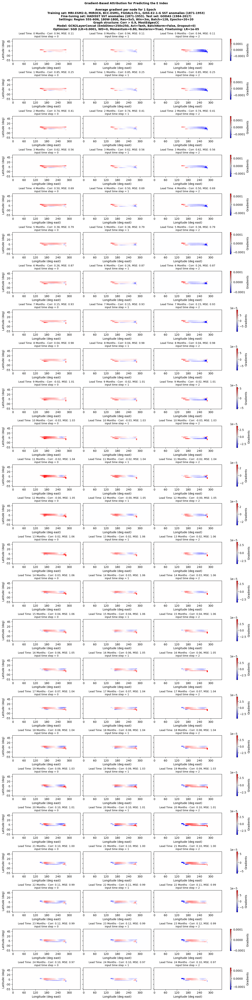

Saved gradients_grid_plot_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx_Lead24.jpg to disk





Target: C index


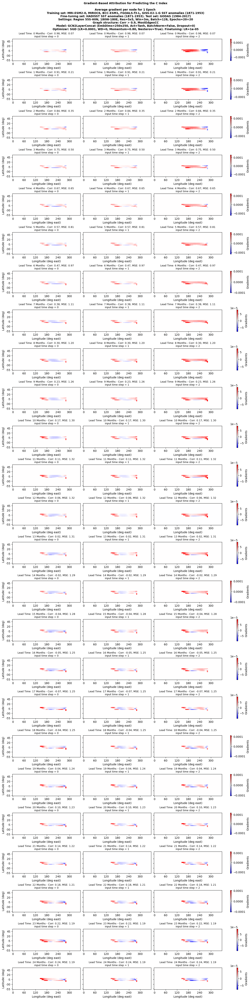

Saved gradients_grid_plot_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx_Lead24.jpg to disk







In [81]:
# plot average Gradients of all graphs of the batch
for target in TARGETS:
    print(f"Target: {target} index")
    graph_utils.plot_gradients_on_grid_all_leads(gnn_gradients_results[target], 'avg_gradient_per_node_fullmap', gnn_finetuning_results, target, INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, nb_lon_gridpoints, nb_lat_gridpoints, subtitle=gnn_subtitle, save_img=True, img_filename=None, img_folder=IMG_FOLDER)
    print()
    print("\n\n==========================================================================================================================================================================\n\n")

##### 1 plot per lead

In [82]:
    # for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
    #     subtitle = f"Gradient per node for last graph of epoch \n{gnn_subtitle}"
    #     filename = f"gradients_gr_plt_{gnn_gradients_results[target][lead_time]['experiment_name']}.jpg"
    #     substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    #     for substring in substrings_to_remove:
    #         filename = filename.replace(substring, "")
    #     filename = filename.replace("MostEdgesCC", "MECC")
    #     filename = filename.replace("timeseries_", "ts_")
    #     filename = filename.replace("Layer", "L")
    #     filename = filename.replace("Lead", "L")
    #     # print(filename)


        
    #     gradients = gnn_gradients_results[target][lead_time]['last_graph_gradients_fullmap']
    #     graph_utils.plot_gradients_on_grid(gradients, gnn_finetuning_results, target, lead_time, INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, 
    #                                        nb_lon_gridpoints, nb_lat_gridpoints, abs_gradient_max=None, last_time_step_only=True, subtitle=None, save_img=True, 
    #                                        img_filename=filename, img_folder=directory, display=True)

Create new directory for img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/
Target: E index


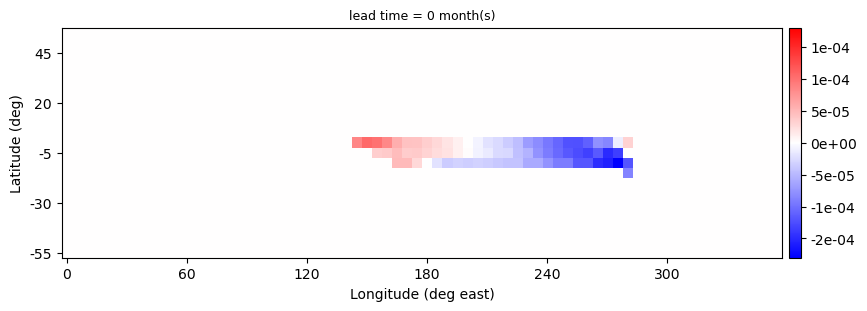

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L00.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



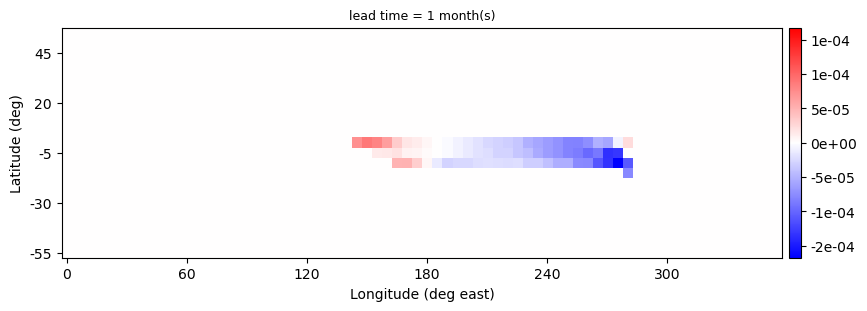

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L01.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



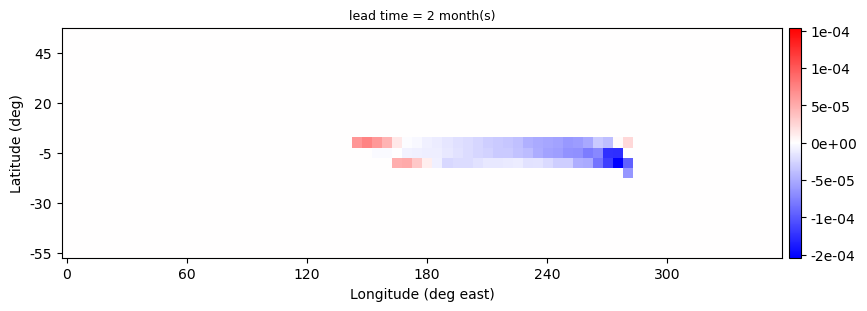

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L02.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



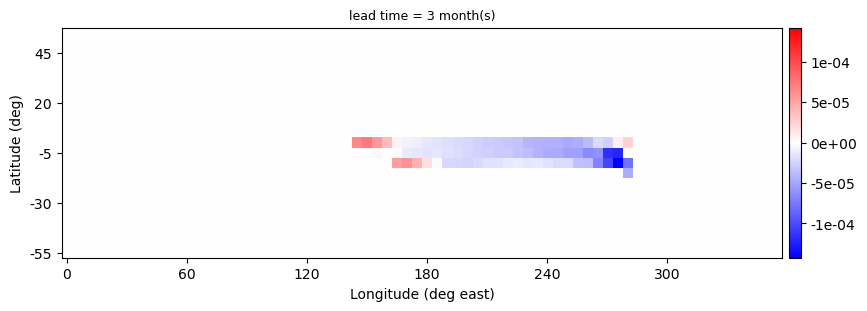

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L03.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



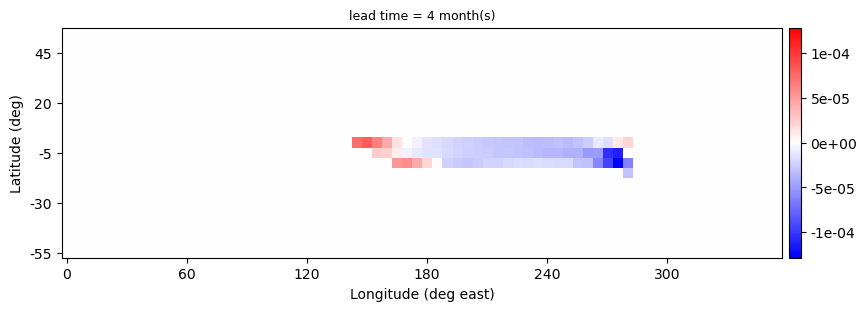

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L04.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



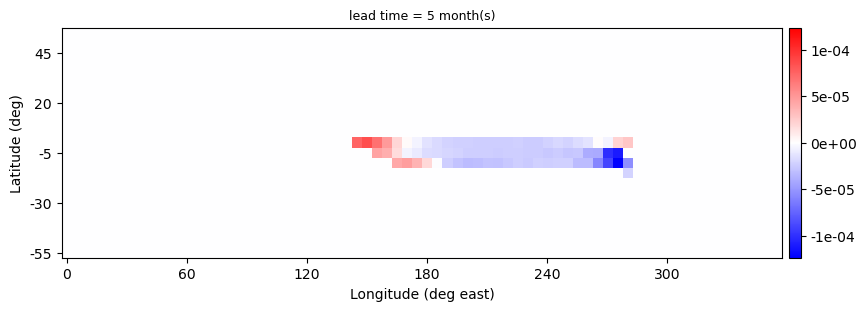

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L05.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



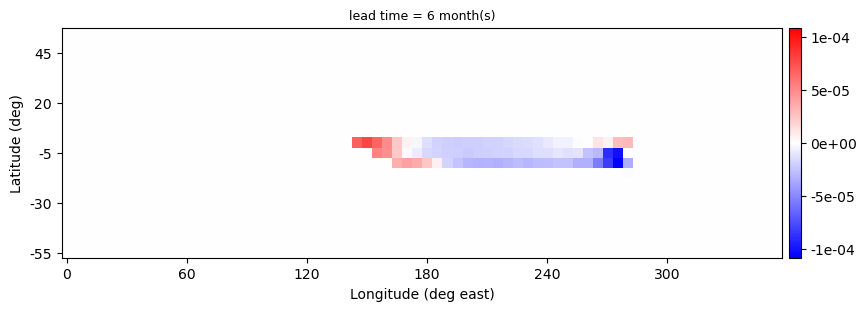

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L06.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



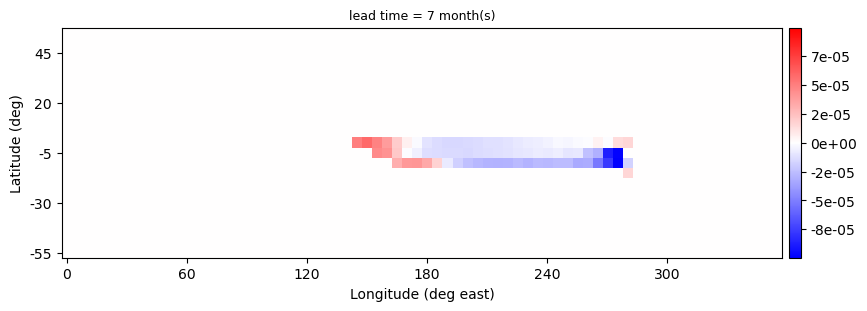

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L07.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



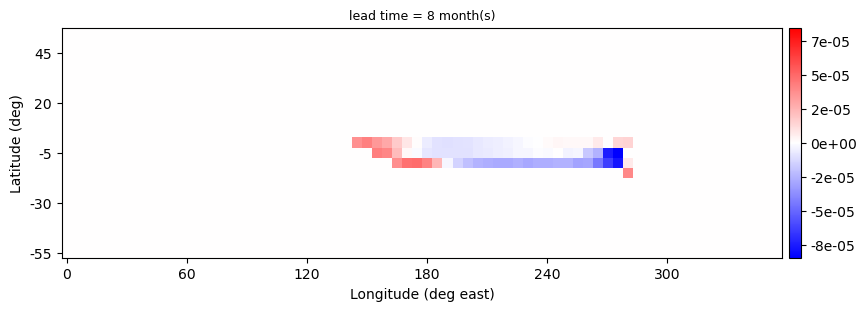

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L08.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



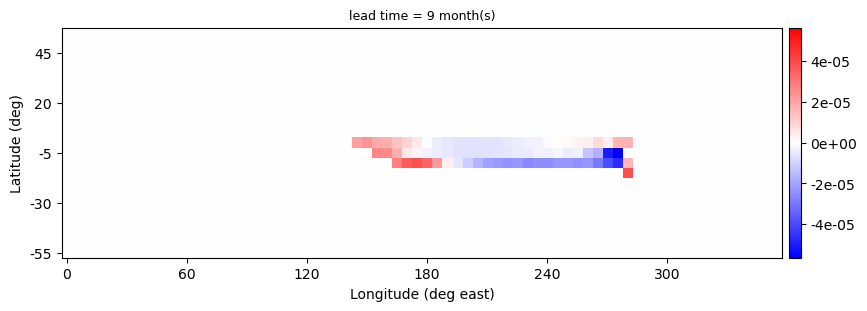

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L09.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



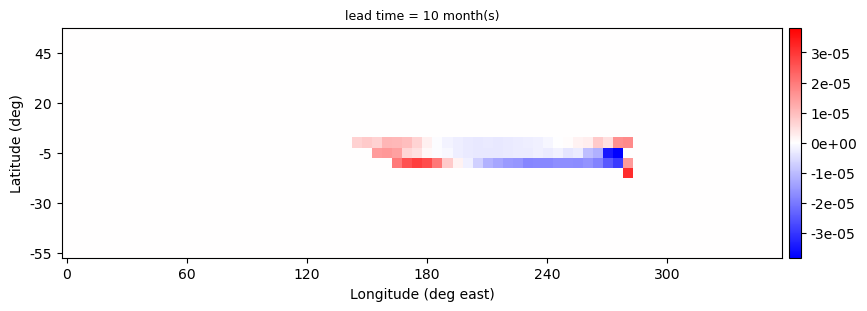

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L10.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



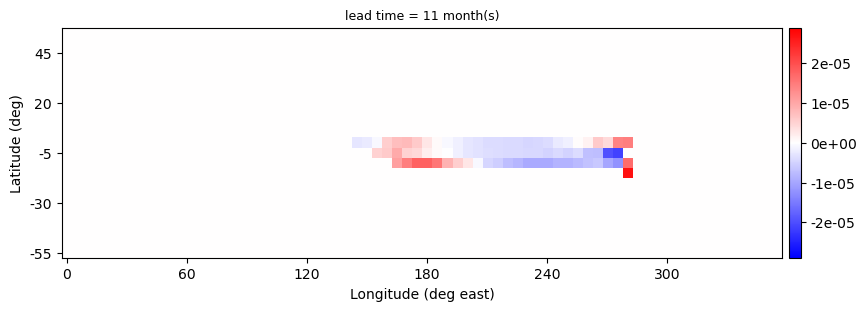

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L11.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



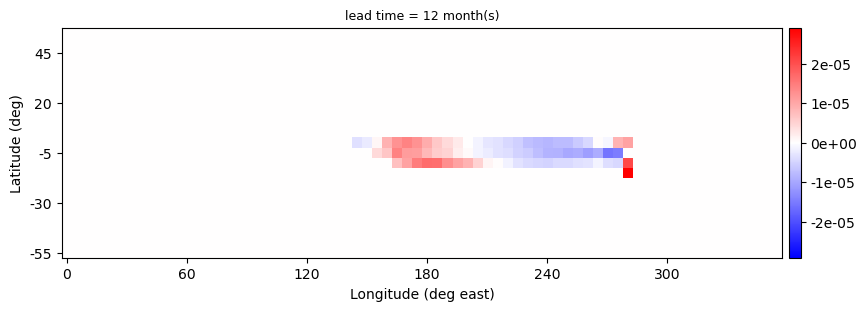

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_L12.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/

Target: C index


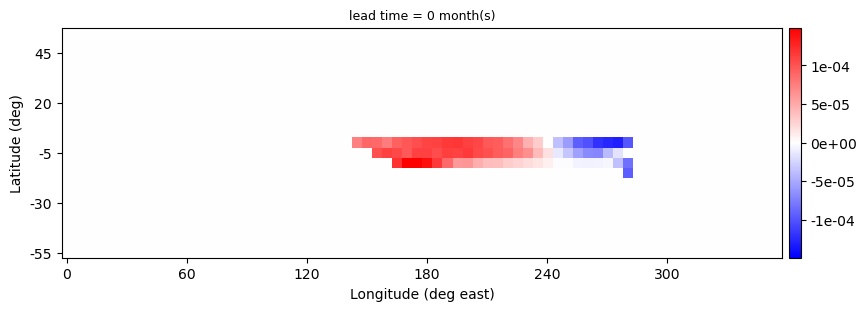

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L00.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



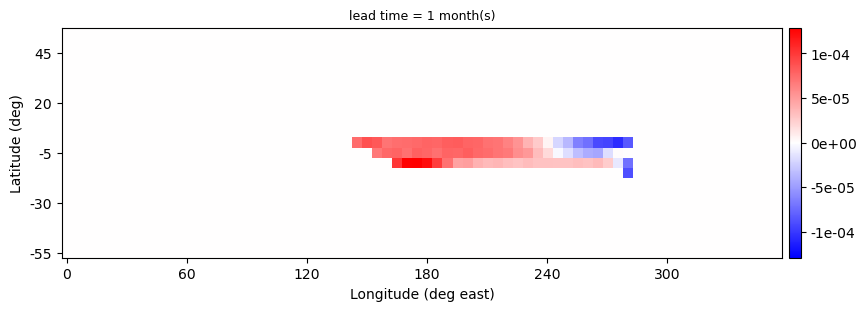

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L01.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



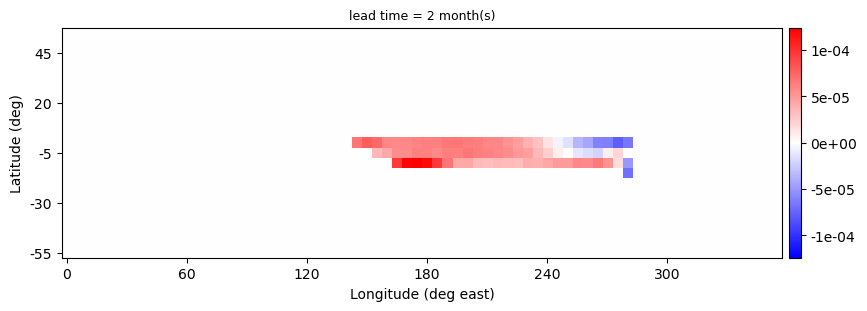

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L02.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



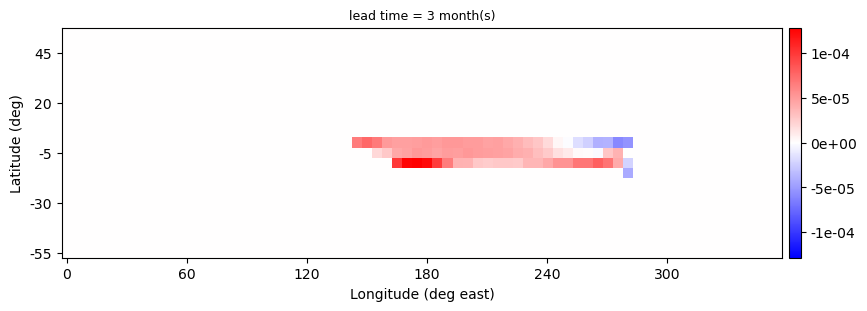

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L03.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



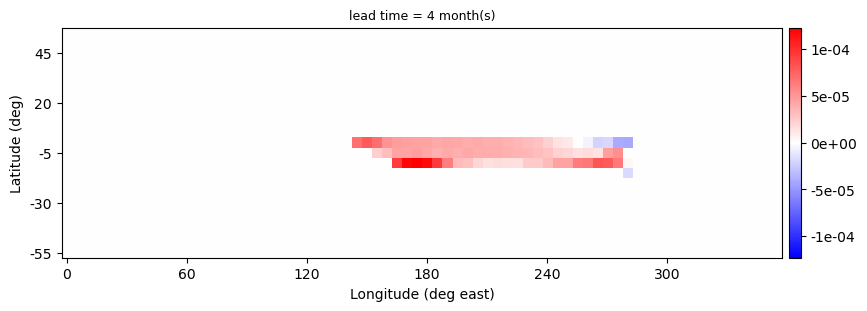

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L04.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



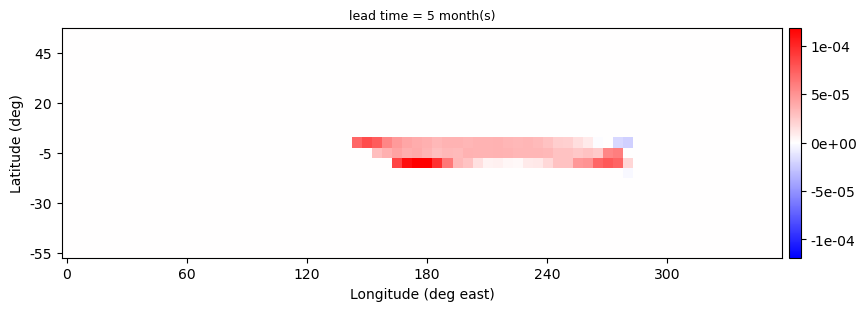

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L05.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



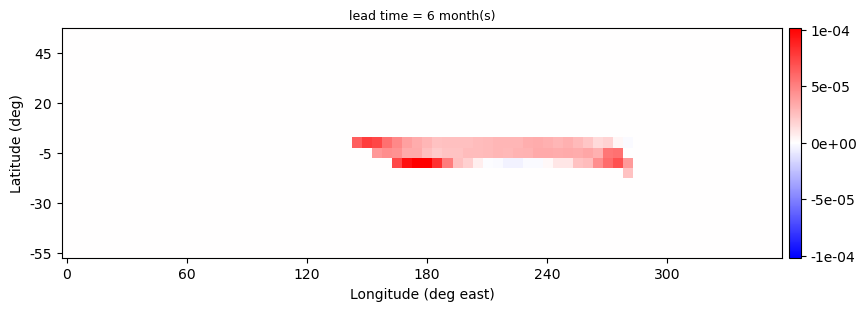

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L06.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



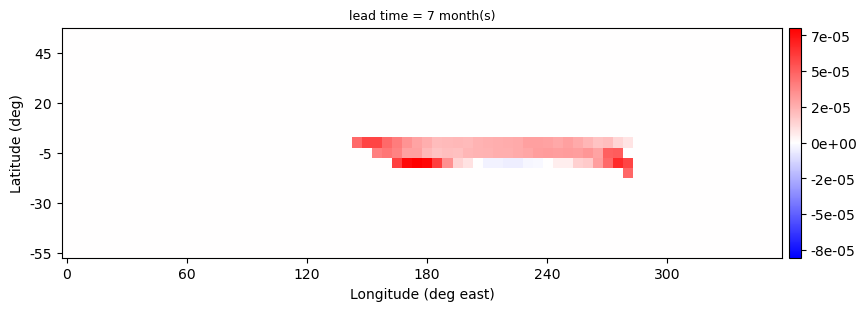

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L07.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



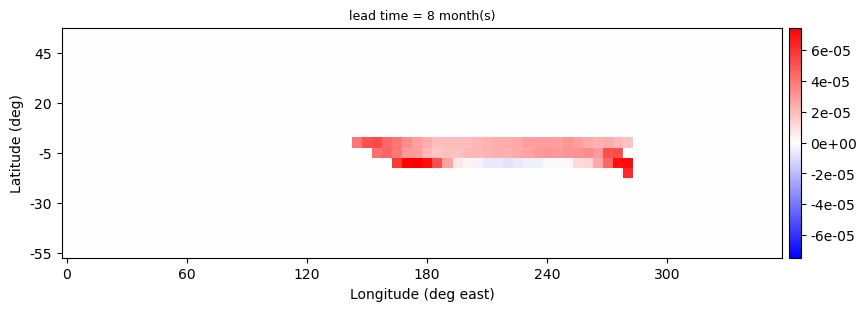

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L08.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



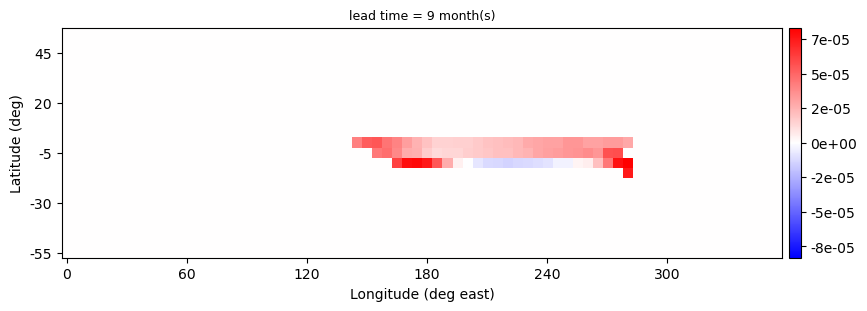

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L09.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



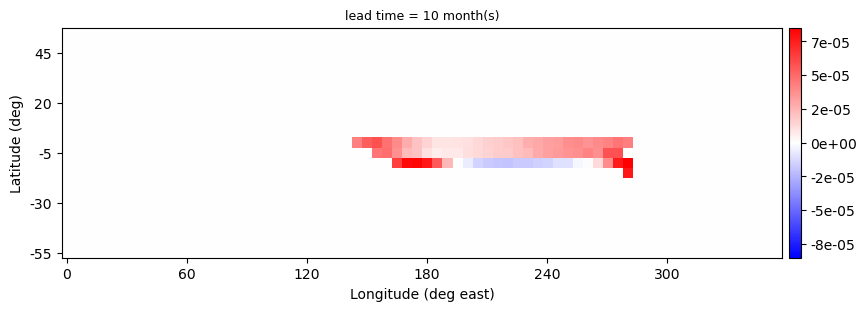

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L10.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



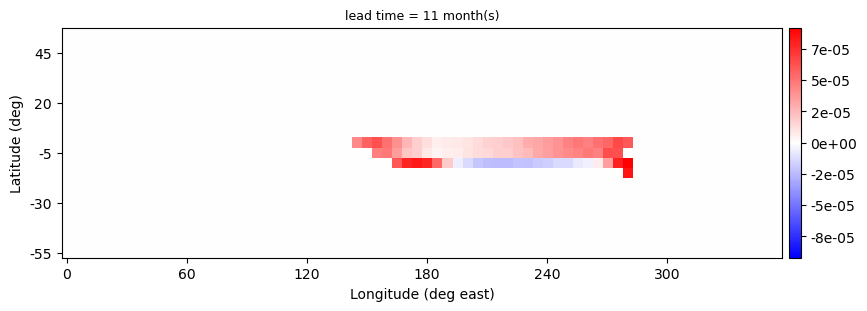

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L11.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



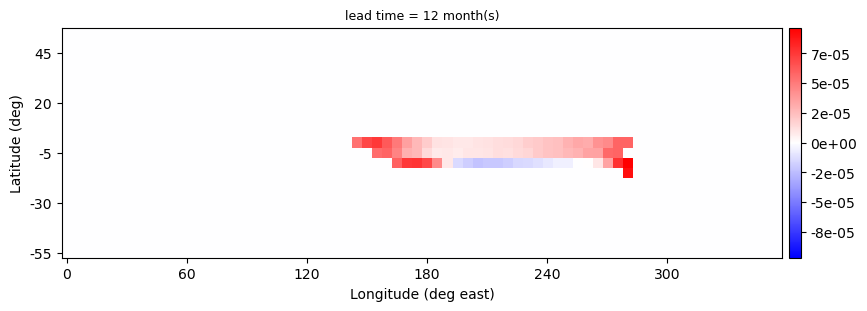

Saved avg_gradients_gr_plt_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_L12.jpg to folder img/gnn_Target_EC_CorrThr090/gradients_map_avg_per_node/



In [83]:
# plot average Gradients of all graphs of the batch
directory = os.path.join(IMG_FOLDER, "gradients_map_avg_per_node/")
if os.path.isdir(directory):
    print(f"{directory} already exist")
else:
    print(f"Create new directory for {directory}")
    os.makedirs(directory, exist_ok=True) 

for target in TARGETS:
    print(f"Target: {target} index")
    for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
        subtitle = f"Average gradient per node for 1 Epoch \n{gnn_subtitle}"
        filename = f"avg_gradients_gr_plt_{gnn_gradients_results[target][lead_time]['experiment_name']}.jpg"
        substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
        for substring in substrings_to_remove:
            filename = filename.replace(substring, "")
        filename = filename.replace("MostEdgesCC", "MECC")
        filename = filename.replace("timeseries_", "ts_")
        filename = filename.replace("Layer", "L")
        filename = filename.replace("Lead", "L")
        # print(filename)

        gradients = gnn_gradients_results[target][lead_time]['avg_gradient_per_node_fullmap']        
        graph_utils.plot_gradients_on_grid(gradients, gnn_finetuning_results, target, lead_time, INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, 
                                           nb_lon_gridpoints, nb_lat_gridpoints, abs_gradient_max=None, last_time_step_only=True, subtitle=None, save_img=True, 
                                           img_filename=filename, img_folder=directory, display=True)
        print()
    print("==========================================================================================================================================================================")

In [84]:
# # plot average Gradients of all graphs of the batch

# # gradients of the last graph of the batch (individual graph per lead)
# directory = os.path.join(IMG_FOLDER, "gradients_map_avg_per_node/")
# if os.path.isdir(directory):
#     print(f"{directory} already exist")
# else:
#     print(f"Create new directory for {directory}")
#     os.makedirs(directory, exist_ok=True) 
# print(directory)
# for target in TARGETS:
#     print(f"Target: {target} index")
#     for lead_time in range(0, MAX_LEAD_TIME): 
#         subtitle = f"Average gradient per node for 1 Epoch \n{gnn_subtitle}"
#         gradients = gnn_gradients_results[target][lead_time]['avg_gradient_per_node_fullmap']
#         # print("gradients.shape: ", gradients.shape)
#         graph_utils.plot_gradients_on_grid(gradients, gnn_finetuning_results, target, lead_time, INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, 
#                                            nb_lon_gridpoints, nb_lat_gridpoints, subtitle=subtitle, save_img=True, img_filename=None, img_folder=directory, display=False)
#         print()
#     print("\n\n==========================================================================================================================================================================\n\n")

##### Create animation

In [85]:
# # plot average Gradients of all graphs of the batch  (individual graph per lead)
# directory = os.path.join(IMG_FOLDER, "gradients_map_avg_per_node/")

# print(f"directory of images: {directory}")

# image_files = []
# for target in TARGETS:
#     print(f"Target: {target} index")
    
#     # create animation in decreasing order (starting from longer leads)
#     for lead_time in range(NB_LEADS_TO_DISPLAY-1, -1, -1):
#         gnn_dict = gnn_finetuning_results[target][lead_time]    
#         img_filename = f"gradients_grid_plot_{gnn_dict['experiment_name']}.jpg"
#         # print(img_filename)
#         file_path = directory + img_filename
#         image_files.append(file_path)

# duration_per_frame = 250  # Duration in milliseconds per frame
# images = [Image.open(file) for file in image_files]
# images[0].save(f'{IMG_FOLDER}animation_avg_graph_{img_filename}.gif', save_all=True, append_images=images[1:], duration=duration_per_frame, loop=0)

##### Display animation

In [86]:
# # Load and display the GIF
# gif_path = f'{IMG_FOLDER}animation_avg_graph_{img_filename}.gif'
# display(IPImage(filename=gif_path))

# ============================================================

## Evaluate performance

### Plot Learning Curves

In [87]:
for target in TARGETS:
    print(f"\n==========================")
    print(f"Target: {target} index")
    
    nb_train_samples = gnn_training_results[target][-1]['nb_train_samples']
    print(f"nb_train_samples: {nb_train_samples:>5,}")

    nb_tune_samples = gnn_finetuning_results[target][-1]['nb_train_samples']
    print(f"nb_tune_samples:  {nb_tune_samples:>5,}")
    
    nb_test_samples = gnn_finetuning_results[target][-1]['nb_test_samples']
    print(f"nb_test_samples:  {nb_test_samples:>5,}")


Target: E index
nb_train_samples: 4,970
nb_tune_samples:    994
nb_test_samples:    406

Target: C index
nb_train_samples: 4,970
nb_tune_samples:    994
nb_test_samples:    406


In [88]:
gnn_subtitle = (
    f'Training set: {TRAIN_SOURCE_IDS_STR} SST anomalies ({train_start_year}-{train_end_year}, {nb_train_samples:,} samples)\n'
    f'Fine-tuning set: {FINETUNE_SOURCE_IDS_STR} SST anomalies ({train_start_year}-{train_end_year}, {nb_tune_samples:,} samples). Test set: {TEST_SOURCE_ID} ({test_start_year}-{test_end_year}, {nb_test_samples:,} samples)\n'
    f'Settings: Region {COORDINATES}, Res={RESOLUTION}x{RESOLUTION}, Win={INPUT_TIME_STEPS}m, Batch={BATCH_SIZE}, Epochs={NUM_EPOCHS_TRAIN}+{NUM_EPOCHS_FINETUNE}\n'
    f'Graph structure: {SUBTITLE_SHORT}, {NODES_TRIM_METHOD_STR}\n'
    f'Model: {MODEL_DETAILS_TITLE}\n'
    f'Optimizer: {OPTIMIZER_DETAILS_TITLE}. Finetuning: LR={LEARNING_RATE_FINETUNING}'
)
print(gnn_subtitle)

Training set: MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G SST anomalies (1871-1953, 4,970 samples)
Fine-tuning set: HADISST SST anomalies (1871-1953, 994 samples). Test set: GODAS (1984-2017, 406 samples)
Settings: Region 55S-60N, 180W-180E, Res=5x5, Win=3m, Batch=128, Epochs=20+20
Graph structure: Corr > 0.9, MostEdgesCC
Model: GCN2LayerConcat (EmbDims=250x250, Act=Tanh, BatchNorm=False, Dropout=0)
Optimizer: SGD (LR=0.0001, WD=0, Momentum=0.80, Nesterov=True). Finetuning: LR=1e-05




Target: E index

Batch learning curves:
940


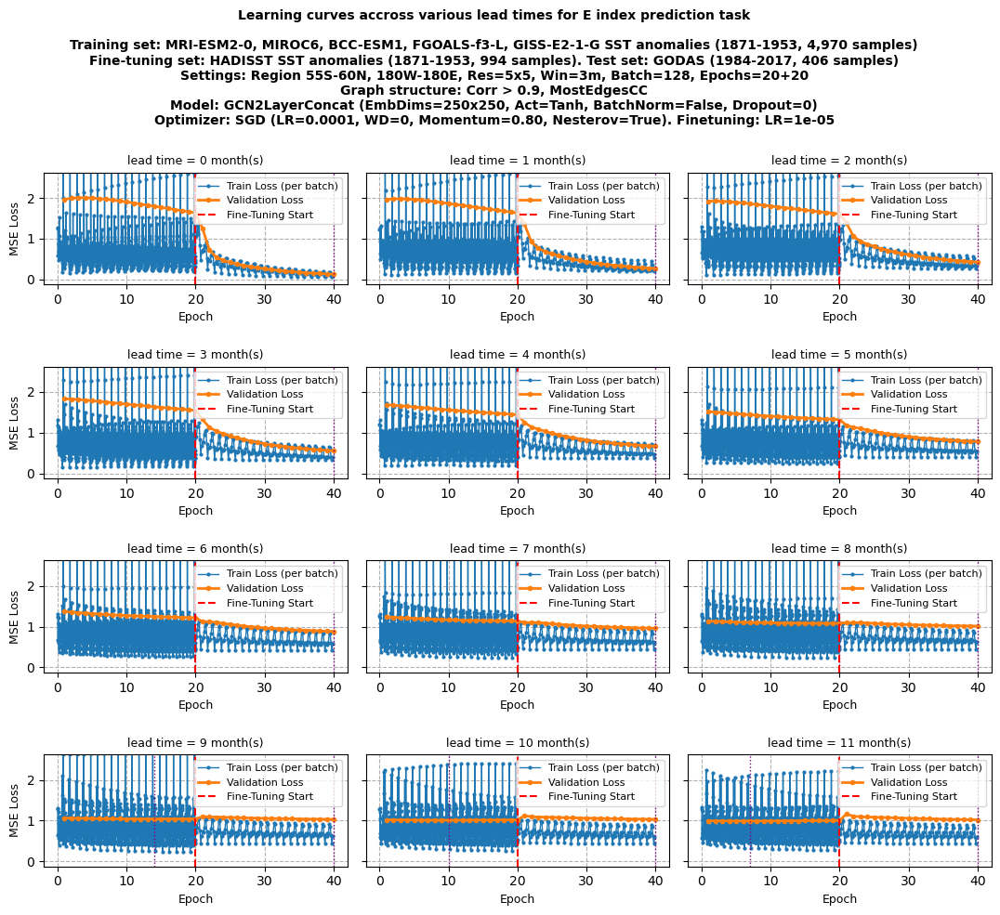

Saved _model_learning_curves_batch_combined_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx_Lead24.jpg to disk

Epoch learning curves:


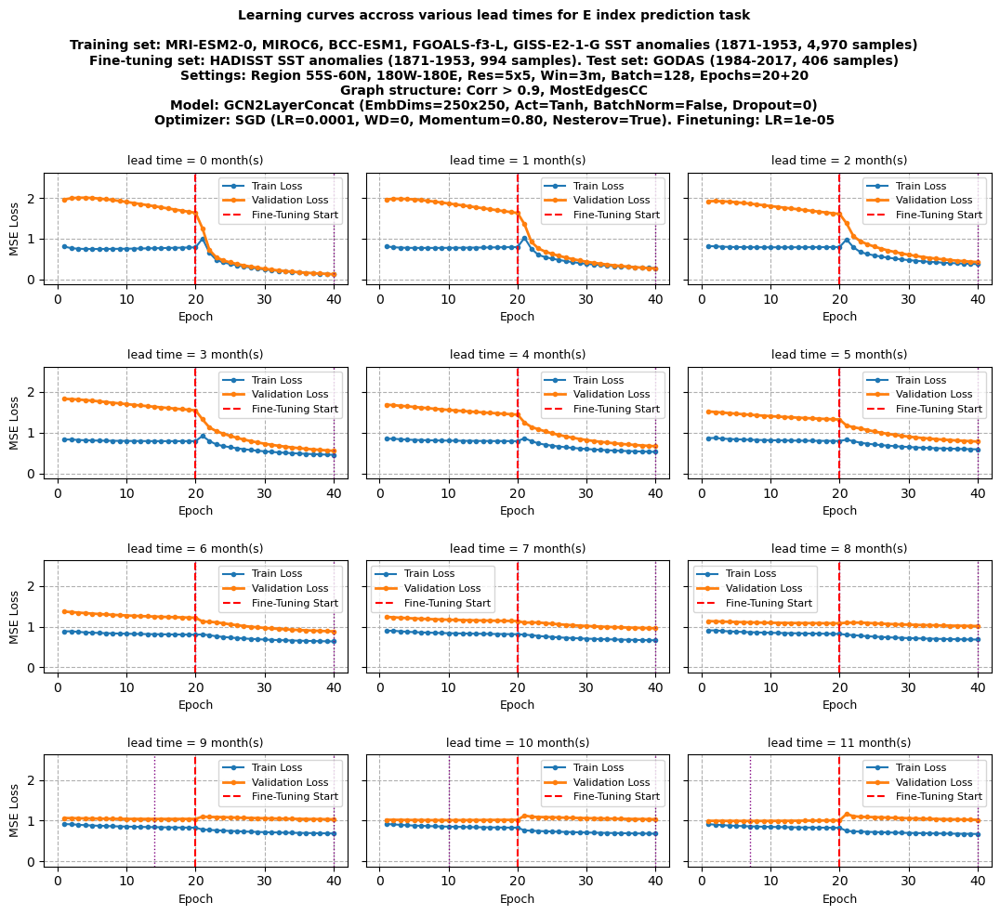

Saved _model_learning_curves_epoch_combined_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx_Lead24.jpg to disk


Target: C index

Batch learning curves:
940


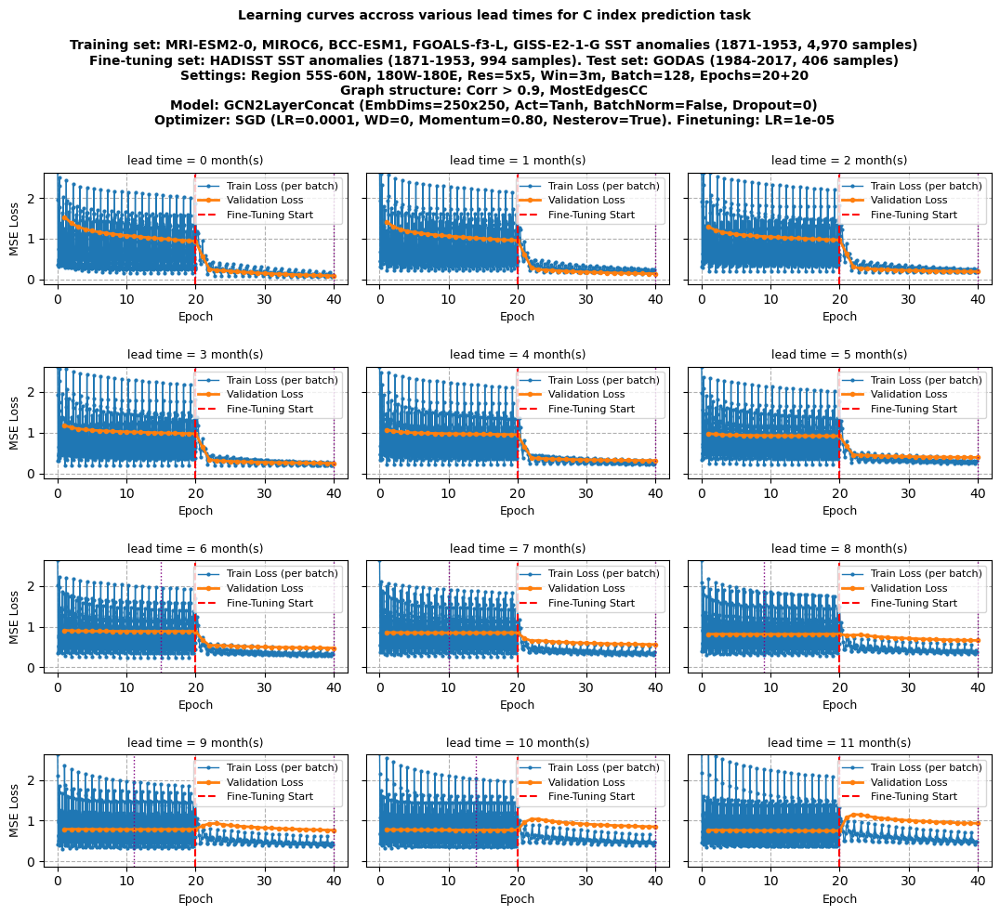

Saved _model_learning_curves_batch_combined_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx_Lead24.jpg to disk

Epoch learning curves:


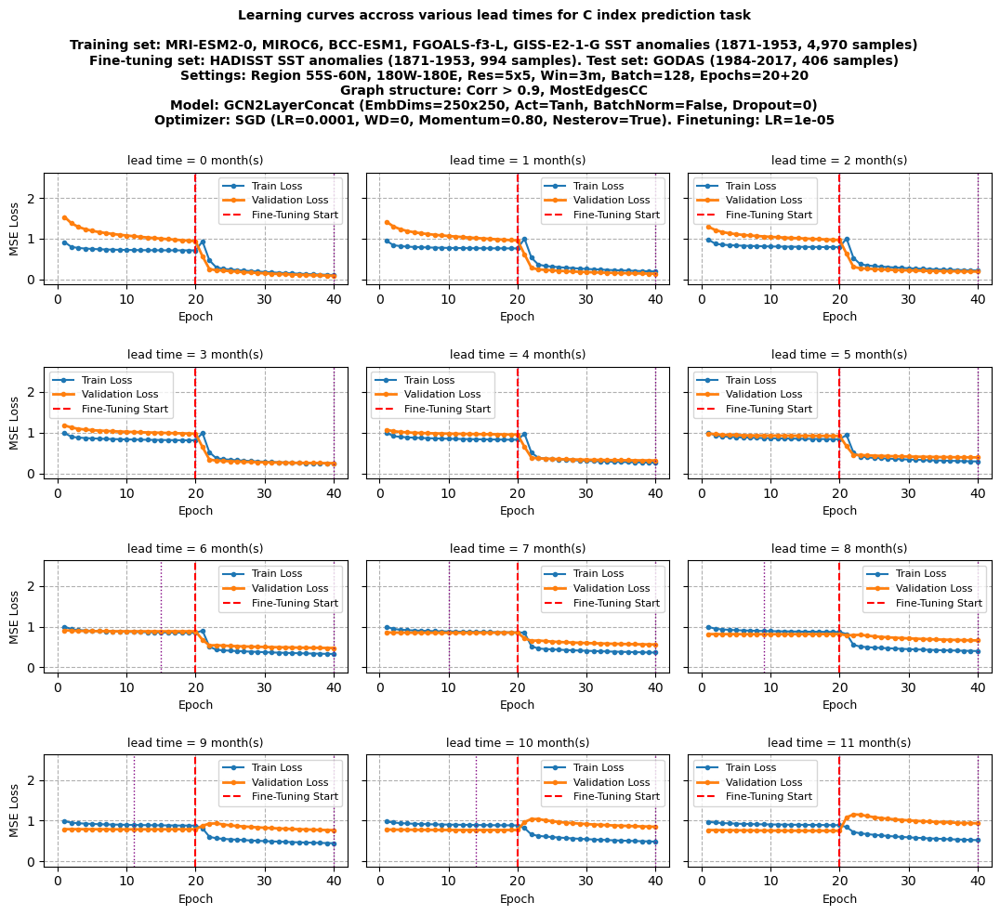

Saved _model_learning_curves_epoch_combined_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx_Lead24.jpg to disk


In [89]:
# # Training Curves
# ROWS_TO_SHOW = 4
# for target in TARGETS:
#     filename = f"_model_learning_curves_batch_{experiment_name}.jpg"
#     graph_utils.plot_learning_curves_finetune(gnn_training_results, target, num_epochs=NUM_EPOCHS_TRAIN, train_loss_display="batch", rows_to_show=ROWS_TO_SHOW, 
#                                      subtitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)

#     filename = f"_model_learning_curves_epoch_{experiment_name}.jpg"
#     graph_utils.plot_learning_curves_finetune(gnn_training_results, target, num_epochs=NUM_EPOCHS_TRAIN, train_loss_display="epoch", rows_to_show=ROWS_TO_SHOW, 
#                                      subtitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)

# # Finetuning Curves
# ROWS_TO_SHOW = 4
# for target in TARGETS:
#     filename = f"_model_learning_curves_batch_{experiment_name}.jpg"
#     graph_utils.plot_learning_curves_finetune(gnn_finetuning_results, target, num_epochs=NUM_EPOCHS_FINETUNE, train_loss_display="batch", rows_to_show=ROWS_TO_SHOW, 
#                                      subtitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)

#     filename = f"_model_learning_curves_epoch_{experiment_name}.jpg"
#     graph_utils.plot_learning_curves_finetune(gnn_finetuning_results, target, num_epochs=NUM_EPOCHS_FINETUNE, train_loss_display="epoch", rows_to_show=ROWS_TO_SHOW, 
#                                      subtitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)

# Combined Curves
ROWS_TO_SHOW = 4
for target in TARGETS:
    print(f"\n\n================================================================================================================================================================")
    print(f"Target: {target} index")

    # Batch learning curves
    print(f"\nBatch learning curves:")    
    # print(gnn_results[target][-1]['train_num_epochs'])
    # print(gnn_results[target][-1]['tune_num_epochs'])
    print(len(gnn_results[target][-1]['combined_loss_history']))
    
    filename = f"_model_learning_curves_batch_{gnn_results[target][-1]['experiment_name']}.jpg"
    graph_utils.plot_learning_curves_finetune(gnn_results, target, num_epochs=NUM_EPOCHS_TRAIN+NUM_EPOCHS_FINETUNE, train_loss_display="batch", rows_to_show=ROWS_TO_SHOW, 
                                     subtitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)


    # Epoch learning curves
    print(f"\nEpoch learning curves:")    
    filename = f"_model_learning_curves_epoch_{gnn_results[target][-1]['experiment_name']}.jpg"
    graph_utils.plot_learning_curves_finetune(gnn_results, target, num_epochs=NUM_EPOCHS_TRAIN+NUM_EPOCHS_FINETUNE, train_loss_display="epoch", rows_to_show=ROWS_TO_SHOW, 
                                     subtitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)

### Plot Predicted vs True Index

In [90]:
# get maximum abs value and use it for y_min and y_max
v_min, v_max = np.inf, -np.inf
for target in TARGETS:
    for gnn_dict in gnn_finetuning_results[target]:
        v_min = min(v_min, gnn_dict['predictions'].min(), gnn_dict['y_test'].min())
        v_max = max(v_max, gnn_dict['predictions'].max(), gnn_dict['y_test'].max())
        abs_v_max = max(abs(v_min), abs(v_max))

# add 1 to get a little margin
abs_v_max = abs_v_max + 1
print(f"Maximum Absolute Value +1 for actual and predicted {TARGETS} target(s): {abs_v_max:.2f}")

Maximum Absolute Value +1 for actual and predicted ['E', 'C'] target(s): 5.25


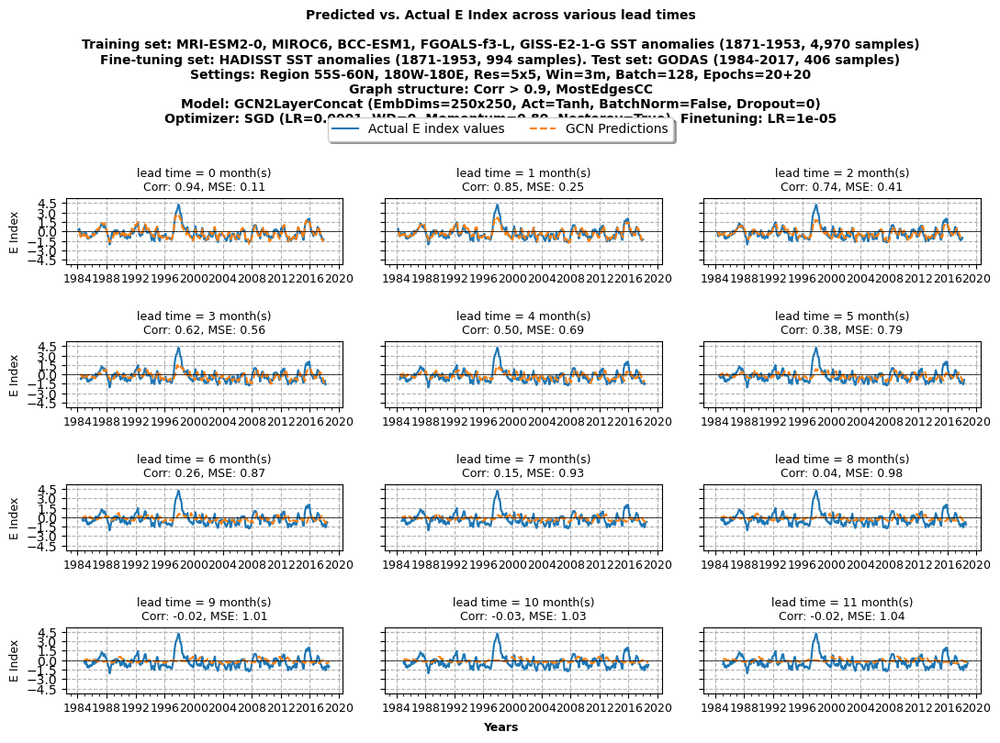

Saved _model_pred_true_timeseries_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx_Lead24.jpg to disk


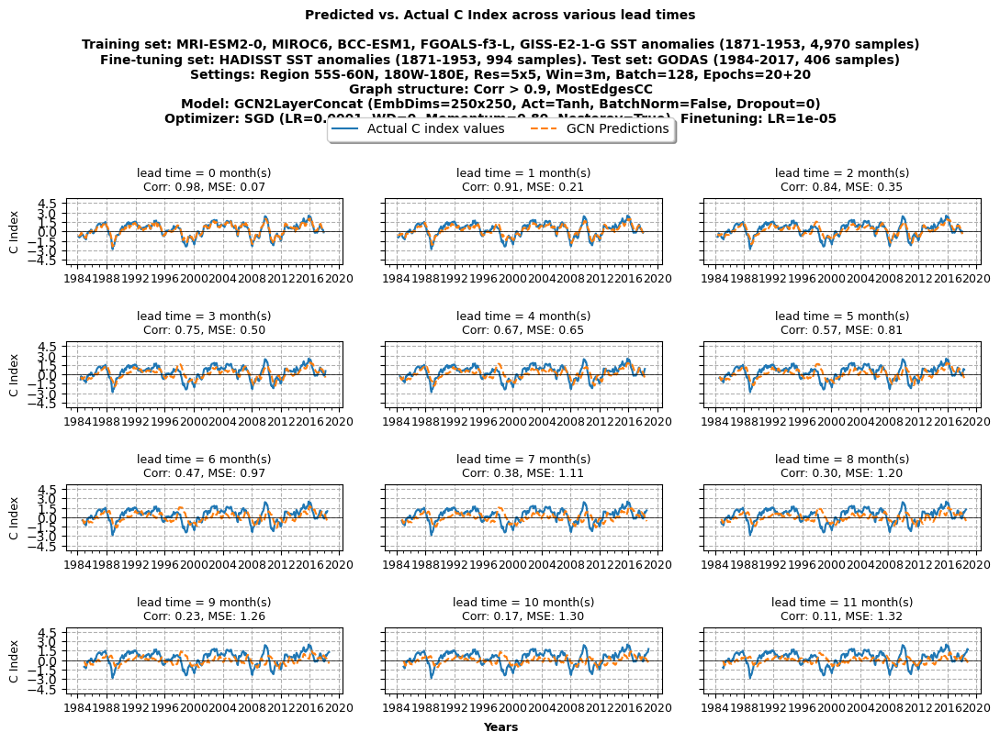

Saved _model_pred_true_timeseries_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx_Lead24.jpg to disk


In [91]:
for target in TARGETS:
    filename = f"_model_pred_true_timeseries_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"
    graph_utils.plot_pred_vs_actual_timeseries(gnn_finetuning_results, target, abs_v_max, rows_to_show=ROWS_TO_SHOW, 
                                               subtitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)

### Plot selected times series 

In [92]:
gnn_subtitle

'Training set: MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G SST anomalies (1871-1953, 4,970 samples)\nFine-tuning set: HADISST SST anomalies (1871-1953, 994 samples). Test set: GODAS (1984-2017, 406 samples)\nSettings: Region 55S-60N, 180W-180E, Res=5x5, Win=3m, Batch=128, Epochs=20+20\nGraph structure: Corr > 0.9, MostEdgesCC\nModel: GCN2LayerConcat (EmbDims=250x250, Act=Tanh, BatchNorm=False, Dropout=0)\nOptimizer: SGD (LR=0.0001, WD=0, Momentum=0.80, Nesterov=True). Finetuning: LR=1e-05'

In [93]:
filename = f"_ts_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"
filename



filename

'_ts_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx_Lead24.jpg'

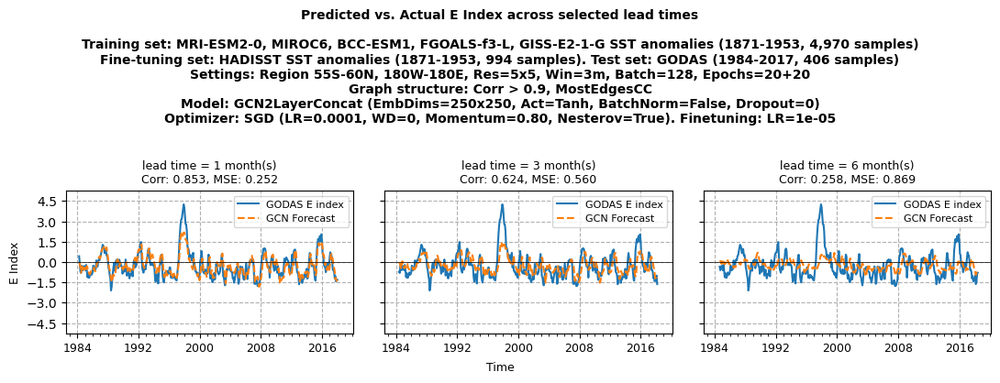

Saved _ts_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E.jpg to disk


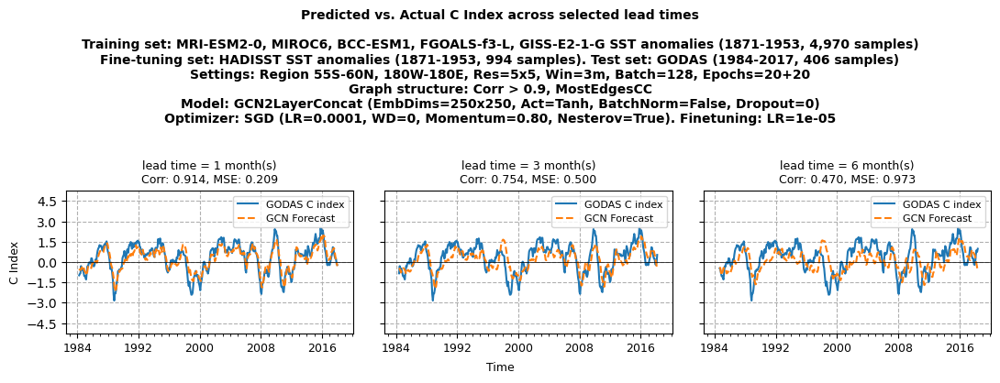

Saved _ts_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C.jpg to disk


In [94]:
# with titles
for target in TARGETS:
    filename = f"_model_pred_true_timeseries_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_pred_true_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("timeseries_", "ts_")
    filename = filename.replace("Layer", "L")

    graph_utils.plot_selected_pred_vs_actual_timeseries(gnn_finetuning_results, target, abs_v_max, selected_lead_times=[1, 3, 6], 
                                                        subtitle=gnn_subtitle, individual_titles=True, save_img=SAVE_PLOTS_TO_DISK, 
                                                        img_filename=filename, img_folder=IMG_FOLDER)

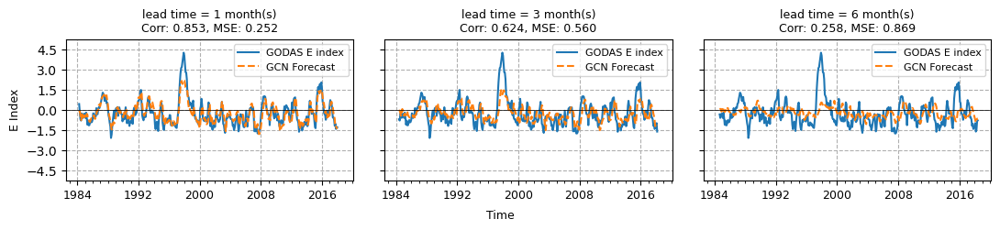

Saved _ts_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_no_titles.jpg to disk


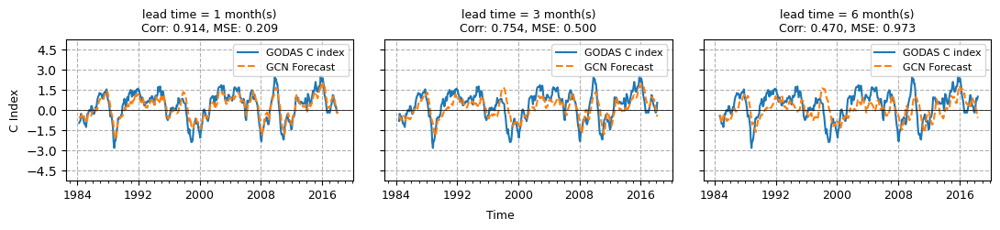

Saved _ts_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_no_titles.jpg to disk


In [95]:
# without titles
for target in TARGETS:
    filename = f"_model_pred_true_timeseries_{gnn_finetuning_results[target][-1]['experiment_name']}_no_titles.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_pred_true_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("timeseries_", "ts_")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_selected_pred_vs_actual_timeseries(gnn_finetuning_results, target, abs_v_max, selected_lead_times=[1, 3, 6], 
                                                        subtitle=None, individual_titles=True, save_img=SAVE_PLOTS_TO_DISK, 
                                                        img_filename=filename, img_folder=IMG_FOLDER)

### Compare with other models

#### Load corresponding results from PF, LR, RR

In [96]:
TRAIN_SOURCE_IDS_STR

'MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G'

In [97]:
TRAIN_SOURCE_IDS_FILENAME.replace("MRI_MIROC6_BCC_FGOALS_GISS", "CMIP6")

'CMIP6'

In [98]:
# persist_model_results, lin_reg_results, ridge_reg_results, cnn_results, gnn_results = {}, {}, {}, {}, {}
persist_model_results, lin_reg_results, ridge_reg_results, cnn_finetuning_results = {}, {}, {}, {}

for target in TARGETS:

    if target == "oni":
        results_folder = RESULTS_ONI_FOLDER
    elif target == "nino34":
        results_folder = RESULTS_NINO34_FOLDER
    elif target == "E":
        results_folder = RESULTS_EC_FOLDER
        target = 'E'
    elif target == "C":
        results_folder = RESULTS_EC_FOLDER
        target = 'C'
    else:
        print(f"Unknown target {target}. Abort")
    

    
    print(f"\nLoad model results for target {target} from {results_folder}")

    # search_term = f"{TEST_SOURCE_ID}_{target.capitalize()}"
    # print("search_term: ", search_term)

    search_term = (
        f"Train_{FINETUNE_SOURCE_IDS_STR}_"
        f"{train_start_year}-{train_end_year}_"
        f"Test_{TEST_SOURCE_ID_FILENAME}_"
        f"{test_start_year}-{test_end_year}_"
        f"Win{INPUT_TIME_STEPS:02d}_"
        f"{utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}_"
        f"Res{RESOLUTION}_"
        f"{target.capitalize()}Idx"
    )
    print("search_term: ", search_term)
    
    # Load persistent forecast results as pickle file
    folder = os.path.join(results_folder, "pf")
    filename, filepath = graph_utils.find_file(folder, search_term, file_extension='.pkl')
    print(filename, filepath)
    with open(filepath, "rb") as file:
        persist_model_results[target] = pickle.load(file)
        print(f"• PF: {filepath}")

    # Load Linear Regression results as pickle file
    folder = os.path.join(results_folder, "lr")
    filename, filepath = graph_utils.find_file(folder, search_term, file_extension='.pkl')
    with open(filepath, "rb") as file:
        lin_reg_results[target] = pickle.load(file)
        print(f"• LR: {filepath}")
                        
    # Load Ridge Regression results as pickle file
    folder = os.path.join(results_folder, "rr")
    filename, filepath = graph_utils.find_file(folder, search_term, file_extension='.pkl')
    with open(filepath, "rb") as file:
        ridge_reg_results[target] = pickle.load(file)
        print(f"• RR: {filepath}")

    cnn_search_term = (
        f"results_tune_CNN3L_"
        f"Train_{TRAIN_SOURCE_IDS_FILENAME.replace('MRI_MIROC6_BCC_FGOALS_GISS', 'CMIP6')}_"
        # f"Train_CMIP6_"
        f"Tune_{FINETUNE_SOURCE_IDS_STR}_"
        f"{train_start_year}-{train_end_year}_"
        f"Ep{NUM_EPOCHS_TRAIN:02d}-{NUM_EPOCHS_FINETUNE:02d}_"
        f"Test_{TEST_SOURCE_ID_FILENAME}_"
        f"{test_start_year}-{test_end_year}_"
        f"Win{INPUT_TIME_STEPS:02d}_"
        f"{utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}_"
        f"Res{RESOLUTION}_"
        f"Adam_"
        f"{target.capitalize()}Idx"
    )
    # print("cnn_search_term: ", cnn_search_term)

    # Load CNN finetuning results as pickle file
    folder = os.path.join(results_folder, "cnn")
    # print(folder)
    filename, filepath = graph_utils.find_file(folder, cnn_search_term, file_extension='.pkl')
    with open(filepath, "rb") as file:
        cnn_finetuning_results[target] = pickle.load(file)
        print(f"• CNN: {filepath}")


    # print("gnn_results_filename: ", gnn_results_filename)

    # # Load GNN results as pickle file
    # folder = os.path.join(results_folder, "gnn")
    # print(folder)
    # filename, filepath = graph_utils.find_file(folder, gnn_results_filename, file_extension='.pkl')
    # with open(filepath, "rb") as file:
    #     gnn_results[target] = pickle.load(file)
    #     print(f"• GNN: {filepath}")


Load model results for target E from saved_results/ec
search_term:  Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx
results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl saved_results/ec/pf/results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
• PF: saved_results/ec/pf/results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
• LR: saved_results/ec/lr/results_LR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
• RR: saved_results/ec/rr/results_RR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
• CNN: saved_results/ec/cnn/results_tune_CNN3L_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Adam_EIdx.pkl

Load model results for target C from saved_results/ec
search_term:  Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-18

In [99]:
# extract correlations and mses
pf_correlations, lr_correlations, rr_correlations, cnn_correlations, gnn_correlations = {}, {}, {}, {}, {}
pf_mses, lr_mses, rr_mses, cnn_mses, gnn_mses = {}, {}, {}, {}, {}
max_mses_pf_rr = 0

for target in TARGETS:
    
    pf_correlations[target] = [pf_dict['corr'] for pf_dict in persist_model_results[target]]
    lr_correlations[target] = [lr_dict['corr'] for lr_dict in lin_reg_results[target]]
    rr_correlations[target] = [rr_dict['corr'] for rr_dict in ridge_reg_results[target]]
    cnn_correlations[target] = [cnn_dict['corr'] for cnn_dict in cnn_finetuning_results[target]]
    gnn_correlations[target] = [gnn_dict['corr'] for gnn_dict in gnn_finetuning_results[target]]

    pf_mses[target] = [pf_dict['mse'] for pf_dict in persist_model_results[target]]
    lr_mses[target] = [lr_dict['mse'] for lr_dict in lin_reg_results[target]]
    rr_mses[target] = [rr_dict['mse'] for rr_dict in ridge_reg_results[target]]
    cnn_mses[target] = [cnn_dict['mse'] for cnn_dict in cnn_finetuning_results[target]]
    gnn_mses[target] = [gnn_dict['mse'] for gnn_dict in gnn_finetuning_results[target]]

    # get the max value of pf and rr across targets to make the plots consistent
    max_mses_pf_rr = np.max((max_mses_pf_rr, np.max(pf_mses[target] + rr_mses[target])))
max_mses_pf_rr

2.5509917736053467

#### Compare time series predictions

In [100]:
model_results_dict = {
    'Persistent Forecast': persist_model_results,
    'Ridge Regr.': ridge_reg_results,
    'CNN': cnn_finetuning_results,
    'GNN': gnn_finetuning_results
}


Target: E index
Target: E index


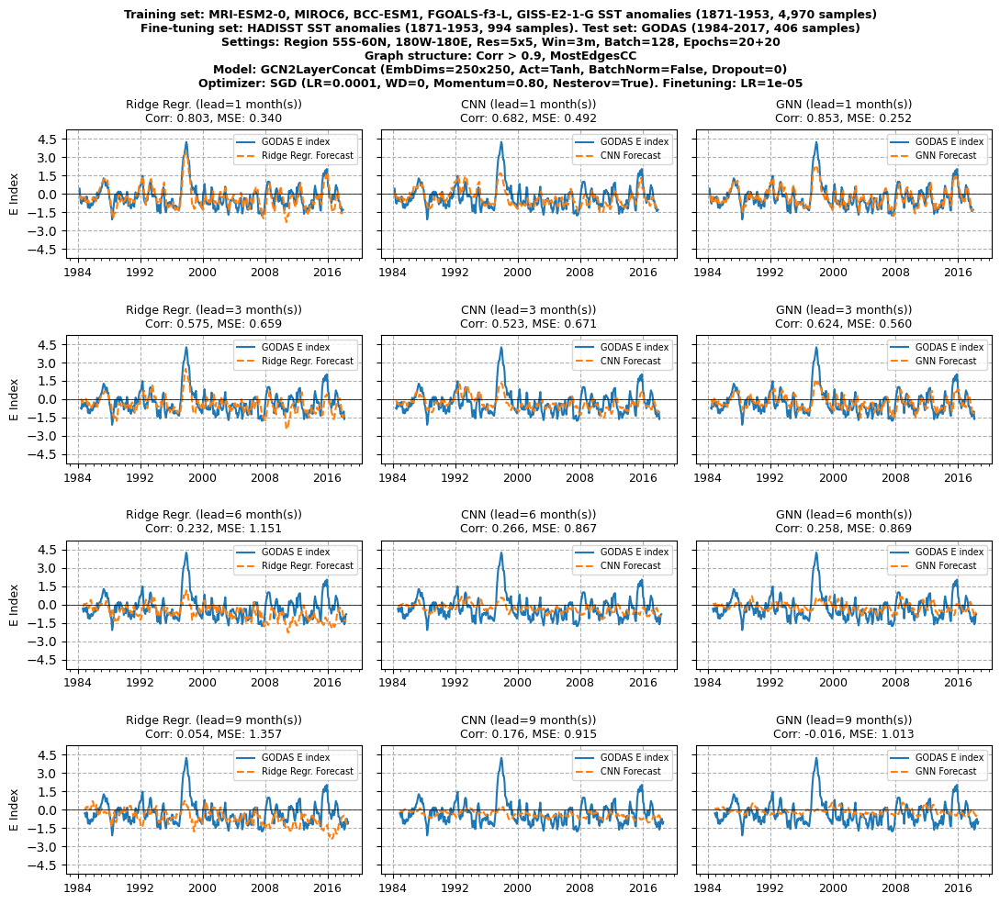

Saved _compare_ts_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E.jpg to disk


Target: C index
Target: C index


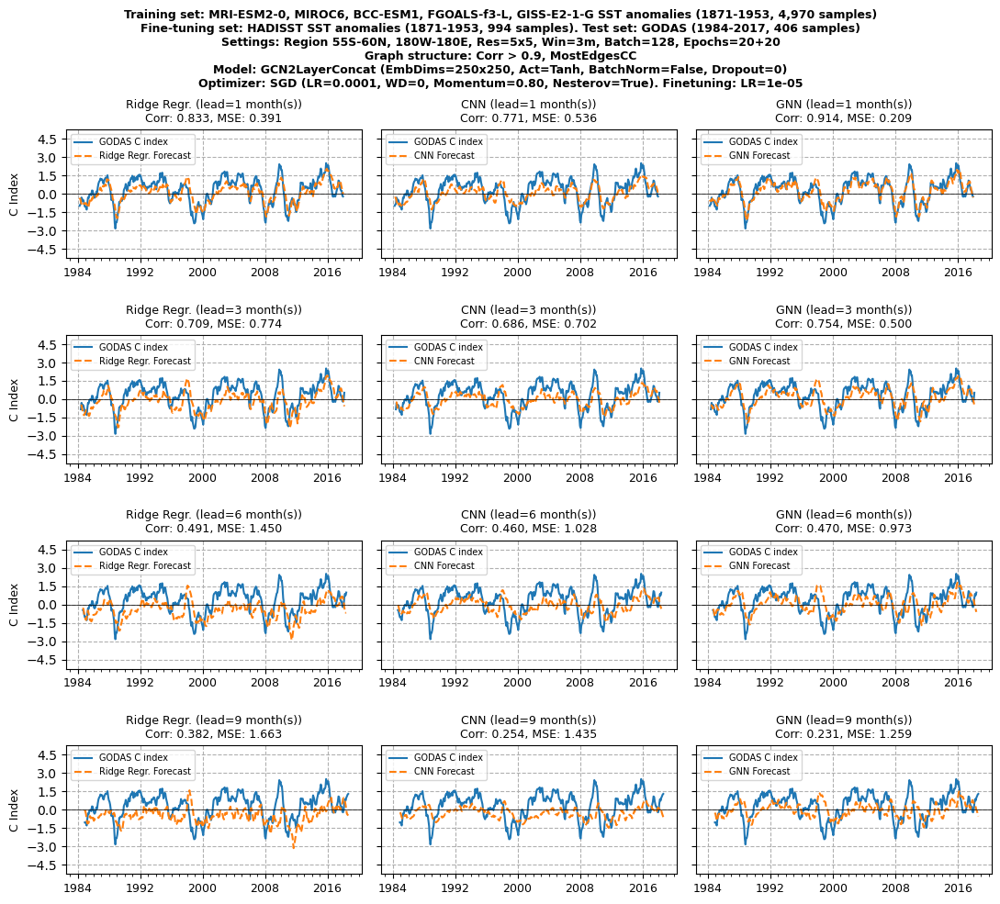

Saved _compare_ts_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C.jpg to disk




In [101]:
# with title
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_compare_ts_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_and_compare_timeseries(
        target=target,  # List of targets
        model_results_dict=model_results_dict,  
        abs_v_max=abs_v_max, 
        selected_lead_times=[1, 3, 6, 9],  
        # selected_models=['Persistent Forecast', 'Ridge Regression', 'CNN', 'GNN'],  # List of models to plot
        selected_models=['Ridge Regr.', 'CNN', 'GNN'],  # List of models to plot
        suptitle=gnn_subtitle,
        save_img=SAVE_PLOTS_TO_DISK, 
        img_filename=filename, 
        img_folder=IMG_FOLDER
    )
    print("\n" + "=" * 200 + "\n")

Target: E index
Target: E index


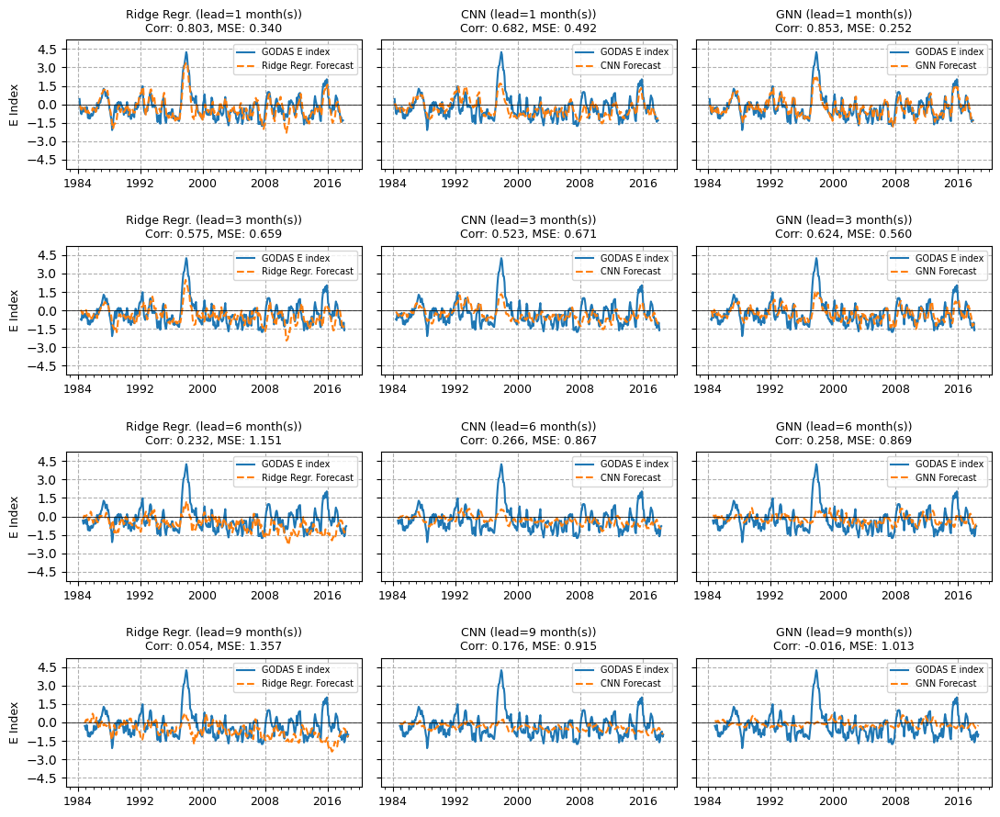

Saved _compare_ts_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_no_title.jpg to disk


Target: C index
Target: C index


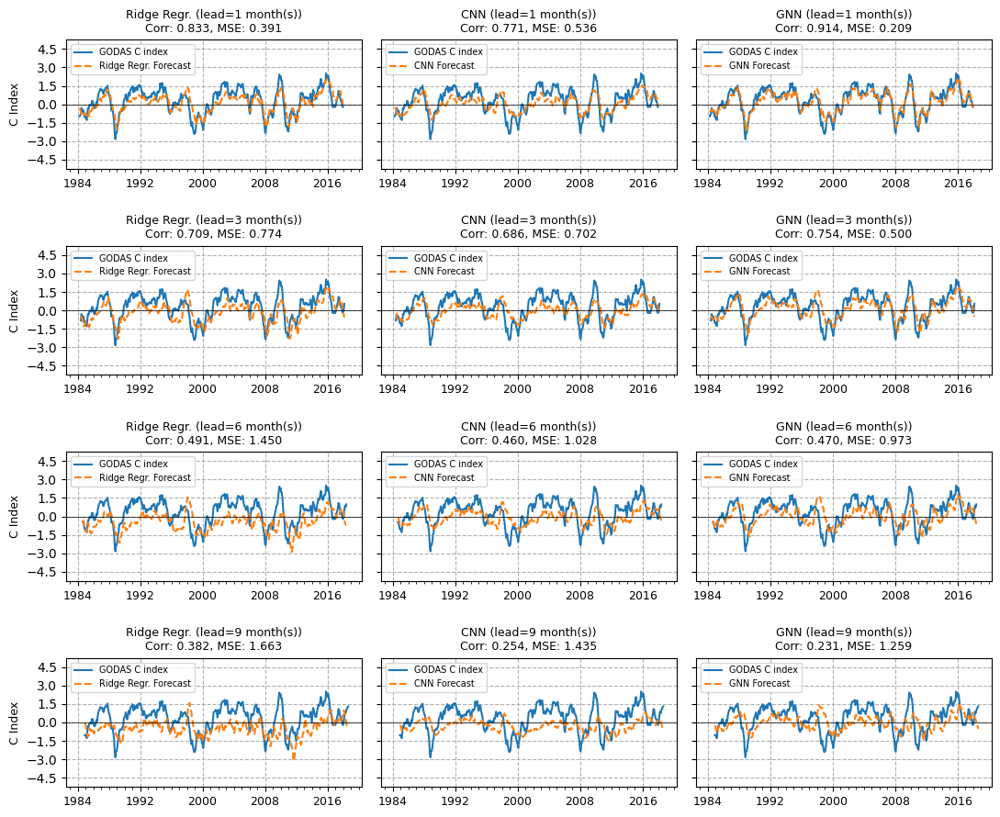

Saved _compare_ts_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_no_title.jpg to disk




In [102]:
# no title
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_compare_ts_{gnn_finetuning_results[target][-1]['experiment_name']}_no_title.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_and_compare_timeseries(
        target=target,  # List of targets
        model_results_dict=model_results_dict,  
        abs_v_max=abs_v_max, 
        selected_lead_times=[1, 3, 6, 9],  
        # selected_models=['Persistent Forecast', 'Ridge Regression', 'CNN', 'GNN'],  # List of models to plot
        selected_models=['Ridge Regr.', 'CNN', 'GNN'],  # List of models to plot
        suptitle=None,
        save_img=SAVE_PLOTS_TO_DISK, 
        img_filename=filename, 
        img_folder=IMG_FOLDER
    )
    print("\n" + "=" * 200 + "\n")

#### Plot correlations and MSE across lead times

In [103]:
correlation_dicts={
    'Persistence Forecast': pf_correlations,
    # 'Linear Regression': lr_correlations,
    'Ridge Regression': rr_correlations,
    'CNN': cnn_correlations,
    f'GNN - {SUBTITLE_SHORT}': gnn_correlations,
}
mse_dicts={
    'Persistence Forecast': pf_mses,
    # 'Linear Regression': lr_mses,
    'Ridge Regression': rr_mses,
    'CNN': cnn_mses,
    f'GNN - {SUBTITLE_SHORT}': gnn_mses,
}

# model_list = [persist, ridge,    cnn,     gnn, ]
# color_list = ['blue', 'orange', 'green', 'red', 'purple'] # matplolib standard colors
color_list = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'] # matplolib standard colors
# color_list = ['#1f77b4', '#2ca02c', '#d62728', '#ff7f0e'] # custom
alpha_list = [0.3, 0.3, 1, 1]

linestyle_list=['-', '-', '-', '--', '-']

In [104]:
gnn_subtitle

'Training set: MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G SST anomalies (1871-1953, 4,970 samples)\nFine-tuning set: HADISST SST anomalies (1871-1953, 994 samples). Test set: GODAS (1984-2017, 406 samples)\nSettings: Region 55S-60N, 180W-180E, Res=5x5, Win=3m, Batch=128, Epochs=20+20\nGraph structure: Corr > 0.9, MostEdgesCC\nModel: GCN2LayerConcat (EmbDims=250x250, Act=Tanh, BatchNorm=False, Dropout=0)\nOptimizer: SGD (LR=0.0001, WD=0, Momentum=0.80, Nesterov=True). Finetuning: LR=1e-05'

Target: E index


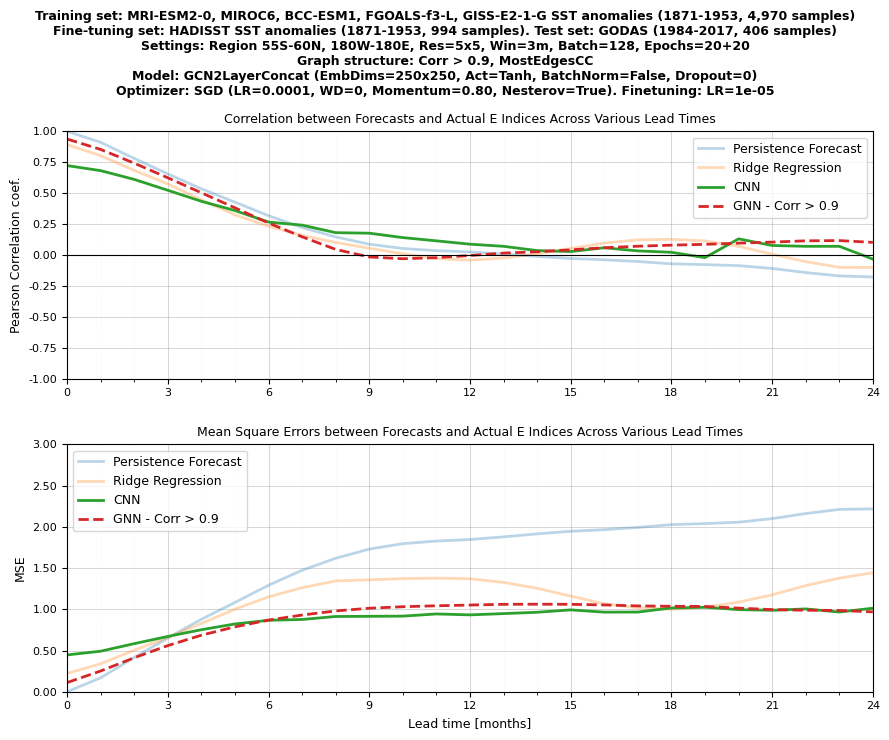

Saved _corr_mse_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E.jpg to disk


Target: C index


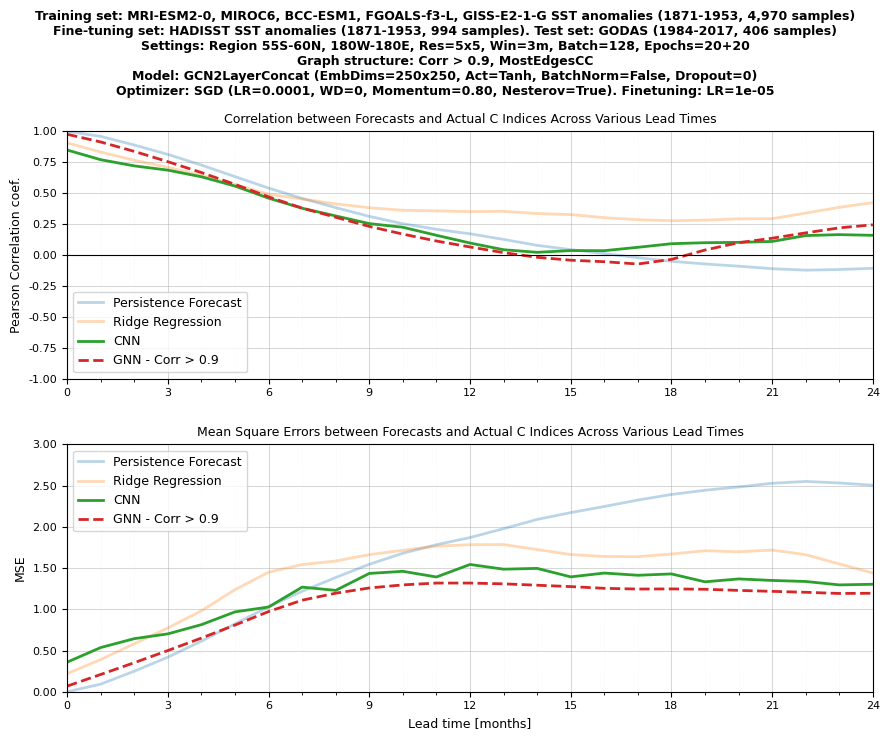

Saved _corr_mse_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C.jpg to disk




In [105]:
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_model_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=3, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### Same plot without a title

Target: E index


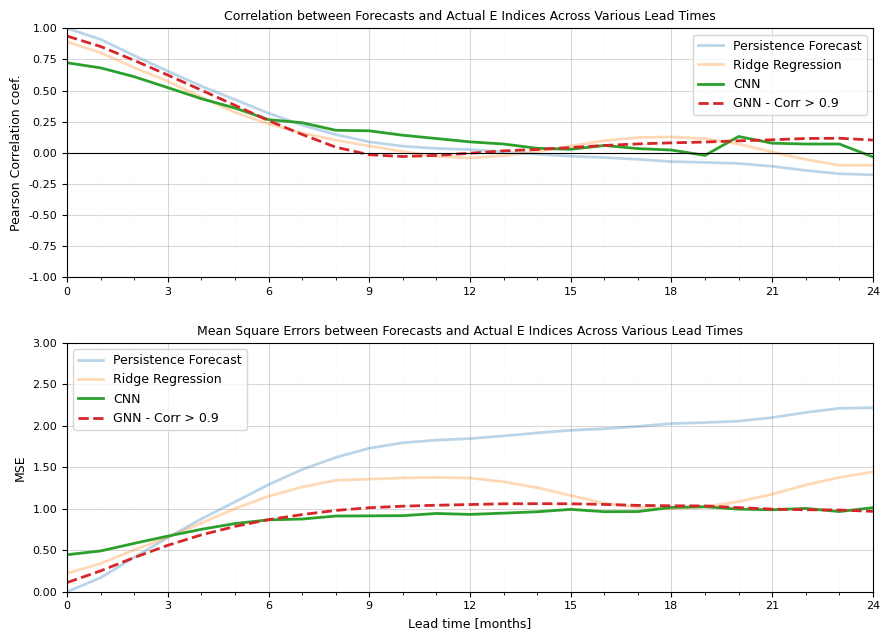

Saved _corr_mse_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_no_title.jpg to disk


Target: C index


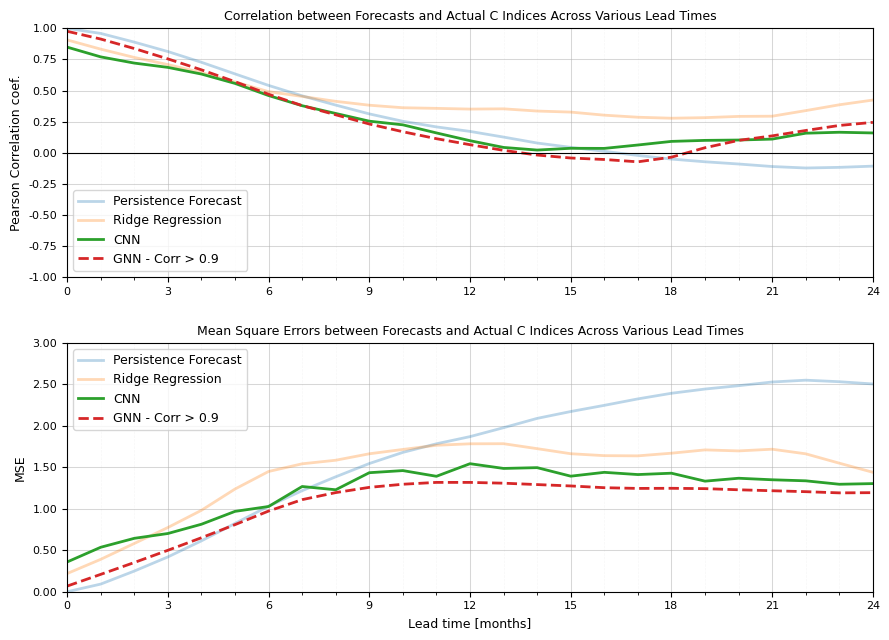

Saved _corr_mse_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_no_title.jpg to disk




In [106]:
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_model_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_no_title.jpg"
    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=3, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=None, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### zoom in

Target: E index


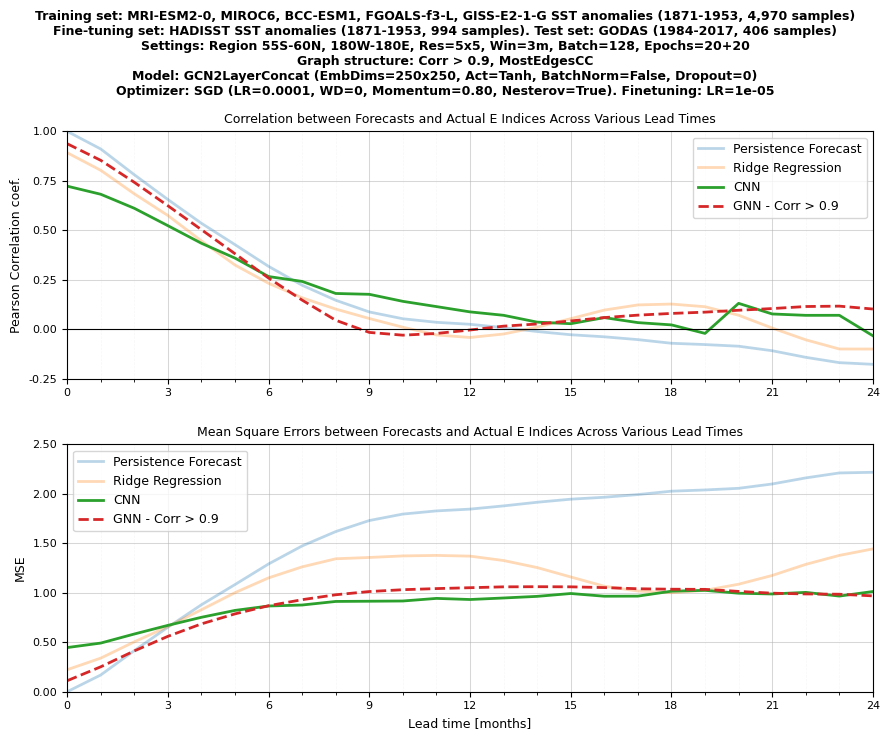

Saved _corr_mse_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_zm.jpg to disk


Target: C index


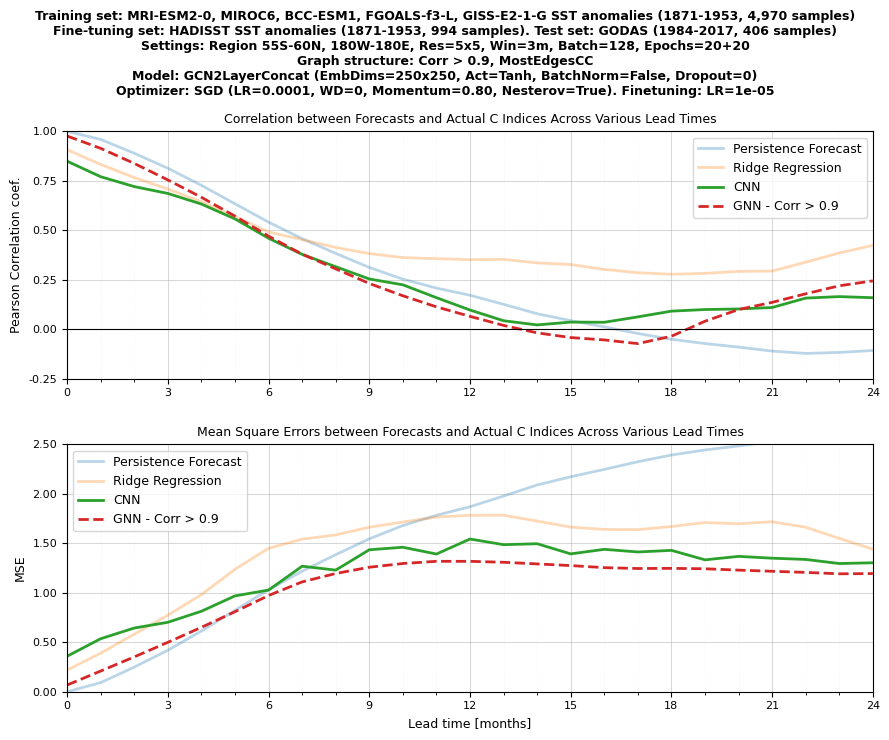

Saved _corr_mse_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_zm.jpg to disk




In [107]:
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_model_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_zm.jpg"


    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=2.5, corr_y_lim_min=-0.25, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### Same plot without a title

Target: E index


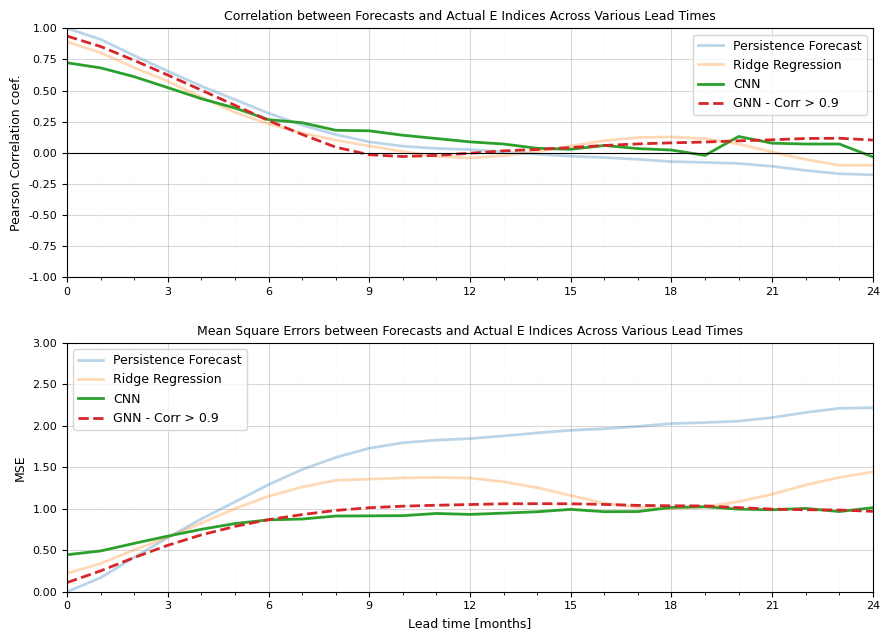

Saved _corr_mse_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_zm_no_title.jpg to disk


Target: C index


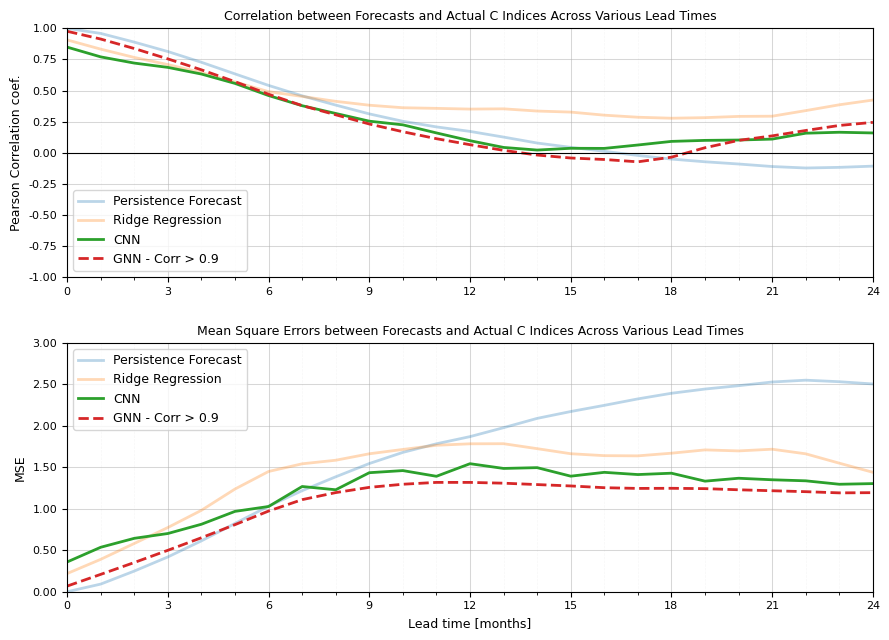

Saved _corr_mse_GCN2LConcat_250x250_Tanh_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_zm_no_title.jpg to disk




In [108]:
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_model_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_zm_no_title.jpg"
    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=3, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=None, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

### Ablation Study

#### Load GNN fine-tuning results from models trained with ALL CMIP data, and only selected ones

In [109]:
# Proxim
# experiment_datasources_names = {
#     "all_cmip" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD",
#     "sel_cmip" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD",
# }
# experiment_datasources_names

In [110]:
# Correlation
experiment_datasources_names = {
    "all_cmip" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD",
    "sel_cmip" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD",
}
experiment_datasources_names

{'all_cmip': 'GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD',
 'sel_cmip': 'GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD'}

In [111]:
gnn_finetuning_results_by_datasource = {}

In [112]:

for exp_source, exp_general_name in experiment_datasources_names.items():
    print("experience data source: ", exp_source)
    gnn_finetuning_results = {}

    for target in TARGETS:
        print(f"\n\n-----------------------------------------------------------------------")
        print(f"Target:         {target}")
    
        results_folder = target_to_results_folder.get(target)
        if results_folder is None:
            print(f"Unknown target {target}. Abort")
    
        print(f"\nLoad finetuning model results for target {target} from {results_folder}")
    
        gnn_results_filename = (
            f"results_tune_"
            f"{exp_general_name}_"
            f"{target.capitalize()}Idx"
            f".pkl"
        )
        print("gnn_results_filename: ", gnn_results_filename)
    
        # Load GNN results as pickle file
        folder = os.path.join(results_folder, "gnn")
        # print(folder)
        filename, filepath = graph_utils.find_file(folder, gnn_results_filename)
        with open(filepath, "rb") as file:
            gnn_finetuning_results[target] = pickle.load(file)
            print(f"• GNN finetuning results: {filepath}")
    
    gnn_finetuning_results_by_datasource[exp_source] = gnn_finetuning_results
    print(f"\n\n=================================================================================================================================")


experience data source:  all_cmip


-----------------------------------------------------------------------
Target:         E

Load finetuning model results for target E from saved_results/ec
gnn_results_filename:  results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx.pkl
• GNN finetuning results: saved_results/ec/gnn/results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_EIdx.pkl


-----------------------------------------------------------------------
Target:         C

Load finetuning model results for target C from saved_results/ec
gnn_results_filename:  results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD_CIdx.pkl
• GNN

In [113]:
gnn_finetuning_results_by_datasource.keys()

dict_keys(['all_cmip', 'sel_cmip'])

In [114]:
# extract correlations and mses
pf_correlations, lr_correlations, rr_correlations, cnn_correlations, gnn_correlations_all_cmip, gnn_correlations_sel_cmip = {}, {}, {}, {}, {}, {}
pf_mses, lr_mses, rr_mses, cnn_mses, gnn_mses_all_cmip, gnn_mses_sel_cmip = {}, {}, {}, {}, {}, {}
max_mses_pf_rr = 0

for target in TARGETS:
    
    pf_correlations[target] = [pf_dict['corr'] for pf_dict in persist_model_results[target]]
    lr_correlations[target] = [lr_dict['corr'] for lr_dict in lin_reg_results[target]]
    rr_correlations[target] = [rr_dict['corr'] for rr_dict in ridge_reg_results[target]]
    cnn_correlations[target] = [cnn_dict['corr'] for cnn_dict in cnn_finetuning_results[target]]
    gnn_correlations_all_cmip[target] = [gnn_dict['corr'] for gnn_dict in gnn_finetuning_results_by_datasource['all_cmip'][target]]
    gnn_correlations_sel_cmip[target] = [gnn_dict['corr'] for gnn_dict in gnn_finetuning_results_by_datasource['sel_cmip'][target]]
    
    

    pf_mses[target] = [pf_dict['mse'] for pf_dict in persist_model_results[target]]
    lr_mses[target] = [lr_dict['mse'] for lr_dict in lin_reg_results[target]]
    rr_mses[target] = [rr_dict['mse'] for rr_dict in ridge_reg_results[target]]
    cnn_mses[target] = [cnn_dict['mse'] for cnn_dict in cnn_finetuning_results[target]]
    gnn_mses_all_cmip[target] = [gnn_dict['mse'] for gnn_dict in gnn_finetuning_results_by_datasource['all_cmip'][target]]
    gnn_mses_sel_cmip[target] = [gnn_dict['mse'] for gnn_dict in gnn_finetuning_results_by_datasource['sel_cmip'][target]]

    # get the max value of pf and rr across targets to make the plots consistent
    max_mses_pf_rr = np.max((max_mses_pf_rr, np.max(pf_mses[target] + rr_mses[target])))
max_mses_pf_rr

2.5509917736053467

#### Compare time series predictions

In [115]:
model_results_dict = {
    'Persistent Forecast': persist_model_results,
    'Ridge Regr.': ridge_reg_results,
    'CNN': cnn_finetuning_results,
    'GNN (All CMIP)': gnn_finetuning_results_by_datasource['all_cmip'],
    'GNN (Sel CMIP)': gnn_finetuning_results_by_datasource['sel_cmip'],
}


In [116]:
['Persistent Forecast', 'GNN (All CMIP)', 'GNN (Sel CMIP)']

['Persistent Forecast', 'GNN (All CMIP)', 'GNN (Sel CMIP)']

Target: E index
Target: E index


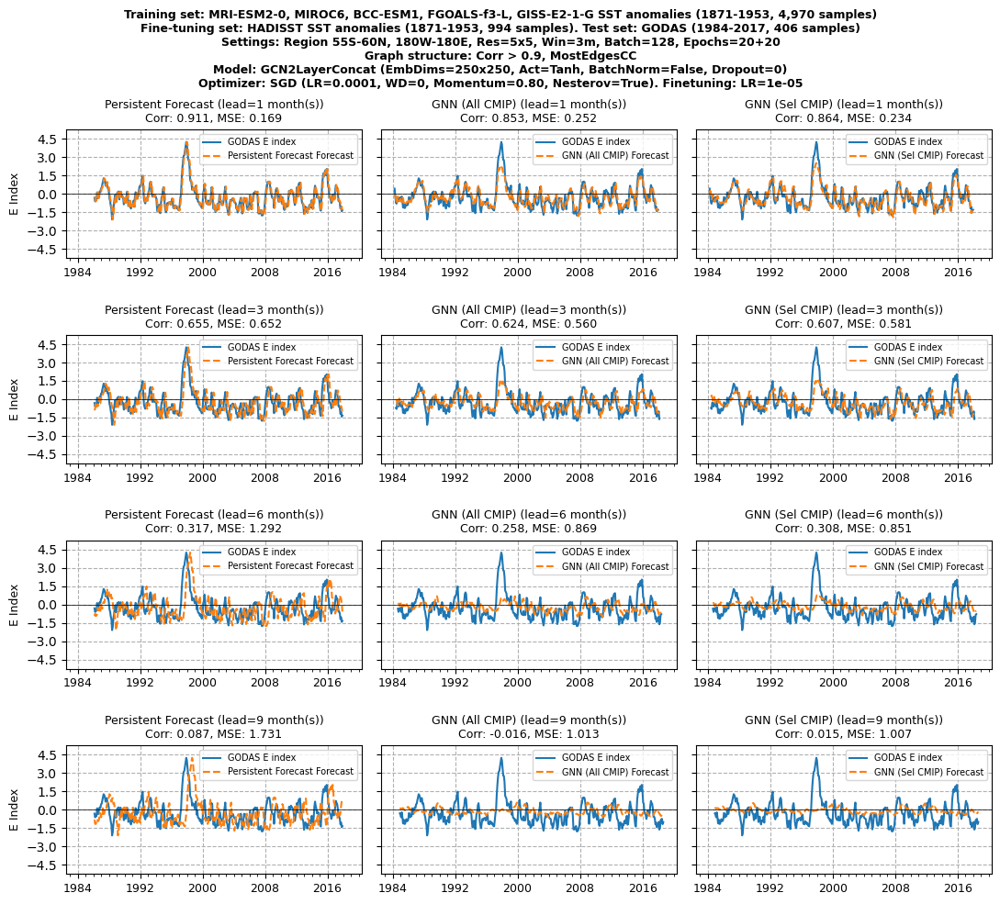

Saved _abl_dset_ts_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E.jpg to disk


Target: C index
Target: C index


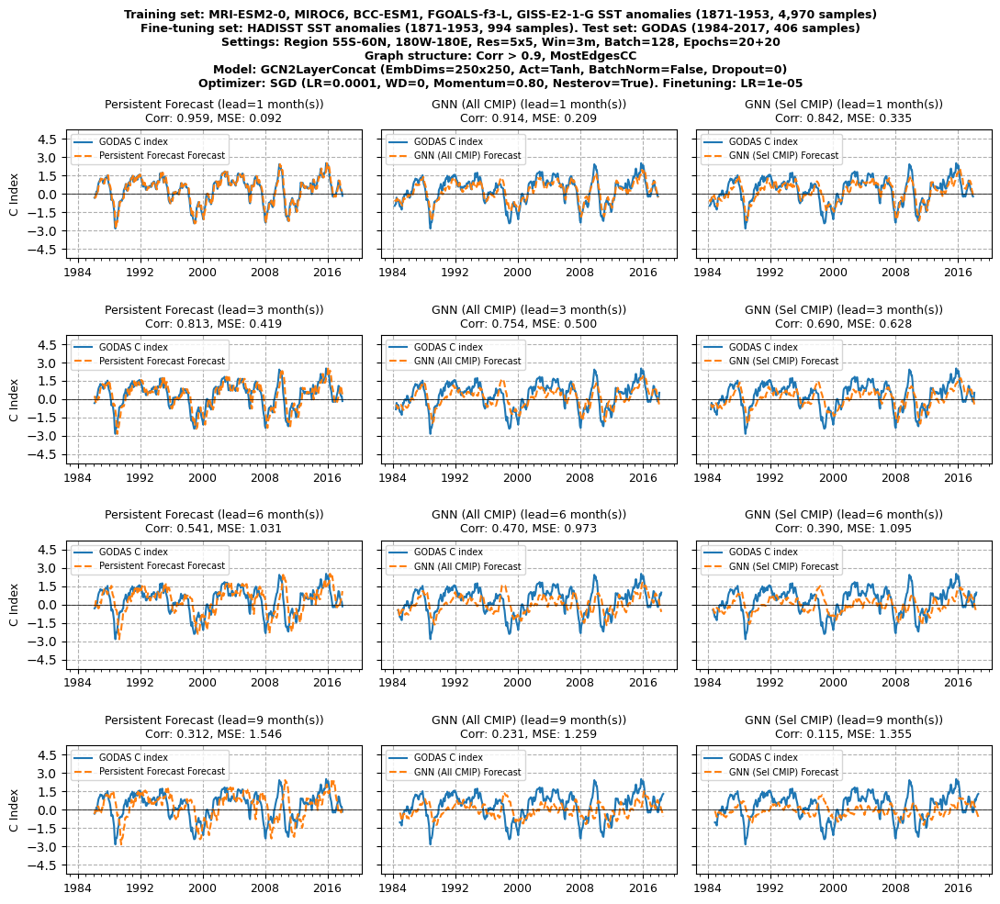

Saved _abl_dset_ts_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C.jpg to disk




In [117]:
# with title
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_abl_dset_ts_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_and_compare_timeseries(
        target=target,  # List of targets
        model_results_dict=model_results_dict,  
        abs_v_max=abs_v_max, 
        selected_lead_times=[1, 3, 6, 9],  
        selected_models=['Persistent Forecast', 'GNN (All CMIP)', 'GNN (Sel CMIP)'],  # List of models to plot
        suptitle=gnn_subtitle,
        save_img=SAVE_PLOTS_TO_DISK, 
        img_filename=filename, 
        img_folder=IMG_FOLDER
    )
    print("\n" + "=" * 200 + "\n")

Target: E index
Target: E index


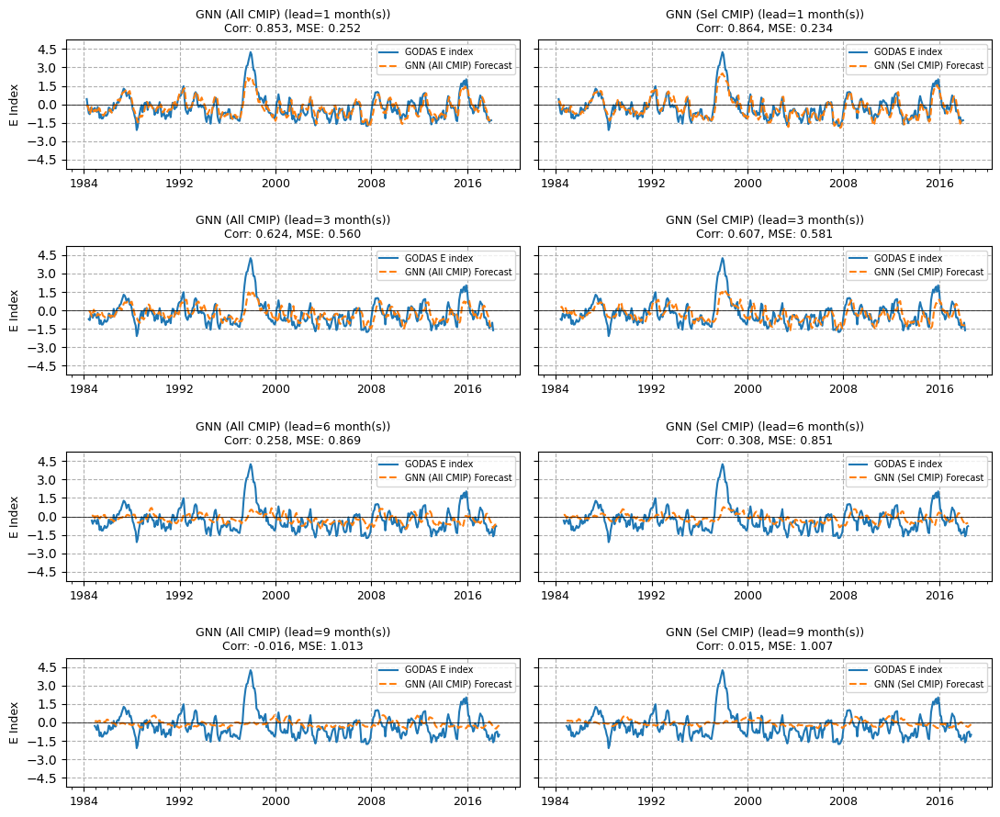

Saved _abl_dset_ts_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_no_title.jpg to disk


Target: C index
Target: C index


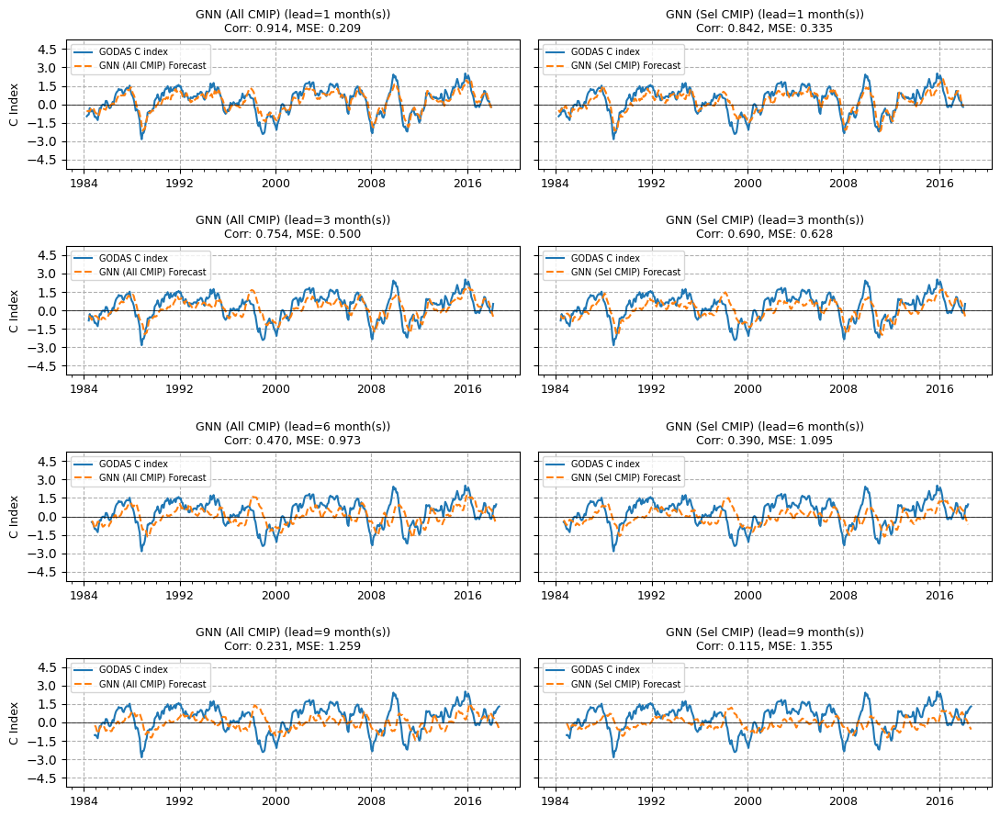

Saved _abl_dset_ts_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_no_title.jpg to disk




In [118]:
# no title
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_abl_dset_ts_{gnn_finetuning_results[target][-1]['experiment_name']}_no_title.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_and_compare_timeseries(
        target=target,  # List of targets
        model_results_dict=model_results_dict,  
        abs_v_max=abs_v_max, 
        selected_lead_times=[1, 3, 6, 9],  
        # selected_models=['Persistent Forecast', 'Ridge Regression', 'CNN', 'GNN'],  # List of models to plot
        # selected_models=['Ridge Regr.', 'CNN', 'GNN'],  # List of models to plot
        # selected_models=['Persistent Forecast', 'GNN (All CMIP)', 'GNN (Sel CMIP)'],  # List of models to plot
        selected_models=['GNN (All CMIP)', 'GNN (Sel CMIP)'],  # List of models to plot
        suptitle=None,
        save_img=SAVE_PLOTS_TO_DISK, 
        img_filename=filename, 
        img_folder=IMG_FOLDER
    )
    print("\n" + "=" * 200 + "\n")

#### Plot correlations and MSE across lead times

In [119]:
correlation_dicts={
    # 'Persistence Forecast': pf_correlations,
    # 'Linear Regression': lr_correlations,
    # 'Ridge Regression': rr_correlations,
    # 'CNN': cnn_correlations,
    'GNN (All CMIP)': gnn_correlations_all_cmip,
    'GNN (Sel CMIP)': gnn_correlations_sel_cmip,
}
mse_dicts={
    # 'Persistence Forecast': pf_mses,
    # 'Linear Regression': lr_mses,
    # 'Ridge Regression': rr_mses,
    # 'CNN': cnn_mses,
    'GNN (All CMIP)': gnn_mses_all_cmip,
    'GNN (Sel CMIP)': gnn_mses_sel_cmip,
}

# model_list = [persist, ridge,    cnn,     gnn, ]
# color_list = ['blue', 'orange', 'green', 'red', 'purple'] # matplolib standard colors
# color_list = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'] # matplolib standard colors
# color_list = ['#1f77b4', '#9467bd', '#2ca02c',  '#ff7f0e', '#d62728' ] # custom

# color_names = ['Blue', 'Muted Purple', 'Green', 'Orange', 'Red', 'Brown', 'Pink']
# color_list = ['#1f77b4', '#9467bd', '#2ca02c', '#ff7f0e', '#d62728', '#8c564b', '#e377c2']
# alpha_list = [0.3, 0.5, 1, 1, 1, 1, 1]
# linestyle_list=['-', '-', 'dotted', '--', '-', '-', '-']


color_names = ['Blue', 'Orange', 'Red', 'Muted Purple', 'Green', 'Brown', 'Pink']
color_list = ['#1f77b4', '#ff7f0e', '#d62728', '#9467bd', '#2ca02c', '#8c564b', '#e377c2']
alpha_list = [1, 1, 1, 1, 1, 1, 1]  # Increased transparency slightly for the less opaque lines
linestyle_list = ['-', '--', '-', '-.', '-', ':', '-']  # Added more varied linestyles
linewidth_list = [2, 2, 2.5, 2.5, 3, 3, 3]  # Increased line width for better visibility
marker_list = ['o', 's', '^', 'D', 'v', '<', '>']  # Added markers to distinguish lines further

In [120]:
gnn_subtitle

'Training set: MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G SST anomalies (1871-1953, 4,970 samples)\nFine-tuning set: HADISST SST anomalies (1871-1953, 994 samples). Test set: GODAS (1984-2017, 406 samples)\nSettings: Region 55S-60N, 180W-180E, Res=5x5, Win=3m, Batch=128, Epochs=20+20\nGraph structure: Corr > 0.9, MostEdgesCC\nModel: GCN2LayerConcat (EmbDims=250x250, Act=Tanh, BatchNorm=False, Dropout=0)\nOptimizer: SGD (LR=0.0001, WD=0, Momentum=0.80, Nesterov=True). Finetuning: LR=1e-05'

Target: E index


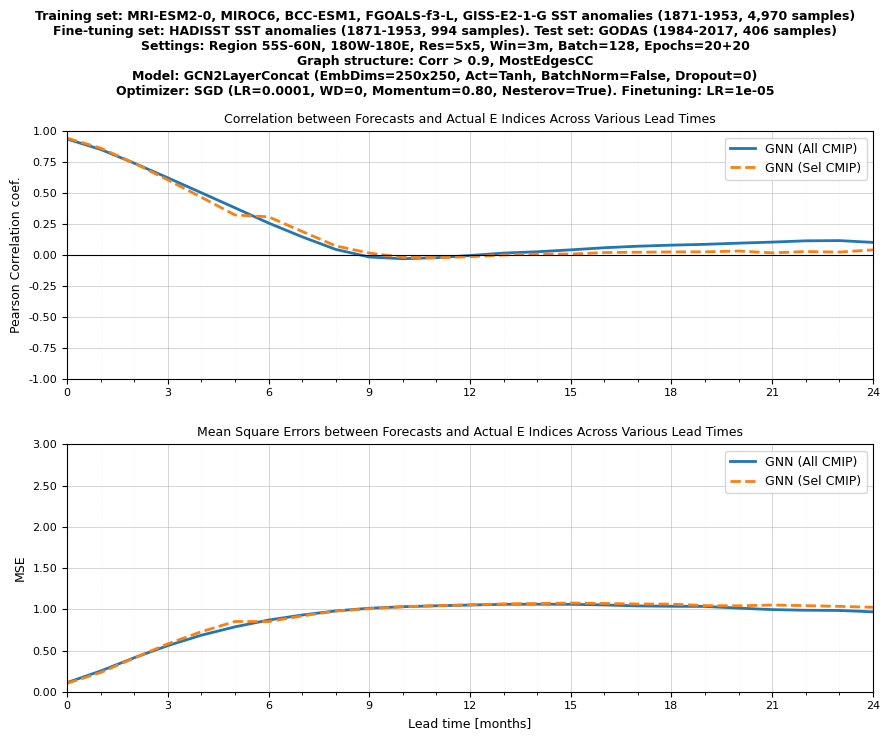

Saved _abl_dset_corr_mse_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E.jpg to disk


Target: C index


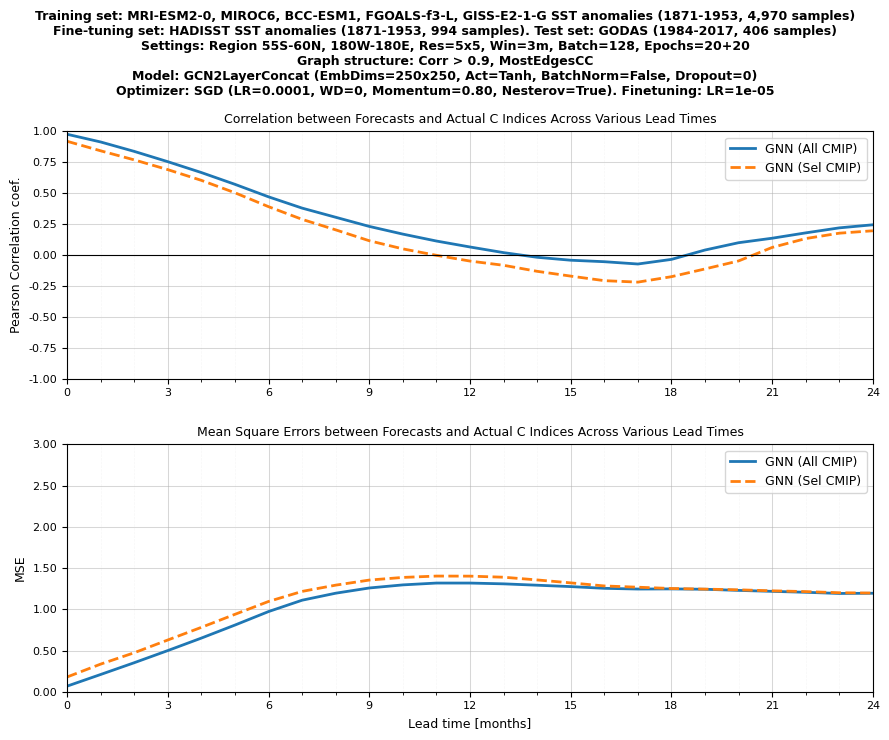

Saved _abl_dset_corr_mse_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C.jpg to disk




In [121]:
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_abl_dset_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=3, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### zoom in

Target: E index


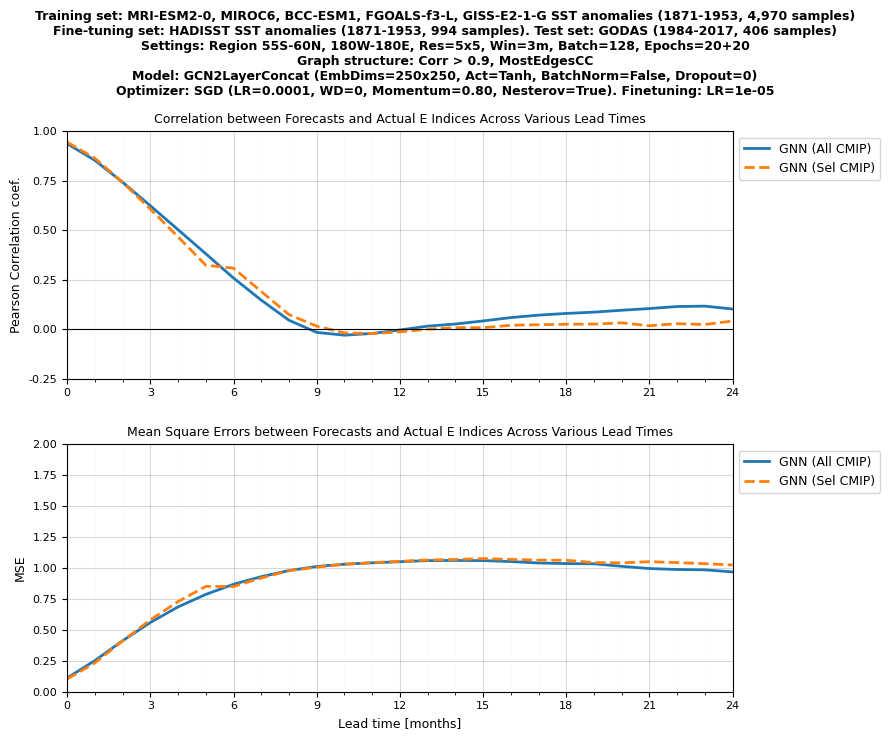

Saved _abl_dset_corr_mse_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_zm.jpg to disk


Target: C index


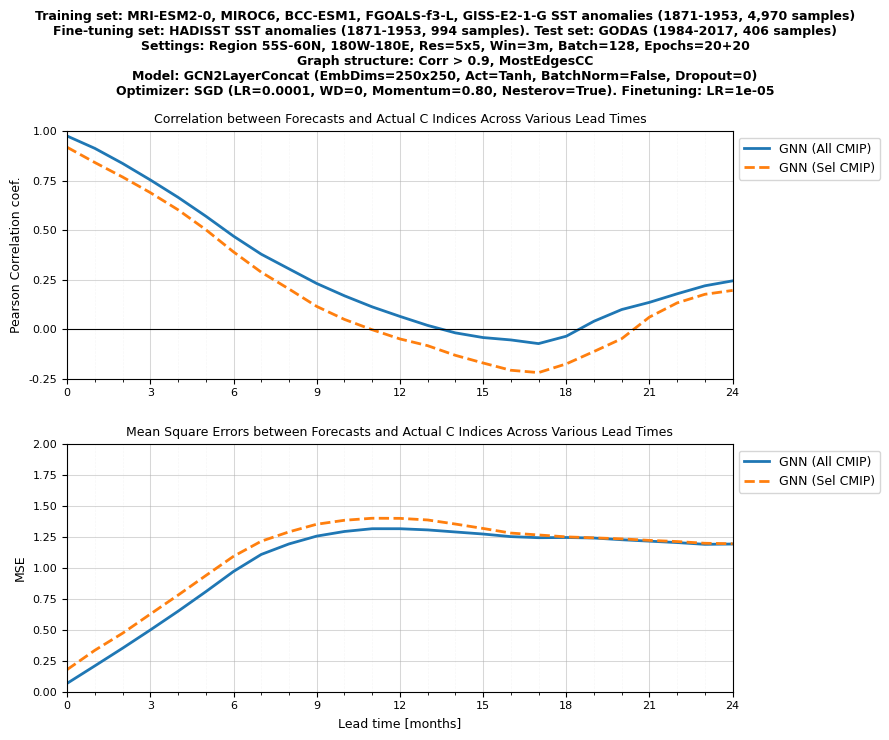

Saved _abl_dset_corr_mse_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_zm.jpg to disk




In [122]:
# zoom in 
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_abl_dset_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_zm.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=2, corr_y_lim_min=-0.25, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              linewidth_list=None, marker_list=None, legend_outside=True,
                              suptitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### Same plot without a title

Target: E index


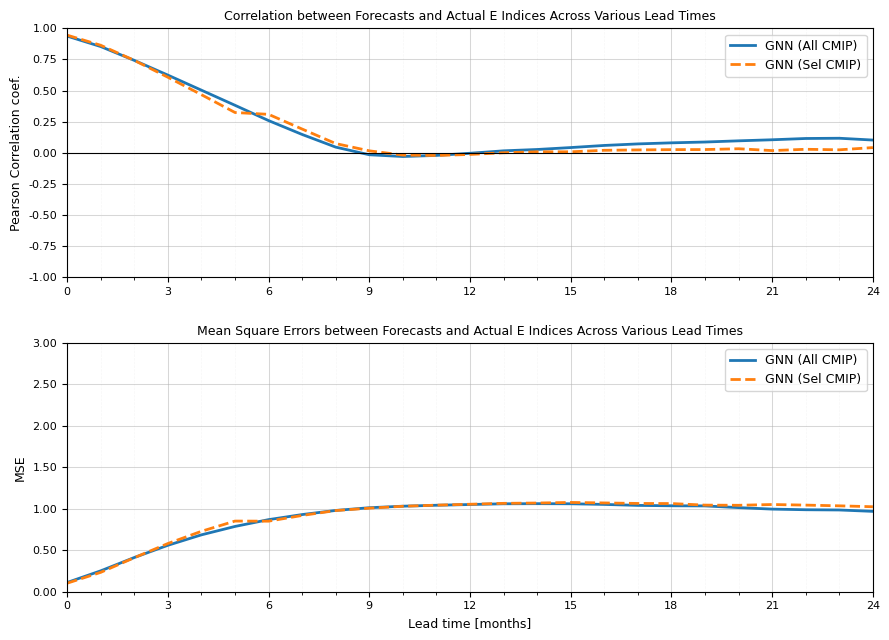

Saved _abl_dset_corr_mse_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_no_title.jpg to disk


Target: C index


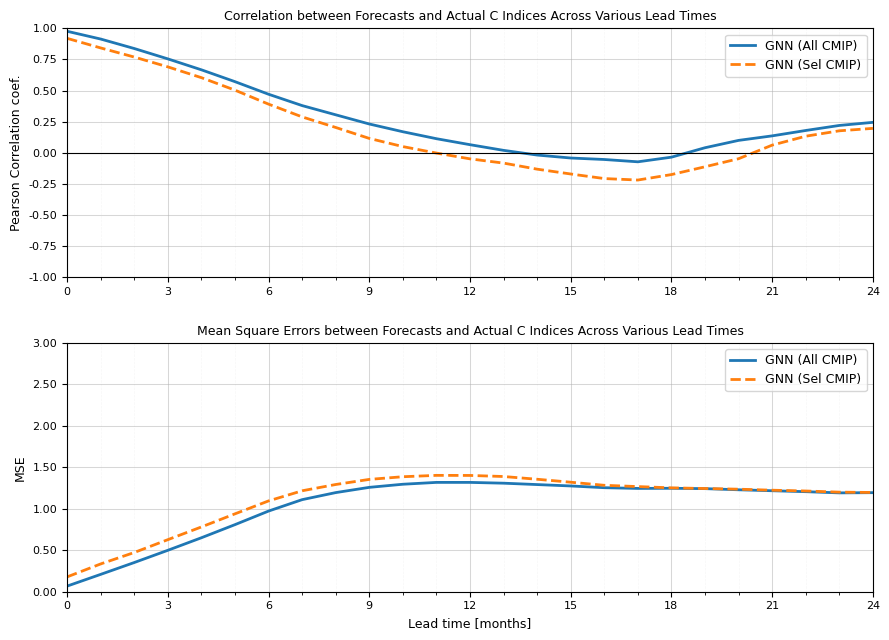

Saved _abl_dset_corr_mse_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_no_title.jpg to disk




In [123]:
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_abl_dset_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_no_title.jpg"
    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=3, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=None, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### zoom in 

Target: E index


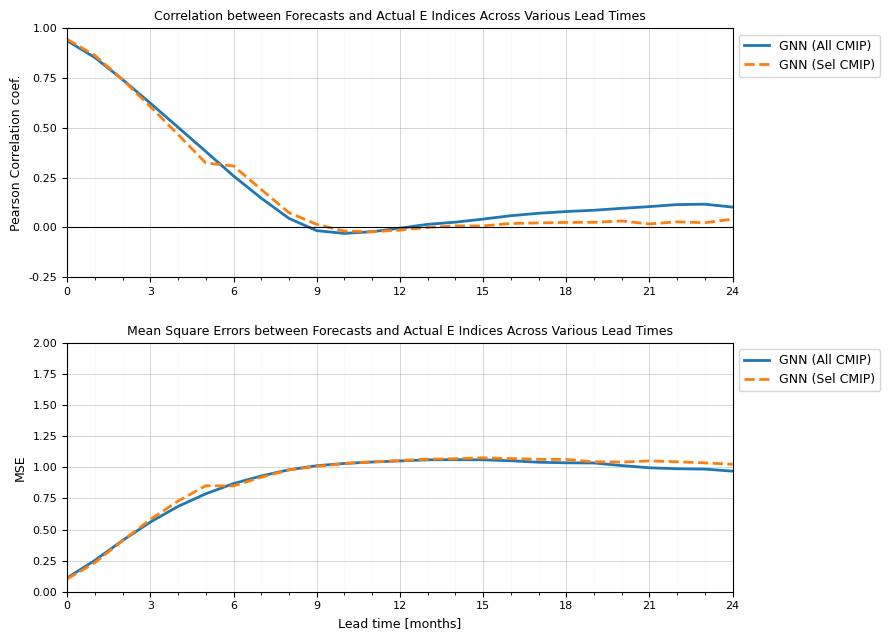

Saved _abl_dset_corr_mse_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_E_zm_no_title.jpg to disk


Target: C index


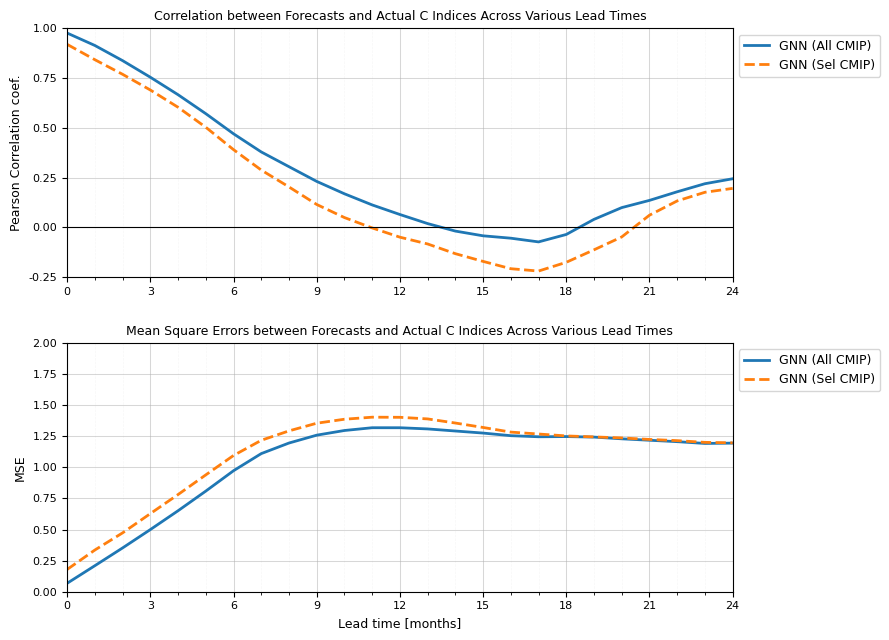

Saved _abl_dset_corr_mse_GCN2LConcat_250x250_Tanh_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_Win03_55S-60N_Res5_CorrThr090_MECC_C_zm_no_title.jpg to disk




In [124]:
# zoom in 
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_abl_dset_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_zm_no_title.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=2, corr_y_lim_min=-0.25, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              linewidth_list=None, marker_list=None, legend_outside=True,
                              suptitle=None, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

In [125]:
# aaaaaaa

### Compare GNN model types

#### Load corresponding results from PF, LR, RR

In [126]:
TRAIN_SOURCE_IDS_STR

'MRI-ESM2-0, MIROC6, BCC-ESM1, FGOALS-f3-L, GISS-E2-1-G'

In [127]:
TRAIN_SOURCE_IDS_FILENAME.replace("MRI_MIROC6_BCC_FGOALS_GISS", "CMIP6")

'CMIP6'

In [128]:
# persist_model_results, lin_reg_results, ridge_reg_results, cnn_results, gnn_results = {}, {}, {}, {}, {}
persist_model_results, lin_reg_results, ridge_reg_results, cnn_finetuning_results = {}, {}, {}, {}

for target in TARGETS:

    if target == "oni":
        results_folder = RESULTS_ONI_FOLDER
    elif target == "nino34":
        results_folder = RESULTS_NINO34_FOLDER
    elif target == "E":
        results_folder = RESULTS_EC_FOLDER
        target = 'E'
    elif target == "C":
        results_folder = RESULTS_EC_FOLDER
        target = 'C'
    else:
        print(f"Unknown target {target}. Abort")
    

    
    print(f"\nLoad model results for target {target} from {results_folder}")

    # search_term = f"{TEST_SOURCE_ID}_{target.capitalize()}"
    # print("search_term: ", search_term)

    search_term = (
        f"Train_{FINETUNE_SOURCE_IDS_STR}_"
        f"{train_start_year}-{train_end_year}_"
        f"Test_{TEST_SOURCE_ID_FILENAME}_"
        f"{test_start_year}-{test_end_year}_"
        f"Win{INPUT_TIME_STEPS:02d}_"
        f"{utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}_"
        f"Res{RESOLUTION}_"
        f"{target.capitalize()}Idx"
    )
    print("search_term: ", search_term)
    
    # Load persistent forecast results as pickle file
    folder = os.path.join(results_folder, "pf")
    filename, filepath = graph_utils.find_file(folder, search_term, file_extension='.pkl')
    print(filename, filepath)
    with open(filepath, "rb") as file:
        persist_model_results[target] = pickle.load(file)
        print(f"• PF: {filepath}")

    # Load Linear Regression results as pickle file
    folder = os.path.join(results_folder, "lr")
    filename, filepath = graph_utils.find_file(folder, search_term, file_extension='.pkl')
    with open(filepath, "rb") as file:
        lin_reg_results[target] = pickle.load(file)
        print(f"• LR: {filepath}")
                        
    # Load Ridge Regression results as pickle file
    folder = os.path.join(results_folder, "rr")
    filename, filepath = graph_utils.find_file(folder, search_term, file_extension='.pkl')
    with open(filepath, "rb") as file:
        ridge_reg_results[target] = pickle.load(file)
        print(f"• RR: {filepath}")

    cnn_search_term = (
        f"results_tune_CNN3L_"
        # f"Train_{TRAIN_SOURCE_IDS_FILENAME.replace('MRI_MIROC6_BCC_FGOALS_GISS', 'CMIP6')}_"
        f"Train_CMIP6_"
        f"Tune_{FINETUNE_SOURCE_IDS_STR}_"
        f"{train_start_year}-{train_end_year}_"
        f"Ep{NUM_EPOCHS_TRAIN:02d}-{NUM_EPOCHS_FINETUNE:02d}_"
        f"Test_{TEST_SOURCE_ID_FILENAME}_"
        f"{test_start_year}-{test_end_year}_"
        f"Win{INPUT_TIME_STEPS:02d}_"
        f"{utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}_"
        f"Res{RESOLUTION}_"
        f"Adam_"
        f"{target.capitalize()}Idx"
    )
    # print("cnn_search_term: ", cnn_search_term)

    # Load CNN finetuning results as pickle file
    folder = os.path.join(results_folder, "cnn")
    # print(folder)
    filename, filepath = graph_utils.find_file(folder, cnn_search_term, file_extension='.pkl')
    with open(filepath, "rb") as file:
        cnn_finetuning_results[target] = pickle.load(file)
        print(f"• CNN: {filepath}")


    # print("gnn_results_filename: ", gnn_results_filename)

    # # Load GNN results as pickle file
    # folder = os.path.join(results_folder, "gnn")
    # print(folder)
    # filename, filepath = graph_utils.find_file(folder, gnn_results_filename, file_extension='.pkl')
    # with open(filepath, "rb") as file:
    #     gnn_results[target] = pickle.load(file)
    #     print(f"• GNN: {filepath}")


Load model results for target E from saved_results/ec
search_term:  Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx
results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl saved_results/ec/pf/results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
• PF: saved_results/ec/pf/results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
• LR: saved_results/ec/lr/results_LR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
• RR: saved_results/ec/rr/results_RR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
• CNN: saved_results/ec/cnn/results_tune_CNN3L_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Adam_EIdx.pkl

Load model results for target C from saved_results/ec
search_term:  Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-18

#### Load GNN fine-tuning results from Proximiy, GLasso and Corr

In [129]:
print(EXPERIMENT_GENERAL_NAME)

GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD


#### ONI - 250x250 GNN, p000

In [130]:
# 250x250 gnn
experiment_types_names = {
    "proxim" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD",
    "glasso" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_GLasso030_MostEdgesCC_SGD",
    "corr" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD",
}
experiment_types_names

{'proxim': 'GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD',
 'glasso': 'GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_GLasso030_MostEdgesCC_SGD',
 'corr': 'GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD'}

#### E & C - 250x250 GNN, p000

In [138]:
# 250x250 gnn
experiment_types_names = {
    "proxim" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD",
    "corr" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD",
    "glasso" : "GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_GLasso030_MostEdgesCC_SGD",
}
experiment_types_names

{'proxim': 'GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD',
 'corr': 'GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr090_MostEdgesCC_SGD',
 'glasso': 'GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_GLasso030_MostEdgesCC_SGD'}

#### ONI - 100x200 gnn, p030, MIROC6_GISS datasets

In [139]:
# # 100x200 gnn, p030, MIROC6_GISS datasets
# experiment_types_names = {
#     "proxim" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD",
#     "glasso" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_GLasso025_MostEdgesCC_SGD",
#     "corr" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_MIROC6_GISS_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr085_MostEdgesCC_SGD"
# }
# experiment_types_names

#### ONI - 100x200 gnn, p030, CMIP datasets

In [140]:
# # 100x200 gnn, p030, CMIP datasets
# experiment_types_names = {
#     "proxim" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD",
#     "glasso" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_GLasso025_MostEdgesCC_SGD",
#     "corr" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr085_MostEdgesCC_SGD"
# }
# experiment_types_names

#### E & C indexes - 100x200 gnn, p030, CMIP datasets

In [141]:
# # 100x200 gnn, p030, CMIP datasets
# experiment_types_names = {
#     "proxim" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD",
#     "glasso" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_GLasso025_MostEdgesCC_SGD",
#     "corr" : "GCN2LayerConcat_100x200_Tanh_BnFalse_p030_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CorrThr085_MostEdgesCC_SGD"
# }
# experiment_types_names

In [142]:
gnn_finetuning_results_by_type = {}

In [143]:

for exp_type, exp_general_name in experiment_types_names.items():
    print("exp_type: ", exp_type)
    print("exp_general_name: ", exp_general_name)
    
    gnn_finetuning_results = {}

    for target in TARGETS:
        print(f"\n\n===========================================================================================")
        print(f"Target:         {target}")
            
        results_folder = target_to_results_folder.get(target)
        if results_folder is None:
            print(f"Unknown target {target}. Abort")
    
        print(f"\nLoad finetuning model results for target {target} from {results_folder}")
    
        gnn_results_filename = (
            f"results_tune_"
            f"{exp_general_name}_"
            f"{target.capitalize()}Idx"
            f".pkl"
        )
        print("gnn_results_filename: ", gnn_results_filename)
    
        # Load GNN results as pickle file
        folder = os.path.join(results_folder, "gnn")
        print("\nfolder: ", folder)
        filename, filepath = graph_utils.find_file(folder, gnn_results_filename)
        with open(filepath, "rb") as file:
            gnn_finetuning_results[target] = pickle.load(file)
            print(f"• GNN finetuning results: {filepath}")
    
    gnn_finetuning_results_by_type[exp_type] = gnn_finetuning_results

-------
exp_type:  proxim
exp_general_name:  GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD


Target:         E

Load finetuning model results for target E from saved_results/ec
gnn_results_filename:  results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD_EIdx.pkl

folder:  saved_results/ec/gnn
• GNN finetuning results: saved_results/ec/gnn/results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_Proxim_MostEdgesCC_SGD_EIdx.pkl


Target:         C

Load finetuning model results for target C from saved_results/ec
gnn_results_filename:  results_tune_GCN2LayerConcat_250x250_Tanh_BnFalse_p000_Train_CMIP6_Tune_HADISST_1871-1953_Ep20-20_Test_GODAS_1984-2017_Win03_55S-60N-180W-180

TypeError: cannot unpack non-iterable NoneType object

In [ ]:
gnn_finetuning_results_by_type.keys()

In [ ]:
# extract correlations and mses
pf_correlations, lr_correlations, rr_correlations, cnn_correlations, gnn_correlations_proxim, gnn_correlations_glasso, gnn_correlations_corr = {}, {}, {}, {}, {}, {}, {}
pf_mses, lr_mses, rr_mses, cnn_mses, gnn_mses_proxim, gnn_mses_glasso, gnn_mses_corr = {}, {}, {}, {}, {}, {}, {}
max_mses_pf_rr = 0

for target in TARGETS:
    
    pf_correlations[target] = [pf_dict['corr'] for pf_dict in persist_model_results[target]]
    lr_correlations[target] = [lr_dict['corr'] for lr_dict in lin_reg_results[target]]
    rr_correlations[target] = [rr_dict['corr'] for rr_dict in ridge_reg_results[target]]
    cnn_correlations[target] = [cnn_dict['corr'] for cnn_dict in cnn_finetuning_results[target]]
    gnn_correlations_proxim[target] = [gnn_dict['corr'] for gnn_dict in gnn_finetuning_results_by_type['proxim'][target]]
    gnn_correlations_glasso[target] = [gnn_dict['corr'] for gnn_dict in gnn_finetuning_results_by_type['glasso'][target]]
    gnn_correlations_corr[target] = [gnn_dict['corr'] for gnn_dict in gnn_finetuning_results_by_type['corr'][target]]
    

    pf_mses[target] = [pf_dict['mse'] for pf_dict in persist_model_results[target]]
    lr_mses[target] = [lr_dict['mse'] for lr_dict in lin_reg_results[target]]
    rr_mses[target] = [rr_dict['mse'] for rr_dict in ridge_reg_results[target]]
    cnn_mses[target] = [cnn_dict['mse'] for cnn_dict in cnn_finetuning_results[target]]
    gnn_mses_proxim[target] = [gnn_dict['mse'] for gnn_dict in gnn_finetuning_results_by_type['proxim'][target]]
    gnn_mses_glasso[target] = [gnn_dict['mse'] for gnn_dict in gnn_finetuning_results_by_type['glasso'][target]]
    gnn_mses_corr[target] = [gnn_dict['mse'] for gnn_dict in gnn_finetuning_results_by_type['corr'][target]]

    # get the max value of pf and rr across targets to make the plots consistent
    max_mses_pf_rr = np.max((max_mses_pf_rr, np.max(pf_mses[target] + rr_mses[target])))
max_mses_pf_rr

#### Compare time series predictions

In [ ]:
model_results_dict = {
    'Persistent Forecast': persist_model_results,
    'Ridge Regr.': ridge_reg_results,
    'CNN': cnn_finetuning_results,
    'GNN Proximity': gnn_finetuning_results_by_type['proxim'],
    'GNN GLasso': gnn_finetuning_results_by_type['glasso'],
    'GNN Correlation': gnn_finetuning_results_by_type['corr']
}


In [ ]:
['CNN', 'GNN Proximity', 'GNN GLasso', 'GNN Correlation']

In [ ]:
# with title
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_gnns_compare_ts_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_and_compare_timeseries(
        target=target,  # List of targets
        model_results_dict=model_results_dict,  
        abs_v_max=abs_v_max, 
        selected_lead_times=[1, 3, 6, 9],  
        # selected_models=['Persistent Forecast', 'Ridge Regression', 'CNN', 'GNN'],  # List of models to plot
        
        # selected_models=['Ridge Regr.', 'CNN', 'GNN'],  # List of models to plot
        selected_models=['GNN Proximity', 'GNN GLasso', 'GNN Correlation'],  # List of models to plot
        suptitle=gnn_subtitle,
        save_img=SAVE_PLOTS_TO_DISK, 
        img_filename=filename, 
        img_folder=IMG_FOLDER
    )
    print("\n" + "=" * 200 + "\n")

In [ ]:
# no title
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_gnns_compare_ts_{gnn_finetuning_results[target][-1]['experiment_name']}_no_title.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_and_compare_timeseries(
        target=target,  # List of targets
        model_results_dict=model_results_dict,  
        abs_v_max=abs_v_max, 
        selected_lead_times=[1, 3, 6, 9],  
        # selected_models=['Persistent Forecast', 'Ridge Regression', 'CNN', 'GNN'],  # List of models to plot
        # selected_models=['Ridge Regr.', 'CNN', 'GNN'],  # List of models to plot
        selected_models=['GNN Proximity', 'GNN GLasso', 'GNN Correlation'],  # List of models to plot
        suptitle=None,
        save_img=SAVE_PLOTS_TO_DISK, 
        img_filename=filename, 
        img_folder=IMG_FOLDER
    )
    print("\n" + "=" * 200 + "\n")

#### Plot correlations and MSE across lead times

In [ ]:
correlation_dicts={
    'Persistence Forecast': pf_correlations,
    'Linear Regr.': lr_correlations,
    'Ridge Regr. (α=100)': rr_correlations,
    'CNN': cnn_correlations,
    'GNN Proximity': gnn_correlations_proxim,
    'GNN GLasso (α=0.3)': gnn_correlations_glasso,
    'GNN Corr. (Thr>0.9)': gnn_correlations_corr,
}
mse_dicts={
    'Persistence Forecast': pf_mses,
    'Linear Regression': lr_mses,
    'Ridge Regr. (α=100)': rr_mses,
    'CNN': cnn_mses,
    'GNN Proximity': gnn_mses_proxim,
    'GNN GLasso (α=0.3)': gnn_mses_glasso,
    'GNN Corr. (Thr>0.9)': gnn_mses_corr,
}

# model_list = [persist, ridge,    cnn,     gnn, ]
# color_list = ['blue', 'orange', 'green', 'red', 'purple'] # matplolib standard colors
# color_list = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'] # matplolib standard colors
# color_list = ['#1f77b4', '#9467bd', '#2ca02c',  '#ff7f0e', '#d62728' ] # custom

# color_names = ['Blue', 'Muted Purple', 'Green', 'Orange', 'Red', 'Brown', 'Pink']
# color_list = ['#1f77b4', '#9467bd', '#2ca02c', '#ff7f0e', '#d62728', '#8c564b', '#e377c2']
# alpha_list = [0.3, 0.5, 1, 1, 1, 1, 1]
# linestyle_list=['-', '-', 'dotted', '--', '-', '-', '-']


color_names = ['Blue', 'Muted Purple', 'Green', 'Orange', 'Red', 'Brown', 'Pink']
# color_list = ['#1f77b4', '#9467bd', '#2ca02c', '#ff7f0e', '#d62728', '#8c564b', '#e377c2']
color_list = ['#8c564b', '#9467bd', '#2ca02c', '#ff7f0e', '#d62728', '#1f77b4', '#e377c2']
alpha_list = [0.5, 0.5, 0.7, 0.7, 1, 1, 1]  # Increased transparency slightly for the less opaque lines
# alpha_list = [0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 1]  # Increased transparency slightly for the less opaque lines
linestyle_list = ['-', '--', 'dotted', '-.', '-', '--', '-']  # Added more varied linestyles
linewidth_list = [2, 2, 2.5, 2.5, 3, 3, 3]  # Increased line width for better visibility
marker_list = ['o', 's', '^', 'D', 'v', '<', '>']  # Added markers to distinguish lines further

In [ ]:
gnn_subtitle

In [ ]:
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_gnns_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=3, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### zoom in

In [ ]:
# zoom in 
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_gnns_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_zm.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=2, corr_y_lim_min=-0.25, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              linewidth_list=None, marker_list=None, legend_outside=True,
                              suptitle=gnn_subtitle, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### Same plot without a title

In [ ]:
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_gnns_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_no_title.jpg"
    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=3, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=None, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

#### zoom in 

In [ ]:
# zoom in 
for target in TARGETS:
    print(f"Target: {target} index")
    filename = f"_gnns_corr_mse_{gnn_finetuning_results[target][-1]['experiment_name']}_zm_no_title.jpg"

    # shorten the filename for Overleaf upload (max 150 chars)
    substrings_to_remove = ["model_", "tune_", "BnFalse_p000_", "_1984-2017", "-180W-180E", "_SGD", "Idx", "_Lead24"]
    for substring in substrings_to_remove:
        filename = filename.replace(substring, "")
    filename = filename.replace("MostEdgesCC", "MECC")
    filename = filename.replace("Layer", "L")
    
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=2, corr_y_lim_min=-0.25, alpha_list=alpha_list, color_list=color_list, linestyle_list=linestyle_list, 
                              linewidth_list=None, marker_list=None, legend_outside=True,
                              suptitle=None, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")